In [ ]:
import igraph as ig
import random
import numpy as np
import matplotlib.pyplot as plt

# 初始化網絡參數
N = 1000  # 節點數
p = 0.01  # 感染概率
r = 0.005  # 恢復概率
w = 0.05  # 重接線概率
timesteps = 100

# 創建一個隨機網絡
g = ig.Graph.Erdos_Renyi(n=N, p=0.1)

# 初始化節點狀態，0 表示易感(S)，1 表示感染(I)
states = [0] * N
initial_infected = random.sample(range(N), 10)  # 隨機選擇初始感染者
for i in initial_infected:
    states[i] = 1

# 定義重接線函數
def rewire(graph, u, v):
    """重接線: 易感者 u 斷開與感染者 v 的連接，並隨機連接到另一個易感者"""
    graph.delete_edges([(u, v)])
    susceptible_nodes = [n for n in range(N) if states[n] == 0 and not graph.are_connected(u, n)]
    if susceptible_nodes:
        new_v = random.choice(susceptible_nodes)
        graph.add_edges([(u, new_v)])

# 模擬過程
infected_fraction = []
for t in range(timesteps):
    new_states = states.copy()
    for edge in g.es:
        u, v = edge.tuple
        # 如果是SI連接，可能發生感染或重接線
        if states[u] != states[v]:
            if states[u] == 0 and random.random() < p:
                new_states[u] = 1
            elif states[v] == 0 and random.random() < p:
                new_states[v] = 1
            # 重接線過程
            if states[u] == 0 and states[v] == 1 and random.random() < w:
                rewire(g, u, v)
            elif states[u] == 1 and states[v] == 0 and random.random() < w:
                rewire(g, v, u)
    
    # 恢復過程
    for i in range(N):
        if states[i] == 1 and random.random() < r:
            new_states[i] = 0

    states = new_states.copy()
    infected_fraction.append(sum(states) / N)

# 繪製感染比例隨時間變化的圖
plt.plot(infected_fraction)
plt.xlabel("Time")
plt.ylabel("Infected Fraction")
plt.show()


In [ ]:
import igraph as ig
import random
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm  # 用於顯示進度條

# 初始化網絡參數
N = 1000  # 節點數
r = 0.005  # 恢復概率
timesteps = 1000  # 模擬步數
w_values = [0.0, 0.1, 0.3]  # 不同的重接線概率
p_values = np.linspace(0.0005, 0.01, 20)  # 不同的感染概率範圍

# 創建進度條
total_steps = len(w_values) * len(p_values)
progress_bar = tqdm(total=total_steps)

def rewire(graph, u, v):
    """重接線: 易感者 u 斷開與感染者 v 的連接，並隨機連接到另一個易感者"""
    graph.delete_edges([(u, v)])
    susceptible_nodes = [n for n in range(N) if states[n] == 0 and not graph.are_connected(u, n)]
    if susceptible_nodes:
        new_v = random.choice(susceptible_nodes)
        graph.add_edges([(u, new_v)])

def simulate_epidemic(p, w):
    """根據感染概率 p 和重接線概率 w 模擬疾病傳播"""
    # 創建一個隨機網絡
    g = ig.Graph.Erdos_Renyi(n=N, p=0.01)
    states = [0] * N  # 所有節點初始化為易感(S)
    initial_infected = random.sample(range(N), 10)  # 隨機選擇初始感染者
    for i in initial_infected:
        states[i] = 1

    infected_fraction = []
    for t in range(timesteps):
        new_states = states.copy()
        for edge in g.es:
            u, v = edge.tuple
            # 如果是SI連接，可能發生感染或重接線
            if states[u] != states[v]:
                if states[u] == 0 and random.random() < p:
                    new_states[u] = 1
                elif states[v] == 0 and random.random() < p:
                    new_states[v] = 1
                # 重接線過程
                if states[u] == 0 and states[v] == 1 and random.random() < w:
                    rewire(g, u, v)
                elif states[u] == 1 and states[v] == 0 and random.random() < w:
                    rewire(g, v, u)
        
        # 恢復過程
        for i in range(N):
            if states[i] == 1 and random.random() < r:
                new_states[i] = 0

        states = new_states.copy()
        infected_fraction.append(sum(states) / N)

    # 返回穩定的感染比例
    return np.mean(infected_fraction[-100:])  # 使用最後100個步驟的平均值作為穩定值

# 存儲結果
results = {w: [] for w in w_values}

# 遍歷不同的重接線概率和感染概率
for w in w_values:
    for p in p_values:
        # 進行模擬並記錄結果
        final_infected = simulate_epidemic(p, w)
        results[w].append(final_infected)
        progress_bar.update(1)  # 更新進度條

progress_bar.close()  # 結束進度條

# 繪製結果
plt.figure(figsize=(10, 6))
for w in w_values:
    plt.plot(p_values, results[w], label=f"w = {w}")

plt.xlabel("Infection Probability (p)")
plt.ylabel("Final Infected Fraction")
plt.title("Epidemic Dynamics on Adaptive Network (SIS Model)")
plt.legend()
plt.grid(True)
plt.show()


100%|██████████| 123/123 [23:19<00:00, 11.38s/it]


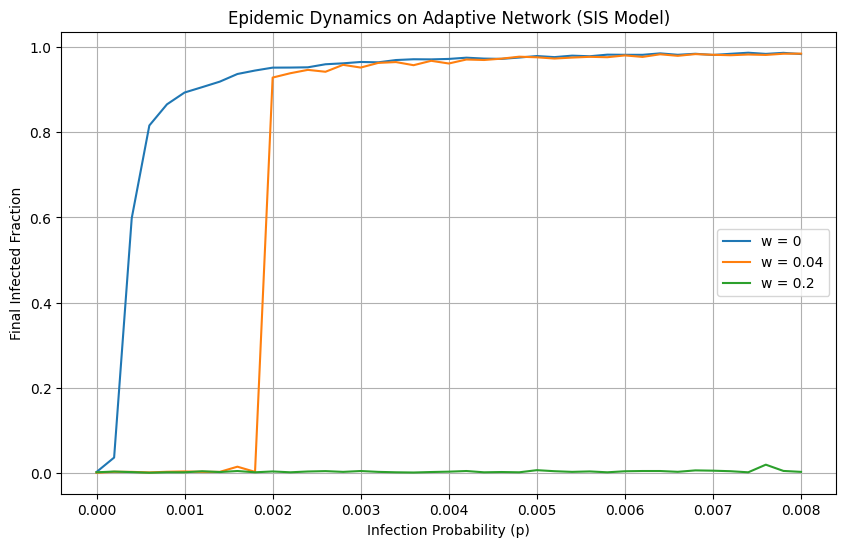

In [2]:
import igraph as ig
import random
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm  # 用於顯示進度條

# 初始化網絡參數
N = 1000  # 節點數
r = 0.002  # 恢復概率
timesteps = 1000  # 模擬步數
K = 10000  # 雙向連接數
w_values = [0, 0.04, 0.2]  # 不同的重接線概率
p_values = np.linspace(0, 0.008, 41)  # 不同的感染概率範圍

# 創建進度條
total_steps = len(w_values) * len(p_values)
progress_bar = tqdm(total=total_steps)

def rewire(graph, u, v, states):
    """重接線: 易感者 u 斷開與感染者 v 的連接，並隨機連接到另一個易感者"""
    graph.delete_edges([(u, v)])
    susceptible_nodes = [n for n in range(N) if states[n] == 0 and not graph.are_adjacent(u, n)]
    if susceptible_nodes:
        new_v = random.choice(susceptible_nodes)
        graph.add_edges([(u, new_v)])

def simulate_epidemic(p, w):
    """根據感染概率 p 和重接線概率 w 模擬疾病傳播"""
    # 創建一個隨機網絡，包含 N 個節點和 K 個雙向連接
    g = ig.Graph.Erdos_Renyi(n=N, m=K)
    states = [0] * N  # 所有節點初始化為易感(S)
    initial_infected = random.sample(range(N), 10)  # 隨機選擇初始感染者
    for i in initial_infected:
        states[i] = 1

    infected_fraction = []
    for t in range(timesteps):
        new_states = states.copy()
        for edge in g.es:
            u, v = edge.tuple
            # 如果是SI連接，可能發生感染或重接線
            if states[u] != states[v]:
                if states[u] == 0 and random.random() < p:
                    new_states[u] = 1
                elif states[v] == 0 and random.random() < p:
                    new_states[v] = 1
                # 重接線過程
                if states[u] == 0 and states[v] == 1 and random.random() < w:
                    rewire(g, u, v, states)
                elif states[u] == 1 and states[v] == 0 and random.random() < w:
                    rewire(g, v, u, states)
        
        # 恢復過程
        for i in range(N):
            if states[i] == 1 and random.random() < r:
                new_states[i] = 0

        states = new_states.copy()
        infected_fraction.append(sum(states) / N)

    # 返回穩定的感染比例
    return np.mean(infected_fraction[-100:])  # 使用最後100個步驟的平均值作為穩定值

# 存儲結果
results = {w: [] for w in w_values}

# 遍歷不同的重接線概率和感染概率
for w in w_values:
    for p in p_values:
        # 進行模擬並記錄結果
        final_infected = simulate_epidemic(p, w)
        results[w].append(final_infected)
        progress_bar.update(1)  # 更新進度條

progress_bar.close()  # 結束進度條

# 繪製結果
plt.figure(figsize=(10, 6))
for w in w_values:
    plt.plot(p_values, results[w], label=f"w = {w}")

plt.xlabel("Infection Probability (p)")
plt.ylabel("Final Infected Fraction")
plt.title("Epidemic Dynamics on Adaptive Network (SIS Model)")
plt.legend()
plt.grid(True)
plt.show()


100%|██████████| 410/410 [2:28:33<00:00, 21.74s/it]  


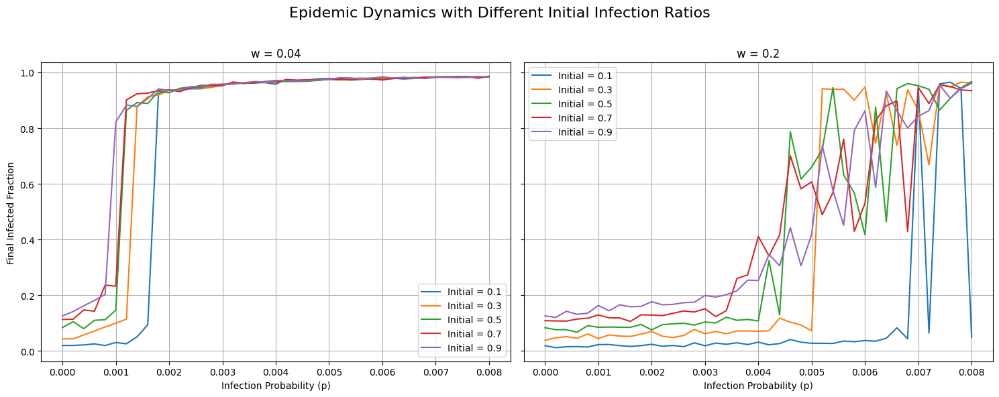

In [3]:
import igraph as ig
import random
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm  # 用於顯示進度條

# 初始化網絡參數
N = 1000  # 節點數
r = 0.002  # 恢復概率
timesteps = 1000  # 模擬步數
K = 10000  # 雙向連接數
w_values = [0.04, 0.2]  # 針對特定的重接線概率進行測試
p_values = np.linspace(0, 0.008, 41)  # 不同的感染概率範圍
initial_infection_ratios = [0.1, 0.3, 0.5, 0.7, 0.9]  # 不同初始感染比例

# 創建進度條
total_steps = len(w_values) * len(p_values) * len(initial_infection_ratios)
progress_bar = tqdm(total=total_steps)

def rewire(graph, u, v, states):
    """重接線: 易感者 u 斷開與感染者 v 的連接，並隨機連接到另一個易感者"""
    graph.delete_edges([(u, v)])
    susceptible_nodes = [n for n in range(N) if states[n] == 0 and not graph.are_adjacent(u, n)]
    if susceptible_nodes:
        new_v = random.choice(susceptible_nodes)
        graph.add_edges([(u, new_v)])

def simulate_epidemic(p, w, initial_infection_ratio):
    """根據感染概率 p、重接線概率 w 和初始感染比例進行疾病傳播模擬"""
    # 創建一個隨機網絡，包含 N 個節點和 K 個雙向連接
    g = ig.Graph.Erdos_Renyi(n=N, m=K)
    states = [0] * N  # 所有節點初始化為易感(S)

    # 初始化部分節點為感染者，根據初始感染比例設置
    initial_infected = random.sample(range(N), int(N * initial_infection_ratio))
    for i in initial_infected:
        states[i] = 1

    infected_fraction = []
    for t in range(timesteps):
        new_states = states.copy()
        for edge in g.es:
            u, v = edge.tuple
            # 如果是SI連接，可能發生感染或重接線
            if states[u] != states[v]:
                if states[u] == 0 and random.random() < p:
                    new_states[u] = 1
                elif states[v] == 0 and random.random() < p:
                    new_states[v] = 1
                # 重接線過程
                if states[u] == 0 and states[v] == 1 and random.random() < w:
                    rewire(g, u, v, states)
                elif states[u] == 1 and states[v] == 0 and random.random() < w:
                    rewire(g, v, u, states)
        
        # 恢復過程
        for i in range(N):
            if states[i] == 1 and random.random() < r:
                new_states[i] = 0

        states = new_states.copy()
        infected_fraction.append(sum(states) / N)

    # 返回穩定的感染比例
    return np.mean(infected_fraction[-100:])  # 使用最後100個步驟的平均值作為穩定值

# 存儲結果
results = {w: {ratio: [] for ratio in initial_infection_ratios} for w in w_values}

# 遍歷不同的重接線概率、感染概率和初始感染比例
for w in w_values:
    for ratio in initial_infection_ratios:
        for p in p_values:
            # 進行模擬並記錄結果
            final_infected = simulate_epidemic(p, w, ratio)
            results[w][ratio].append(final_infected)
            progress_bar.update(1)  # 更新進度條

progress_bar.close()  # 結束進度條

# 繪製結果
fig, axes = plt.subplots(1, len(w_values), figsize=(15, 6), sharey=True)
fig.suptitle("Epidemic Dynamics with Different Initial Infection Ratios", fontsize=16)

for i, w in enumerate(w_values):
    ax = axes[i]
    for ratio in initial_infection_ratios:
        ax.plot(p_values, results[w][ratio], label=f"Initial = {ratio:.1f}")
    ax.set_title(f"w = {w}")
    ax.set_xlabel("Infection Probability (p)")
    ax.grid(True)
    if i == 0:
        ax.set_ylabel("Final Infected Fraction")
    ax.legend()

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


In [4]:
from projectq import MainEngine  # import the main compiler engine
from projectq.ops import (
    H,
    Measure,
)  # import the operations we want to perform (Hadamard and measurement)

eng = MainEngine()  # create a default compiler (the back-end is a simulator)
qubit = eng.allocate_qubit()  # allocate 1 qubit

H | qubit  # apply a Hadamard gate
Measure | qubit  # measure the qubit

eng.flush()  # flush all gates (and execute measurements)
print(f"Measured {int(qubit)}")  # output measurement result

Measured 0


In [11]:
from qiskit import QuantumCircuit
from qiskit.primitives import Sampler
from qiskit.visualization import plot_histogram
import matplotlib.pyplot as plt

# 創建一個量子電路，包含2個量子位和2個經典位
qc = QuantumCircuit(2, 2)

# 添加量子門
qc.h(0)          # 在第1個量子位上應用 Hadamard 門，創建疊加態
qc.cx(0, 1)      # 在第1個量子位（控制位）和第2個量子位（目標位）之間應用 CNOT 門，創建糾纏

# 將量子位的測量結果存入經典位
qc.measure([0, 1], [0, 1])

# 顯示量子電路
print(qc.draw())

# 使用新的 Sampler 來執行量子電路模擬
sampler = Sampler()
job = sampler.run([qc])  # 將量子電路放入列表中
result = job.result()

# 獲取測量結果的概率分布
probabilities = result.quasi_dists[0]
print("\n測量結果的概率分布:", probabilities)

# 轉換為直方圖格式 (模擬 1000 次)
counts = {bitstring: int(prob * 1000) for bitstring, prob in probabilities.items()}
print("\n轉換後的測量結果 (模擬 1000 次):", counts)

# 繪製結果直方圖
plot_histogram(counts)
plt.show()


     ┌───┐     ┌─┐   
q_0: ┤ H ├──■──┤M├───
     └───┘┌─┴─┐└╥┘┌─┐
q_1: ─────┤ X ├─╫─┤M├
          └───┘ ║ └╥┘
c: 2/═══════════╩══╩═
                0  1 

測量結果的概率分布: {0: 0.5, 3: 0.5}

轉換後的測量結果 (模擬 1000 次): {0: 499, 3: 499}


C:\Users\ASUS\AppData\Local\Temp\ipykernel_47936\1334114538.py:20: DeprecationWarning: The class ``qiskit.primitives.sampler.Sampler`` is deprecated as of qiskit 1.2. It will be removed no earlier than 3 months after the release date. All implementations of the `BaseSamplerV1` interface have been deprecated in favor of their V2 counterparts. The V2 alternative for the `Sampler` class is `StatevectorSampler`.
  sampler = Sampler()


In [3]:
import qiskit
from qiskit_aer.primitives import SamplerV2

# Generate 3-qubit GHZ state
circ = qiskit.QuantumCircuit(3)
circ.h(0)
circ.cx(0, 1)
circ.cx(1, 2)
circ.measure_all()

# Construct an ideal simulator with SamplerV2
sampler = SamplerV2()
job = sampler.run([circ], shots=128)

# Perform an ideal simulation
result_ideal = job.result()
counts_ideal = result_ideal[0].data.meas.get_counts()
print('Counts(ideal):', counts_ideal)

Counts(ideal): {'111': 64, '000': 64}


In [17]:
from qiskit import QuantumCircuit, transpile
from qiskit_aer import AerSimulator
from qiskit.visualization import plot_histogram
import matplotlib.pyplot as plt

# 創建一個量子電路，包含2個量子位和2個經典位
qc = QuantumCircuit(2, 2)

# 添加量子門
qc.h(0)          # 在第1個量子位上應用 Hadamard 門，創建疊加態
qc.cx(0, 1)      # 在第1個量子位（控制位）和第2個量子位（目標位）之間應用 CNOT 門，創建糾纏

# 將量子位的測量結果存入經典位
qc.measure([0, 1], [0, 1])

# 顯示量子電路
print(qc.draw())

# 使用 AerSimulator 進行模擬
simulator = AerSimulator()
# 將量子電路轉換為適合模擬的格式
compiled_circuit = transpile(qc, simulator)

# 執行模擬並獲取結果
job = simulator.run(compiled_circuit, shots=1000)  # 設定模擬次數為1000
result = job.result()

# 獲取測量結果的計數
counts = result.get_counts(compiled_circuit)
print("\n測量結果:", counts)

# 繪製結果直方圖
plot_histogram(counts)
plt.show()


     ┌───┐     ┌─┐   
q_0: ┤ H ├──■──┤M├───
     └───┘┌─┴─┐└╥┘┌─┐
q_1: ─────┤ X ├─╫─┤M├
          └───┘ ║ └╥┘
c: 2/═══════════╩══╩═
                0  1 

測量結果: {'11': 511, '00': 489}


In [19]:
from qiskit import QuantumCircuit, transpile
from qiskit_aer import AerSimulator
from qiskit.visualization import plot_histogram
import matplotlib.pyplot as plt

# 創建量子電路，這裡假設量子位數為8，與描述一致
qc = QuantumCircuit(8, 8)

# 根據描述設置量子門
qc.x(0)
qc.x(1)
qc.h(1)  # 在量子位1上應用Hadamard門
qc.cx(0, 1)  # 在量子位0（控制）和量子位1（目標）之間應用CNOT門

# 進行其他量子位的旋轉操作和Swap門
qc.x(1)  # 在量子位1上應用X門
qc.swap(0, 1)  # 在量子位0和1之間交換

# 更多旋轉操作，根據提供的描述進行旋轉
qc.u(0.1, 0, 0, 1)  # 在量子位1上應用旋轉門
qc.u(-0.1, 0, 0, 2)  # 在量子位2上應用旋轉門

# 測量量子位並將結果存儲到經典位
qc.measure([0, 1, 2, 3, 4, 5, 6, 7], [0, 1, 2, 3, 4, 5, 6, 7])

# 顯示量子電路
print(qc.draw())

# 使用AerSimulator進行模擬
simulator = AerSimulator()

# 將量子電路轉換為適合模擬的格式
compiled_circuit = transpile(qc, simulator)

# 執行模擬並獲取結果
job = simulator.run(compiled_circuit, shots=1000)
result = job.result()

# 獲取測量結果的計數
counts = result.get_counts(compiled_circuit)
print("\n測量結果:", counts)

# 繪製結果直方圖
plot_histogram(counts)
plt.show()


          ┌───┐                                     ┌─┐   
q_0: ─────┤ X ├────────────■────────X───────────────┤M├───
          ├───┤     ┌───┐┌─┴─┐┌───┐ │ ┌────────────┐└╥┘┌─┐
q_1: ─────┤ X ├─────┤ H ├┤ X ├┤ X ├─X─┤ U(0.1,0,0) ├─╫─┤M├
     ┌────┴───┴────┐└───┘└───┘└───┘   └────┬─┬─────┘ ║ └╥┘
q_2: ┤ U(-0.1,0,0) ├───────────────────────┤M├───────╫──╫─
     └─────┬─┬─────┘                       └╥┘       ║  ║ 
q_3: ──────┤M├──────────────────────────────╫────────╫──╫─
           └╥┘       ┌─┐                    ║        ║  ║ 
q_4: ───────╫────────┤M├────────────────────╫────────╫──╫─
            ║        └╥┘  ┌─┐               ║        ║  ║ 
q_5: ───────╫─────────╫───┤M├───────────────╫────────╫──╫─
            ║         ║   └╥┘  ┌─┐          ║        ║  ║ 
q_6: ───────╫─────────╫────╫───┤M├──────────╫────────╫──╫─
            ║         ║    ║   └╥┘ ┌─┐      ║        ║  ║ 
q_7: ───────╫─────────╫────╫────╫──┤M├──────╫────────╫──╫─
            ║         ║    ║    ║  └╥┘      ║        ║  

In [ ]:
from qiskit import QuantumCircuit, transpile
from qiskit_aer import AerSimulator
from qiskit.visualization import plot_histogram
import matplotlib.pyplot as plt

# 創建量子電路，包含3個量子位和3個經典位
qc = QuantumCircuit(3, 3)

# 感染過程
qc.crx(0.1, 0, 2)       # 第一顆 qubit 控制輔助 qubit

qc.rccx( 0, 1, 2)  

qc.cx(2, 1)       # 輔助 qubit 控制第二顆 qubit
qc.x(1)           # 翻轉第二顆 qubit 的狀態 (感染狀態)
qc.swap(1, 2)     # 交換第一顆和第二顆 qubit

# 添加測量，將量子位的狀態存儲到經典位
qc.measure([0, 1, 2], [0, 1, 2])

# 顯示量子電路
print(qc.draw())

# 使用 Qiskit 的 AerSimulator 模擬該量子電路
simulator = AerSimulator()
compiled_circuit = transpile(qc, simulator)
result = simulator.run(compiled_circuit, shots=1000).result()

# 獲取測量結果
counts = result.get_counts(compiled_circuit)
print("\n測量結果:", counts)

# 繪製結果直方圖
plot_histogram(counts)
plt.show()


                          ┌─┐              
q_0: ─────■───────■───────┤M├──────────────
          │       │  ┌───┐└╥┘┌───┐   ┌─┐   
q_1: ─────┼───────■──┤ X ├─╫─┤ X ├─X─┤M├───
     ┌────┴────┐┌─┴─┐└─┬─┘ ║ └───┘ │ └╥┘┌─┐
q_2: ┤ Rx(0.1) ├┤ X ├──■───╫───────X──╫─┤M├
     └─────────┘└───┘      ║          ║ └╥┘
c: 3/══════════════════════╩══════════╩══╩═
                           0          1  2 

測量結果: {'100': 1000}


In [12]:
from qiskit import QuantumCircuit, transpile
from qiskit_aer import AerSimulator
from qiskit.visualization import plot_histogram
import matplotlib.pyplot as plt

# 創建量子電路，包含3個量子位和3個經典位
qc = QuantumCircuit(3, 3)

# 初始化控制位
qc.rx(1.57, 0)  # 將第0個量子位設置為 |1⟩
# qc.rx(1.57, 1)  # 將第1個量子位設置為 |1⟩

# 使用輔助量子位模擬多控制條件
qc.rccx(0, 1, 2)  # 當 q0 和 q1 都為 1 時，翻轉輔助量子位 q2

# 對目標量子位應用受控旋轉
qc.crx(1.57, 2, 1)  # 當輔助位 q2 為 1 時，對 q1 應用 RX 門旋轉 π/2（1.57 弧度）

# 恢復輔助量子位
qc.crx(-1.57, 0, 1)  # 還原輔助量子位 q2 的狀態

# 添加測量
qc.measure([0, 1, 2], [0, 1, 2])

# 顯示量子電路
print(qc.draw())

# 使用模擬器執行
simulator = AerSimulator()
compiled_circuit = transpile(qc, simulator)
result = simulator.run(compiled_circuit, shots=1000).result()

# 獲取測量結果
counts = result.get_counts(compiled_circuit)
print("\n測量結果:", counts)

# 繪製結果直方圖
plot_histogram(counts)
plt.show()


     ┌──────────┐┌───────┐                         ┌─┐   
q_0: ┤ Rx(1.57) ├┤0      ├──────────────────■──────┤M├───
     └──────────┘│       │┌──────────┐┌─────┴─────┐└╥┘┌─┐
q_1: ────────────┤1 Rccx ├┤ Rx(1.57) ├┤ Rx(-1.57) ├─╫─┤M├
                 │       │└────┬─────┘└────┬─┬────┘ ║ └╥┘
q_2: ────────────┤2      ├─────■───────────┤M├──────╫──╫─
                 └───────┘                 └╥┘      ║  ║ 
c: 3/═══════════════════════════════════════╩═══════╩══╩═
                                            2       0  1 

測量結果: {'000': 512, '011': 244, '001': 244}


      ┌───┐┌───────┐                   ┌───────┐                            »
 q_0: ┤ X ├┤0      ├─────────────■─────┤0      ├─────────────■──────────────»
      └───┘│       │┌───────┐┌───┴────┐│       │             │     ┌───────┐»
 q_1: ─────┤1      ├┤ Rx(2) ├┤ Rx(-2) ├┤       ├─────────────┼─────┤0      ├»
           │       │└───┬───┘└────────┘│       │┌───────┐┌───┴────┐│       │»
 q_2: ─────┤       ├────┼──────────────┤1      ├┤ Rx(2) ├┤ Rx(-2) ├┤1      ├»
           │  Rccx │    │              │       │└───┬───┘└────────┘│       │»
 q_3: ─────┤       ├────┼──────────────┤  Rccx ├────┼──────────────┤       ├»
           │       │    │              │       │    │              │       │»
 q_4: ─────┤       ├────┼──────────────┤       ├────┼──────────────┤  Rccx ├»
           │       │    │              │       │    │              │       │»
 q_5: ─────┤2      ├────■──────────────┤       ├────┼──────────────┤       ├»
           └───────┘                   │       │    │           

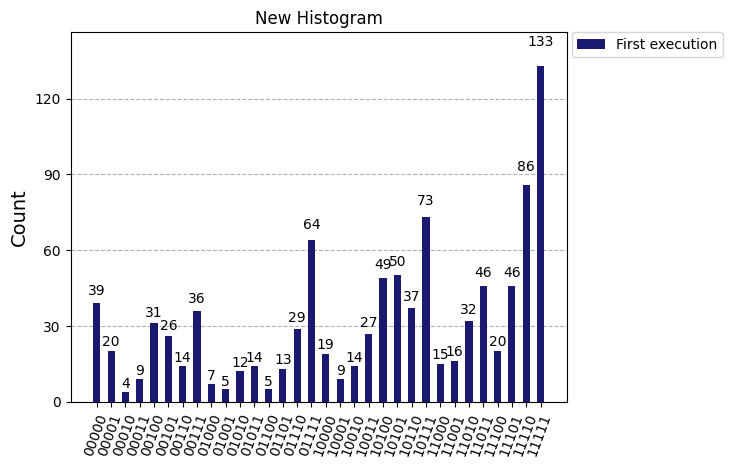

In [15]:
from qiskit import QuantumCircuit, transpile
from qiskit_aer import AerSimulator
from qiskit.visualization import plot_histogram
import matplotlib.pyplot as plt

# 節點和連結設定
num_people = 5  # 5個人
connections = [(0, 1), (0, 2), (1, 2), (1, 3), (2, 4), (3, 4)]  # 6條連結
num_steps = 2  # 模擬步驟數
#傳染係數與恢復係數
infect_rate = 2
recover_rate = 1
# 計算所需量子位數量
num_auxiliary = len(connections) * num_steps * 2  # 每條連結在每一步需要兩個輔助量子位
total_qubits = num_people + num_auxiliary

# 創建量子電路，包含經典位來存儲測量結果
qc = QuantumCircuit(total_qubits, num_people)

# 初始化量子態：將第 0 顆量子位設置為傳染者
qc.x(0)

# 傳染和恢復過程
aux_index = num_people  # 輔助量子位的起始索引
for step in range(num_steps):
    # 傳染過程
    for src, tgt in connections:
        qc.rccx(src, tgt, aux_index)  # 傳染者影響目標者
        qc.crx(infect_rate, aux_index, tgt)  # 傳染概率為 0.5
        qc.crx(-infect_rate, src, tgt)       # 補償效應
        aux_index += 1

    # 恢復過程
    for person in range(num_people):
        qc.cx(person, aux_index)       # 恢復過程的輔助量子位
        qc.crx(-recover_rate, aux_index, person)  # 恢復概率為 0.2
        aux_index += 1

# 測量量子位
qc.measure(range(num_people), range(num_people))

# 顯示量子電路
print(qc.draw())

# 使用模擬器執行電路
simulator = AerSimulator()
compiled_circuit = transpile(qc, simulator)
result = simulator.run(compiled_circuit, shots=1000).result()

# 獲取測量結果
counts = result.get_counts(compiled_circuit)
print("\n測量結果:", counts)

# 繪製結果直方圖
legend = ['First execution']
plot_histogram([counts], legend=legend, color=['midnightblue'],
title="New Histogram")
# plt.show()



In [16]:
import random
from qiskit import QuantumCircuit, transpile
from qiskit_aer import AerSimulator
import matplotlib.pyplot as plt

# 使用 qasm_simulator 後端
simulator = AerSimulator(method='stabilizer')

# 節點和連結設定
num_people = 10  # 人數
num_connections = 20  # 連線數量
connections = [(random.randint(0, num_people - 1), random.randint(0, num_people - 1)) for _ in range(num_connections)]
connections = list(set([conn for conn in connections if conn[0] != conn[1]]))  # 移除自連
print(f"Generated {len(connections)} unique connections.")

num_steps = 20  # 模擬總步驟數
measure_interval = 2  # 每幾個步驟執行一次測量
infection_counts = []  # 記錄每次測量後的感染人數

# 初始化模擬器
simulator = AerSimulator()

# 初始化狀態：初始時只有第0個人感染
initial_state = [1] + [0] * (num_people - 1)  # q0 是感染者，其餘是易感者

for step in range(1, num_steps + 1):
    # 計算所需的輔助量子位數量
    num_auxiliary = len(connections) * 2  # 每條連結需要兩個輔助量子位
    total_qubits = num_people + num_auxiliary

    # 創建量子電路
    qc = QuantumCircuit(total_qubits, num_people)

    # 初始化量子位：根據前一次的測量結果設置初始狀態
    for i, state in enumerate(initial_state):
        if state == 1:
            qc.x(i)  # 將感染者設置為 |1>

    # 傳染過程
    aux_index = num_people  # 輔助量子位的起始索引
    for src, tgt in connections:
        qc.rccx(src, tgt, aux_index)  # 傳染者影響目標者
        qc.crx(1, aux_index, tgt)  # 傳染概率為 0.5
        qc.crx(-1, src, tgt)       # 補償效應
        aux_index += 1

    # 恢復過程
    for person in range(num_people):
        qc.cx(person, aux_index)       # 恢復過程的輔助量子位
        qc.crx(-0.1, aux_index, person)  # 恢復概率為 0.2
        aux_index += 1

    # 每隔 measure_interval 步驟執行一次測量
    if step % measure_interval == 0:
        qc.measure(range(num_people), range(num_people))
        compiled_circuit = transpile(qc, simulator)
        result = simulator.run(compiled_circuit, shots=1).result()  # 執行一次測量
        counts = result.get_counts()

        # 解析測量結果，更新初始狀態
        measured_state = list(counts.keys())[0]  # 獲取測量結果（如 '10100'）
        initial_state = [int(bit) for bit in measured_state[::-1]]  # 更新初始狀態

        # 記錄感染人數
        infection_counts.append(sum(initial_state))

# 可視化感染人數的變化
plt.figure(figsize=(10, 6))
steps = list(range(measure_interval, num_steps + 1, measure_interval))
plt.plot(steps, infection_counts, marker='o', linestyle='-')
plt.xlabel("Step")
plt.ylabel("Number of Infected People")
plt.title("Epidemic Spread Simulation Over 20 Steps")
plt.grid(True)
plt.show()


Generated 16 unique connections.


CircuitTooWideForTarget: 'Number of qubits (42) in circuit-245 is greater than maximum (29) in the coupling_map'

Generated 61 unique connections.


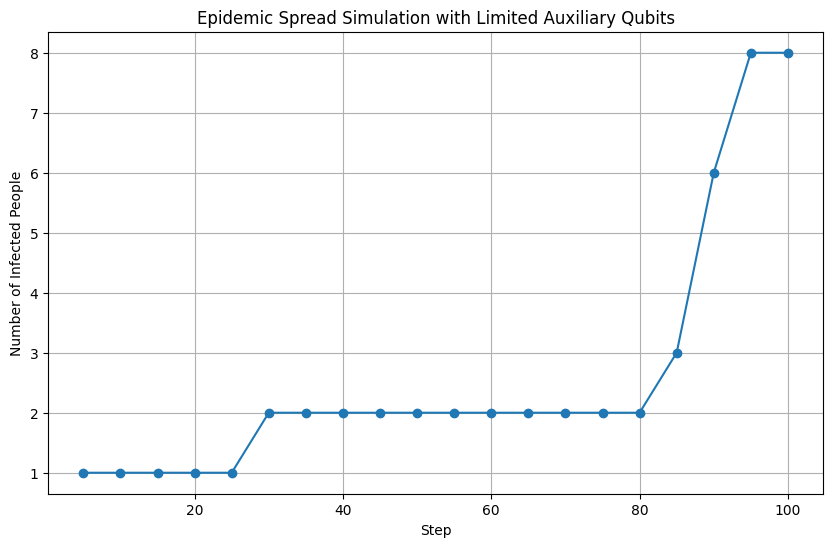

In [6]:
import random
from qiskit import QuantumCircuit, transpile
from qiskit_aer import AerSimulator
import matplotlib.pyplot as plt

# 節點和連結設定
num_people = 15  # 節點數量
num_connections = 75  # 連線數量
connections = [(random.randint(0, num_people - 1), random.randint(0, num_people - 1)) for _ in range(num_connections)]
connections = list(set([conn for conn in connections if conn[0] != conn[1]]))  # 移除自連
print(f"Generated {len(connections)} unique connections.")

num_steps = 100  # 模擬總步驟數
measure_interval = 5  # 每幾個步驟執行一次測量
infection_counts = []  # 記錄每次測量後的感染人數

infect = 0.5
recover = 0.1
# 初始化模擬器，使用無限制耦合的狀態向量模式
simulator = AerSimulator(method='statevector')

# 初始化狀態：初始時只有第0個人感染
initial_state = [1] + [0] * (num_people - 1)  # q0 是感染者，其餘是易感者

for step in range(1, num_steps + 1):
    # 計算所需的輔助量子位數量
    num_auxiliary = 5  # 限定輔助量子位數量
    total_qubits = num_people + num_auxiliary

    # 創建量子電路
    qc = QuantumCircuit(total_qubits, num_people)

    # 初始化量子位：根據前一次的測量結果設置初始狀態
    for i, state in enumerate(initial_state):
        if state == 1:
            qc.x(i)  # 將感染者設置為 |1>

    # 傳染過程
    aux_index = num_people  # 輔助量子位的起始索引
    for src, tgt in connections:
        qc.rccx(src, tgt, aux_index % num_auxiliary + num_people)  # 傳染者影響目標者
        qc.crx(infect, aux_index % num_auxiliary + num_people, tgt)  # 傳染概率為 0.5
        qc.crx(-infect, src, tgt)                                   # 補償效應

        # 重置輔助量子位
        qc.reset(aux_index % num_auxiliary + num_people)
        aux_index += 1

    # 恢復過程
    for person in range(num_people):
        qc.cx(person, aux_index % num_auxiliary + num_people)       # 恢復過程的輔助量子位
        qc.crx(-recover, aux_index % num_auxiliary + num_people, person)  # 恢復概率為 0.2

        # 重置輔助量子位
        qc.reset(aux_index % num_auxiliary + num_people)
        aux_index += 1

    # 每隔 measure_interval 步驟執行一次測量
    if step % measure_interval == 0:
        qc.measure(range(num_people), range(num_people))
        compiled_circuit = transpile(qc, simulator)
        result = simulator.run(compiled_circuit, shots=1).result()  # 執行一次測量
        counts = result.get_counts()

        # 解析測量結果，更新初始狀態
        measured_state = list(counts.keys())[0]  # 獲取測量結果（如 '10100'）
        initial_state = [int(bit) for bit in measured_state[::-1]]  # 更新初始狀態

        # 記錄感染人數
        infection_counts.append(sum(initial_state))

# 可視化感染人數的變化
plt.figure(figsize=(10, 6))
steps = list(range(measure_interval, num_steps + 1, measure_interval))
plt.plot(steps, infection_counts, marker='o', linestyle='-')
plt.xlabel("Step")
plt.ylabel("Number of Infected People")
plt.title("Epidemic Spread Simulation with Limited Auxiliary Qubits")
plt.grid(True)
plt.show()


0.09549150281252627
0.09549150281252627


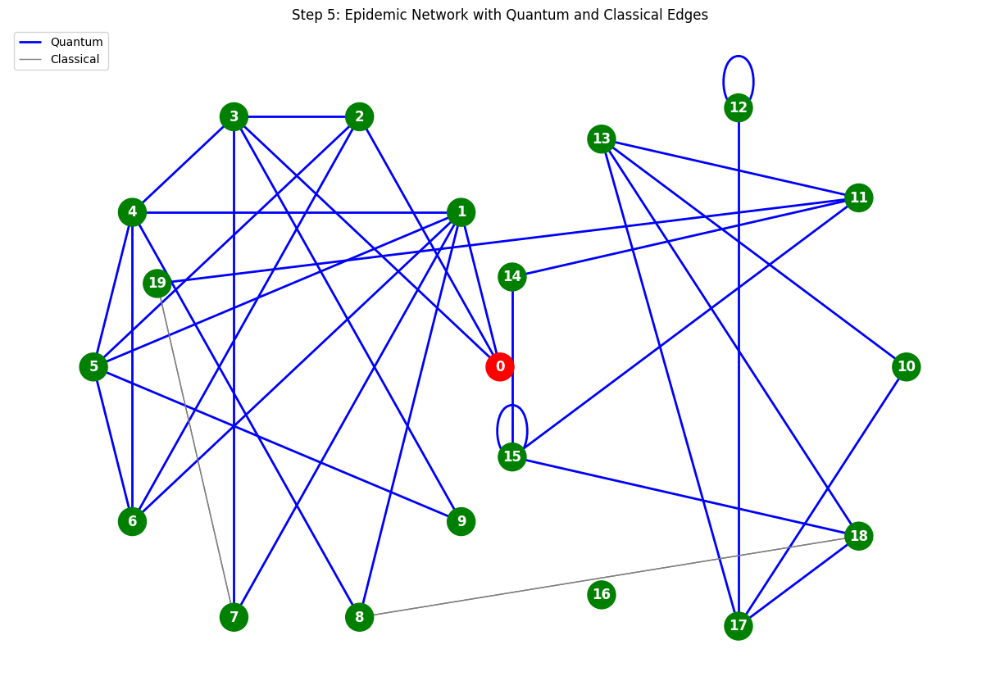

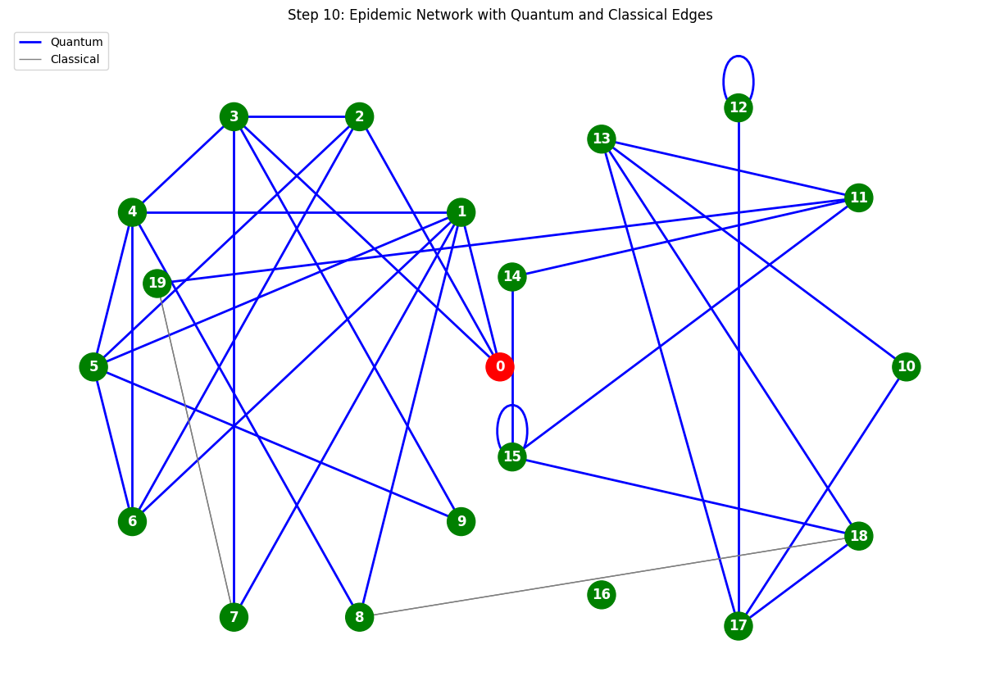

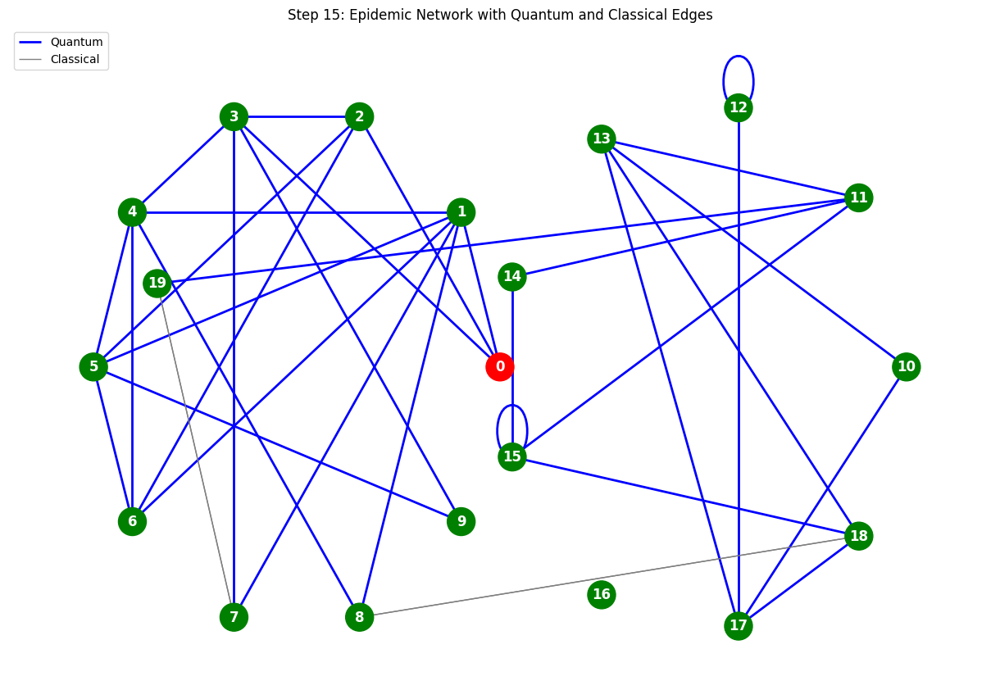

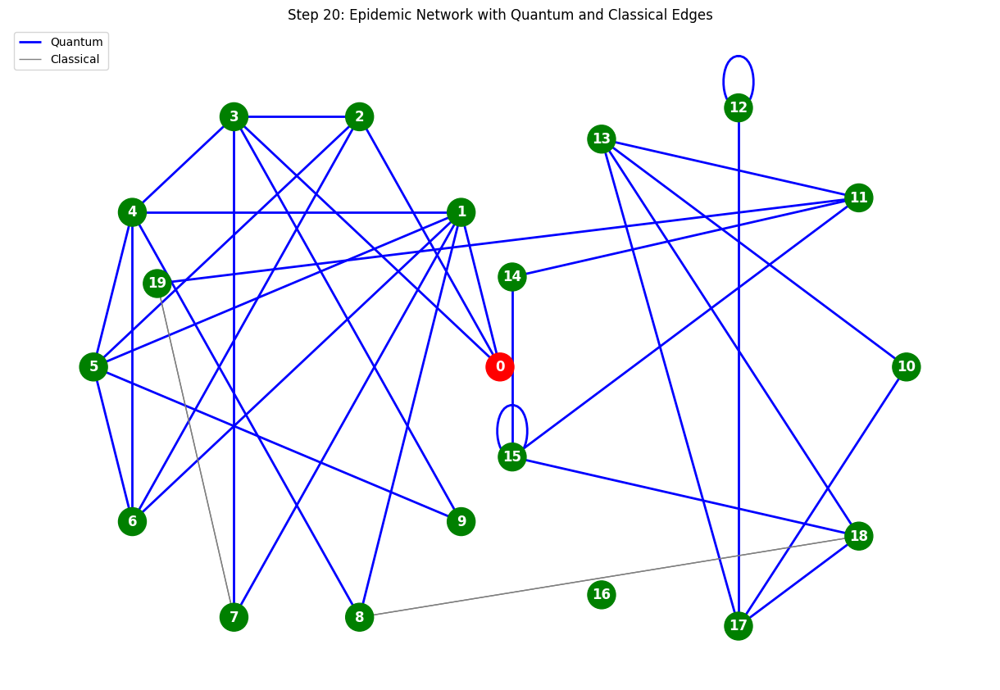

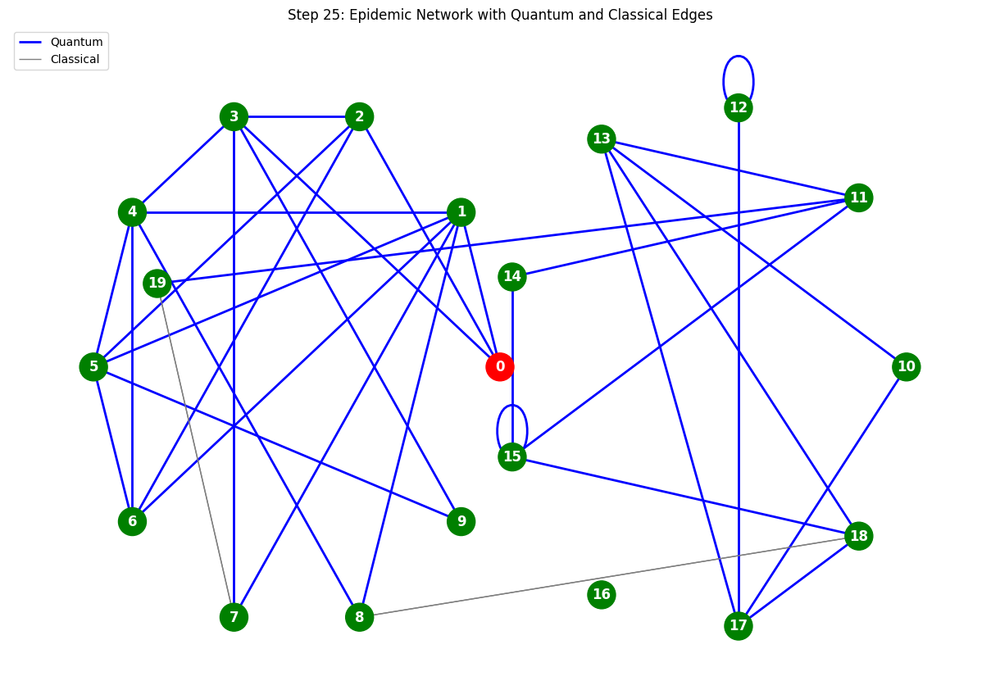

...

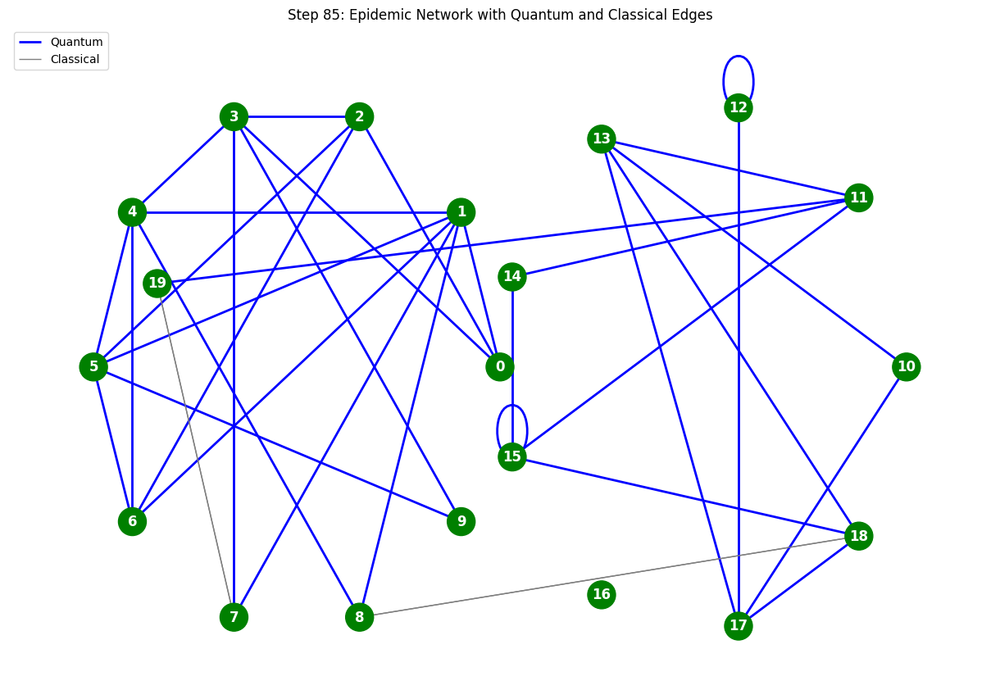

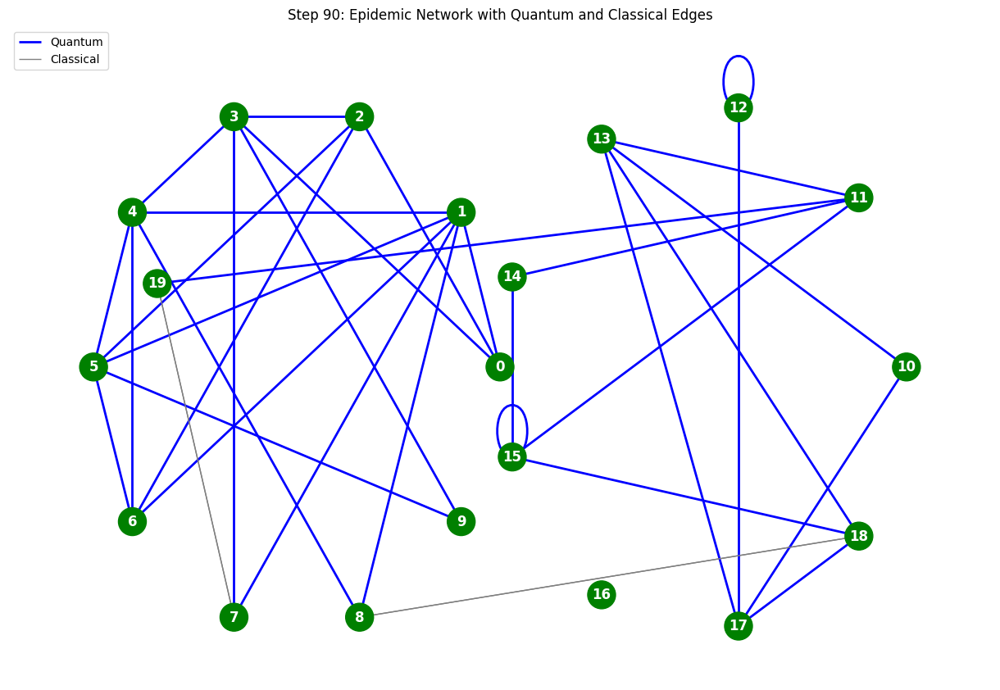

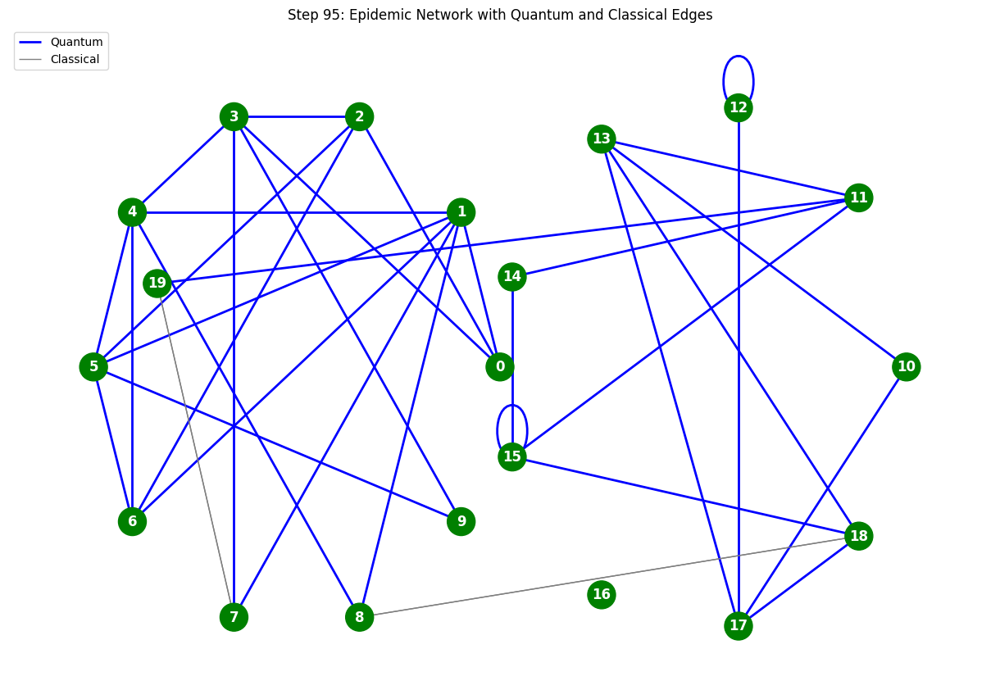

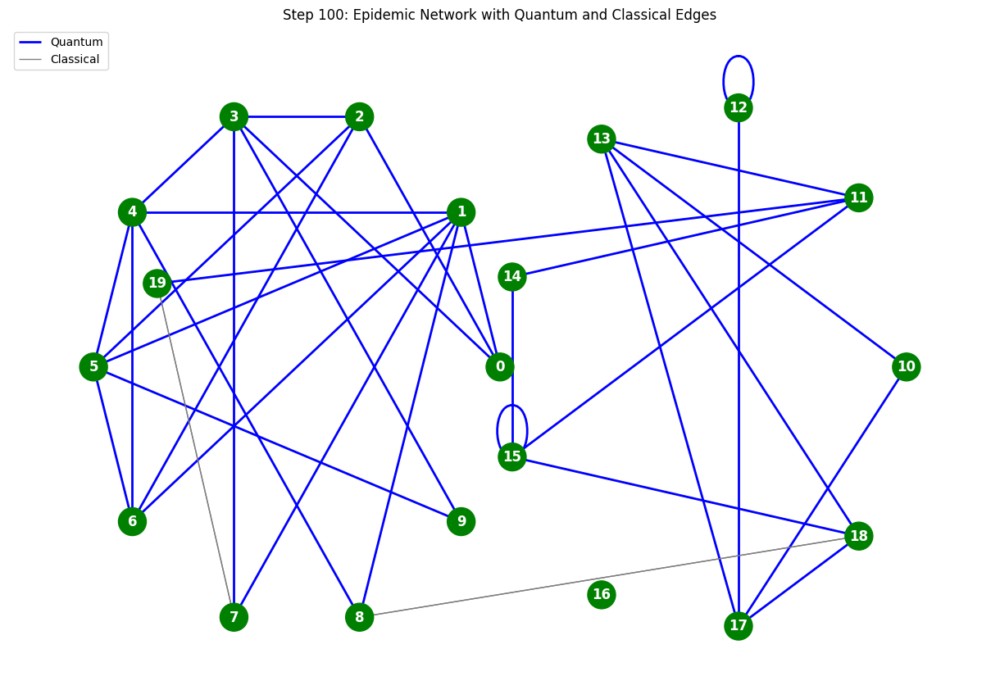

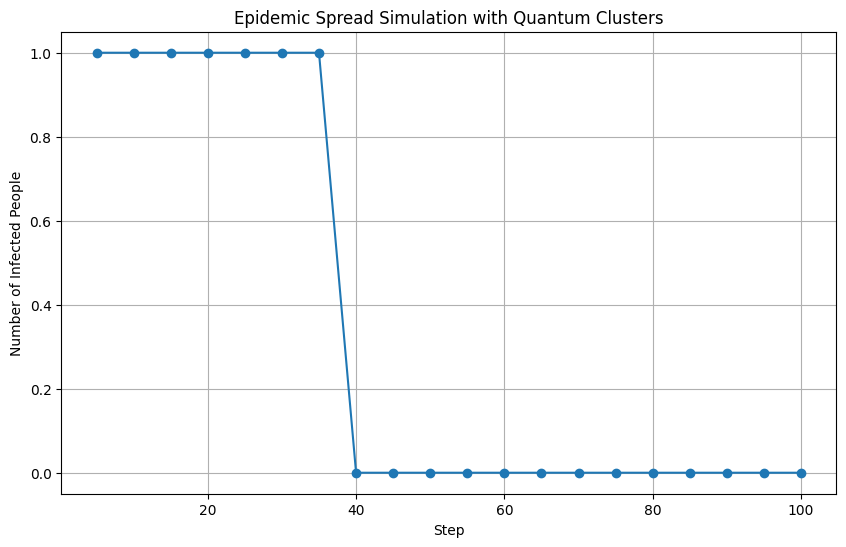

In [42]:
import random
import matplotlib.pyplot as plt
import networkx as nx
from qiskit import QuantumCircuit, transpile
from qiskit_aer import AerSimulator

# 模擬參數
num_people = 20  # 總節點數
num_clusters = 2  # 區塊數量
cluster_size = num_people // num_clusters  # 每個區塊的節點數量
intra_connections_per_cluster = 20  # 每個區塊內的連接數量（量子方式）
inter_connections_between_clusters = 2  # 每對區塊之間的連接數量（傳統方式）
num_steps = 100  # 總模擬步驟數
measure_interval = 5  # 每隔幾步測量一次

def inverse_sin_squared(y):
    if y < 0 or y > 1:
        raise ValueError("Input y must be in the range [0, 1]")
    
    # Compute inverse function
    arcsin_sqrt_y = np.arcsin(np.sqrt(y))
    x1 = (2 / np.pi) * arcsin_sqrt_y
    x2 = (2 / np.pi) * (1 - arcsin_sqrt_y)
    
    return x1  # Return both branches of the inverse function

infection_rate = 0.2 # 傳染率
recover_rate = 0.2 # 恢復率

infect = inverse_sin_squared(infection_rate)  # 傳染率
recover = inverse_sin_squared(recover_rate)  # 恢復率



print((np.sin(infect * np.pi / 2))**2) #等效傳染率
print((np.sin(recover * np.pi / 2))**2) #等效恢復率

# 初始化模擬器
simulator = AerSimulator()

# 將節點分配到各區塊
clusters = [list(range(i * cluster_size, (i + 1) * cluster_size)) for i in range(num_clusters)]

# 區塊內連接（量子方式）
intra_connections = {
    i: [(random.choice(clusters[i]), random.choice(clusters[i])) for _ in range(intra_connections_per_cluster)]
    for i in range(num_clusters)
}

# 區塊間連接（傳統方式）
inter_connections = [
    (random.choice(clusters[i]), random.choice(clusters[j]))
    for i in range(num_clusters) for j in range(i + 1, num_clusters)
    for _ in range(inter_connections_between_clusters)
]

# 初始狀態
global_state = [1] + [0] * (num_people - 1)  # 第 0 個節點為感染者
infection_counts = []

# 建立圖形結構
G = nx.Graph()
for i in range(num_clusters):
    G.add_nodes_from(clusters[i])
    G.add_edges_from(intra_connections[i], quantum=True)  # 標記量子方式的連線
G.add_edges_from(inter_connections, quantum=False)  # 標記傳統方式的連線

# 設定節點位置（固定區塊內相對位置）
pos = {}
cluster_offsets = [i * 2 for i in range(num_clusters)]  # 每個區塊的偏移
for cluster_id, cluster_nodes in enumerate(clusters):
    offset = cluster_offsets[cluster_id]
    sub_pos = nx.circular_layout(nx.Graph(intra_connections[cluster_id]))
    for node, coordinates in zip(cluster_nodes, sub_pos.values()):  # 確保節點位置一致
        pos[node] = (coordinates[0] + offset, coordinates[1])

# 確保跨區塊節點也分配位置
for src, tgt in inter_connections:
    if src not in pos:
        pos[src] = (random.uniform(-1, 1), random.uniform(-1, 1))
    if tgt not in pos:
        pos[tgt] = (random.uniform(-1, 1), random.uniform(-1, 1))

# 模擬過程
for step in range(1, num_steps + 1):
    for cluster_id, nodes in intra_connections.items():
        cluster_nodes = clusters[cluster_id]
        num_qubits = len(cluster_nodes) + 1  # 節點數量 + 1 輔助量子位
        num_classical_bits = len(cluster_nodes)
        qc = QuantumCircuit(num_qubits, num_classical_bits)

        # 初始化量子位
        for idx, node in enumerate(cluster_nodes):
            if global_state[node] == 1:
                qc.x(idx)

        # 傳染過程
        aux_idx = len(cluster_nodes)
        for src, tgt in nodes:
            if src != tgt:
                src_idx = cluster_nodes.index(src)
                tgt_idx = cluster_nodes.index(tgt)
                qc.rccx(src_idx, tgt_idx, aux_idx)
                qc.crx(infect, aux_idx, tgt_idx)
                qc.crx(-infect, src_idx, tgt_idx)
                qc.reset(aux_idx)

        # 恢復過程
        for idx, node in enumerate(cluster_nodes):
            qc.cx(idx, aux_idx)
            qc.crx(-recover, aux_idx, idx)
            qc.reset(aux_idx)

        # 增加測量
        qc.measure(range(len(cluster_nodes)), range(len(cluster_nodes)))

        # 模擬電路
        compiled_circuit = transpile(qc, simulator)
        result = simulator.run(compiled_circuit, shots=1).result()
        counts = result.get_counts()
        measured_state = list(counts.keys())[0]

        # 更新全局狀態
        for idx, node in enumerate(cluster_nodes):
            global_state[node] = int(measured_state[::-1][idx])

    # 區塊間傳染
    for src, tgt in inter_connections:
        if global_state[src] == 1 and random.random() < (np.sin(infect * np.pi / 2))**2:
            global_state[tgt] = 1
        elif global_state[tgt] == 1 and random.random() < (np.sin(infect * np.pi / 2))**2:
            global_state[src] = 1

    # 記錄感染人數
    if step % measure_interval == 0:
        infection_counts.append(sum(global_state))

        # 可視化當前狀態的圖形
        node_colors = ['red' if global_state[node] == 1 else 'green' for node in range(num_people)]
        plt.figure(figsize=(12, 8))
        nx.draw(
            G,
            pos,
            with_labels=True,
            node_color=node_colors,
            node_size=600,
            font_color='white',
            font_weight='bold',
            edge_color='gray',
        )

        # 繪製量子方式與傳統方式的連接
        quantum_edges = [(u, v) for u, v, d in G.edges(data=True) if d.get('quantum')]
        traditional_edges = [(u, v) for u, v, d in G.edges(data=True) if not d.get('quantum')]
        nx.draw_networkx_edges(G, pos, edgelist=quantum_edges, edge_color='blue', width=2, label='Quantum')
        nx.draw_networkx_edges(G, pos, edgelist=traditional_edges, edge_color='gray', width=1, label='Classical')

        plt.title(f"Step {step}: Epidemic Network with Quantum and Classical Edges")
        plt.legend(loc="upper left")
        plt.show()

# 繪製感染人數變化
plt.figure(figsize=(10, 6))
steps = list(range(measure_interval, num_steps + 1, measure_interval))
plt.plot(steps, infection_counts, marker='o', linestyle='-')
plt.xlabel("Step")
plt.ylabel("Number of Infected People")
plt.title("Epidemic Spread Simulation with Quantum Clusters")
plt.grid(True)
plt.show()


In [19]:
import numpy as np
infect = 0.4
(np.sin(infect * np.pi / 2))**2


0.3454915028125263

Generated 61 unique connections.


MovieWriter imagemagick unavailable; using Pillow instead.


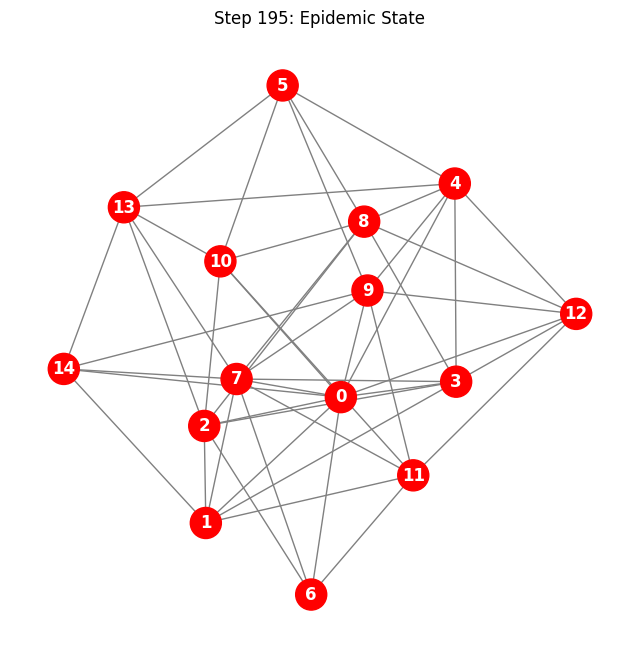

In [10]:
import random
import matplotlib.pyplot as plt
import networkx as nx
from qiskit import QuantumCircuit, transpile
from qiskit_aer import AerSimulator
from matplotlib.animation import FuncAnimation

# 節點和連結設定
num_people = 15  # 節點數量
num_connections = 75  # 連線數量
connections = [(random.randint(0, num_people - 1), random.randint(0, num_people - 1)) for _ in range(num_connections)]
connections = list(set([conn for conn in connections if conn[0] != conn[1]]))  # 移除自連
print(f"Generated {len(connections)} unique connections.")

num_steps = 200  # 模擬總步驟數
measure_interval = 5  # 每幾個步驟執行一次測量
infection_counts = []  # 記錄每次測量後的感染人數

infect = 0.7  # 傳染率
recover = 0.4  # 恢復率

# 初始化模擬器，使用無限制耦合的狀態向量模式
simulator = AerSimulator(method='statevector')

# 初始化狀態：初始時只有第0個人感染
initial_state = [1] + [0] * (num_people - 1)  # q0 是感染者，其餘是易感者

# 創建網絡圖
G = nx.Graph()
G.add_edges_from(connections)

# 固定節點位置
pos = nx.spring_layout(G, seed=42)  # 使用 Spring Layout 並固定隨機種子

# 初始化圖像
fig, ax = plt.subplots(figsize=(8, 8))
node_colors = ['red' if state == 1 else 'green' for state in initial_state]
nx.draw(
    G,
    pos,
    with_labels=True,
    node_color=node_colors,
    node_size=500,
    font_color='white',
    font_weight='bold',
    edge_color='gray',
    ax=ax
)
plt.title("Epidemic Simulation")

# 保存每步的狀態
steps_to_plot = []

for step in range(1, num_steps + 1):
    # 計算所需的輔助量子位數量
    num_auxiliary = 5  # 限定輔助量子位數量
    total_qubits = num_people + num_auxiliary

    # 創建量子電路
    qc = QuantumCircuit(total_qubits, num_people)

    # 初始化量子位：根據前一次的測量結果設置初始狀態
    for i, state in enumerate(initial_state):
        if state == 1:
            qc.x(i)  # 將感染者設置為 |1>

    # 傳染過程
    aux_index = num_people  # 輔助量子位的起始索引
    for src, tgt in connections:
        qc.rccx(src, tgt, aux_index % num_auxiliary + num_people)  # 傳染者影響目標者
        qc.crx(infect, aux_index % num_auxiliary + num_people, tgt)  # 傳染概率
        qc.crx(-infect, src, tgt)                                   # 補償效應

        # 重置輔助量子位
        qc.reset(aux_index % num_auxiliary + num_people)
        aux_index += 1

    # 恢復過程
    for person in range(num_people):
        qc.cx(person, aux_index % num_auxiliary + num_people)       # 恢復過程的輔助量子位
        qc.crx(-recover, aux_index % num_auxiliary + num_people, person)  # 恢復概率

        # 重置輔助量子位
        qc.reset(aux_index % num_auxiliary + num_people)
        aux_index += 1

    # 每隔 measure_interval 步驟執行一次測量
    if step % measure_interval == 0:
        qc.measure(range(num_people), range(num_people))
        compiled_circuit = transpile(qc, simulator)
        result = simulator.run(compiled_circuit, shots=1).result()  # 執行一次測量
        counts = result.get_counts()

        # 解析測量結果，更新初始狀態
        measured_state = list(counts.keys())[0]  # 獲取測量結果（如 '10100'）
        initial_state = [int(bit) for bit in measured_state[::-1]]  # 更新初始狀態

        # 記錄感染人數
        infection_counts.append(sum(initial_state))

        # 保存節點狀態
        steps_to_plot.append(initial_state.copy())

# 動畫更新函數
def update(frame):
    node_colors = ['red' if state == 1 else 'green' for state in steps_to_plot[frame]]
    ax.clear()
    nx.draw(
        G,
        pos,
        with_labels=True,
        node_color=node_colors,
        node_size=500,
        font_color='white',
        font_weight='bold',
        edge_color='gray',
        ax=ax
    )
    ax.set_title(f"Step {frame * measure_interval}: Epidemic State")

# 創建動畫
anim = FuncAnimation(fig, update, frames=len(steps_to_plot), interval=500)

# 保存動畫
anim.save("epidemic_simulation.gif", writer="imagemagick")
plt.show()


In [1]:
import random
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
from qiskit import QuantumCircuit, transpile
from qiskit_aer import AerSimulator


def epidemic_simulation(
    infection_rate,
    recover_rate,
    num_people,
    initial_infected,
    num_clusters,
    intra_connections_per_cluster,
    total_inter_connections,
    num_steps=100,
    measure_interval=5,
):
    """模擬量子與傳統結合的流行病傳播模型"""

    # 計算等效的傳染率與恢復率
    def inverse_sin_squared(y):
        if y < 0 or y > 1:
            raise ValueError("Input y must be in the range [0, 1]")
        arcsin_sqrt_y = np.arcsin(np.sqrt(y))
        return (2 / np.pi) * arcsin_sqrt_y

    infect = inverse_sin_squared(infection_rate)
    recover = inverse_sin_squared(recover_rate)

    # 初始化模擬器
    simulator = AerSimulator()

    # 將節點分配到各區塊
    cluster_size = num_people // num_clusters
    clusters = [list(range(i * cluster_size, (i + 1) * cluster_size)) for i in range(num_clusters)]

    # 區塊內連接（量子方式）
    intra_connections = {
        i: [(random.choice(clusters[i]), random.choice(clusters[i])) for _ in range(intra_connections_per_cluster)]
        for i in range(num_clusters)
    }

    # 區塊間連接（傳統方式）
    inter_connections = [
        (random.randint(0, num_people - 1), random.randint(0, num_people - 1))
        for _ in range(total_inter_connections)
        if random.randint(0, num_people - 1) != random.randint(0, num_people - 1)
    ]

    # 初始狀態
    global_state = [0] * num_people
    for i in random.sample(range(num_people), initial_infected):
        global_state[i] = 1
    infection_counts = []

    # 建立圖形結構
    G = nx.Graph()
    for i in range(num_clusters):
        G.add_nodes_from(clusters[i])
        G.add_edges_from(intra_connections[i], quantum=True)
    G.add_edges_from(inter_connections, quantum=False)

    # 設定節點位置
    pos = {}
    cluster_offsets = [i * 2 for i in range(num_clusters)]
    for cluster_id, cluster_nodes in enumerate(clusters):
        offset = cluster_offsets[cluster_id]
        sub_pos = nx.circular_layout(nx.Graph(intra_connections[cluster_id]))
        for node, coordinates in zip(cluster_nodes, sub_pos.values()):
            pos[node] = (coordinates[0] + offset, coordinates[1])
    for src, tgt in inter_connections:
        if src not in pos:
            pos[src] = (random.uniform(-1, 1), random.uniform(-1, 1))
        if tgt not in pos:
            pos[tgt] = (random.uniform(-1, 1), random.uniform(-1, 1))

    # 模擬過程
    def visualize_network(global_state, step):
        node_colors = ['red' if global_state[node] == 1 else 'green' for node in range(num_people)]
        plt.figure(figsize=(12, 8))
        nx.draw(
            G,
            pos,
            with_labels=True,
            node_color=node_colors,
            node_size=600,
            font_color='white',
            font_weight='bold',
        )
        quantum_edges = [(u, v) for u, v, d in G.edges(data=True) if d.get('quantum')]
        traditional_edges = [(u, v) for u, v, d in G.edges(data=True) if not d.get('quantum')]
        nx.draw_networkx_edges(G, pos, edgelist=quantum_edges, edge_color='blue', width=2, label='Quantum')
        nx.draw_networkx_edges(G, pos, edgelist=traditional_edges, edge_color='gray', width=1, label='Classical')
        plt.title(f"Step {step}: Epidemic Network with Quantum and Classical Edges")
        plt.legend(loc="upper left")
        plt.show()

    for step in range(1, num_steps + 1):
        for cluster_id, nodes in intra_connections.items():
            cluster_nodes = clusters[cluster_id]
            num_qubits = len(cluster_nodes) + 1
            num_classical_bits = len(cluster_nodes)
            qc = QuantumCircuit(num_qubits, num_classical_bits)

            for idx, node in enumerate(cluster_nodes):
                if global_state[node] == 1:
                    qc.x(idx)

            aux_idx = len(cluster_nodes)
            for src, tgt in nodes:
                if src != tgt:
                    src_idx = cluster_nodes.index(src)
                    tgt_idx = cluster_nodes.index(tgt)
                    qc.rccx(src_idx, tgt_idx, aux_idx)
                    qc.crx(infect, aux_idx, tgt_idx)
                    qc.crx(-infect, src_idx, tgt_idx)
                    qc.reset(aux_idx)

            for idx, node in enumerate(cluster_nodes):
                qc.cx(idx, aux_idx)
                qc.crx(-recover, aux_idx, idx)
                qc.reset(aux_idx)

            qc.measure(range(len(cluster_nodes)), range(len(cluster_nodes)))
            compiled_circuit = transpile(qc, simulator)
            result = simulator.run(compiled_circuit, shots=1).result()
            counts = result.get_counts()
            measured_state = list(counts.keys())[0]
            for idx, node in enumerate(cluster_nodes):
                global_state[node] = int(measured_state[::-1][idx])

        for src, tgt in inter_connections:
            if global_state[src] == 1 and random.random() < (np.sin(infect * np.pi / 2))**2:
                global_state[tgt] = 1
            elif global_state[tgt] == 1 and random.random() < (np.sin(infect * np.pi / 2))**2:
                global_state[src] = 1

        if step % measure_interval == 0:
            infection_counts.append(sum(global_state))
            # visualize_network(global_state, step)

    # 可視化感染人數變化
    def plot_infection_counts(infection_counts):
        steps = list(range(measure_interval, num_steps + 1, measure_interval))
        plt.figure(figsize=(10, 6))
        plt.plot(steps, infection_counts, marker='o', linestyle='-')
        plt.xlabel("Step")
        plt.ylabel("Number of Infected People")
        plt.title("Epidemic Spread Simulation with Quantum Clusters")
        plt.grid(True)
        plt.show()

    plot_infection_counts(infection_counts)

    return infection_counts


# # 呼叫模擬函數
# epidemic_simulation(
#     infection_rate=0.2,
#     recover_rate=0.2,
#     num_people=20,
#     initial_infected=3,
#     num_clusters=2,
#     intra_connections_per_cluster=20,
#     total_inter_connections=5,
# )


In [2]:

def simulate_with_different_initial_infected(
    infection_rate,
    recover_rate,
    num_people,
    num_clusters,
    intra_connections_per_cluster,
    total_inter_connections,
    initial_infected_values,
    num_steps=100,
    measure_interval=5,
):
    """
    比較不同初始感染人數對傳染擴散的影響
    """
    infection_results = {}

    for initial_infected in initial_infected_values:
        print(f"Simulating with initial_infected={initial_infected}...")
        infection_counts = epidemic_simulation(
            infection_rate=infection_rate,
            recover_rate=recover_rate,
            num_people=num_people,
            initial_infected=initial_infected,
            num_clusters=num_clusters,
            intra_connections_per_cluster=intra_connections_per_cluster,
            total_inter_connections=total_inter_connections,
            num_steps=num_steps,
            measure_interval=measure_interval,
        )
        infection_results[initial_infected] = infection_counts

    # 繪製結果
    steps = list(range(measure_interval, num_steps + 1, measure_interval))
    plt.figure(figsize=(10, 6))
    for initial_infected, counts in infection_results.items():
        plt.plot(steps, counts, label=f"Initial Infected: {initial_infected}")

    plt.xlabel("Step")
    plt.ylabel("Number of Infected People")
    plt.title("Impact of Initial Infected People on Epidemic Spread")
    plt.legend()
    plt.grid(True)
    plt.show()


# 呼叫函數，進行模擬與比較
simulate_with_different_initial_infected(
    infection_rate=0.2,
    recover_rate=0.1,
    num_people=200,
    num_clusters=20,
    intra_connections_per_cluster=20,
    total_inter_connections=300,
    initial_infected_values=[10, 30, 50, 70],
    num_steps=50,
    measure_interval=5,
)


Simulating with initial_infected=10...


KeyboardInterrupt: 

Quantum Connections: 40
Classical Connections: 5


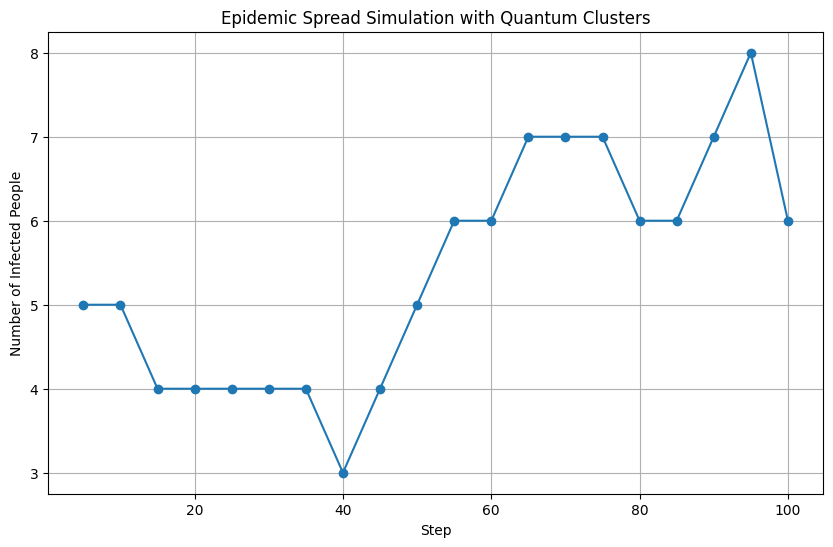

[5, 5, 4, 4, 4, 4, 4, 3, 4, 5, 6, 6, 7, 7, 7, 6, 6, 7, 8, 6]

In [11]:
def epidemic_simulation(
    infection_rate,
    recover_rate,
    num_people,
    initial_infected,
    num_clusters,
    intra_connections_per_cluster,
    total_inter_connections,
    num_steps=100,
    measure_interval=5,
):
    """模擬量子與傳統結合的流行病傳播模型，並計算連線總數"""

    # 計算等效的傳染率與恢復率
    def inverse_sin_squared(y):
        if y < 0 or y > 1:
            raise ValueError("Input y must be in the range [0, 1]")
        arcsin_sqrt_y = np.arcsin(np.sqrt(y))
        return (2 / np.pi) * arcsin_sqrt_y

    infect = inverse_sin_squared(infection_rate)
    recover = inverse_sin_squared(recover_rate)

    # 初始化模擬器
    simulator = AerSimulator()

    # 將節點分配到各區塊
    cluster_size = num_people // num_clusters
    clusters = [list(range(i * cluster_size, (i + 1) * cluster_size)) for i in range(num_clusters)]

    # 區塊內連接（量子方式）
    intra_connections = {
        i: set() for i in range(num_clusters)  # 使用集合避免重複連線
    }
    for i in range(num_clusters):
        while len(intra_connections[i]) < intra_connections_per_cluster:
            src, tgt = random.sample(clusters[i], 2)  # 確保 src != tgt
            intra_connections[i].add((src, tgt))

    # 區塊間連接（傳統方式）
    inter_connections = set()
    while len(inter_connections) < total_inter_connections:
        src, tgt = random.sample(range(num_people), 2)  # 確保 src != tgt
        inter_connections.add((src, tgt))

    # 初始狀態
    global_state = [0] * num_people
    for i in random.sample(range(num_people), initial_infected):
        global_state[i] = 1
    infection_counts = []

    # 計算連線總數
    quantum_connection_count = sum(len(conns) for conns in intra_connections.values())
    classical_connection_count = len(inter_connections)
    print(f"Quantum Connections: {quantum_connection_count}")
    print(f"Classical Connections: {classical_connection_count}")

    # 建立圖形結構
    G = nx.Graph()
    for i in range(num_clusters):
        G.add_nodes_from(clusters[i])
        G.add_edges_from(intra_connections[i], quantum=True)
    G.add_edges_from(inter_connections, quantum=False)

    # 模擬過程
    for step in range(1, num_steps + 1):
        for cluster_id, nodes in intra_connections.items():
            cluster_nodes = clusters[cluster_id]
            num_qubits = len(cluster_nodes) + 1
            num_classical_bits = len(cluster_nodes)
            qc = QuantumCircuit(num_qubits, num_classical_bits)

            for idx, node in enumerate(cluster_nodes):
                if global_state[node] == 1:
                    qc.x(idx)

            aux_idx = len(cluster_nodes)
            for src, tgt in nodes:
                src_idx = cluster_nodes.index(src)
                tgt_idx = cluster_nodes.index(tgt)
                qc.rccx(src_idx, tgt_idx, aux_idx)
                qc.crx(infect, aux_idx, tgt_idx)
                qc.crx(-infect, src_idx, tgt_idx)
                qc.reset(aux_idx)

            for idx, node in enumerate(cluster_nodes):
                qc.cx(idx, aux_idx)
                qc.crx(-recover, aux_idx, idx)
                qc.reset(aux_idx)

            qc.measure(range(len(cluster_nodes)), range(len(cluster_nodes)))
            compiled_circuit = transpile(qc, simulator)
            result = simulator.run(compiled_circuit, shots=1).result()
            counts = result.get_counts()
            measured_state = list(counts.keys())[0]
            for idx, node in enumerate(cluster_nodes):
                global_state[node] = int(measured_state[::-1][idx])

        for src, tgt in inter_connections:
            if global_state[src] == 1 and random.random() < (np.sin(infect * np.pi / 2))**2:
                global_state[tgt] = 1
            elif global_state[tgt] == 1 and random.random() < (np.sin(infect * np.pi / 2))**2:
                global_state[src] = 1

        if step % measure_interval == 0:
            infection_counts.append(sum(global_state))

    # 可視化感染人數變化
    def plot_infection_counts(infection_counts):
        steps = list(range(measure_interval, num_steps + 1, measure_interval))
        plt.figure(figsize=(10, 6))
        plt.plot(steps, infection_counts, marker='o', linestyle='-')
        plt.xlabel("Step")
        plt.ylabel("Number of Infected People")
        plt.title("Epidemic Spread Simulation with Quantum Clusters")
        plt.grid(True)
        plt.show()

    plot_infection_counts(infection_counts)

    return infection_counts


# 呼叫模擬函數
epidemic_simulation(
    infection_rate=0.2,
    recover_rate=0.2,
    num_people=20,
    initial_infected=3,
    num_clusters=2,
    intra_connections_per_cluster=20,
    total_inter_connections=5,
)


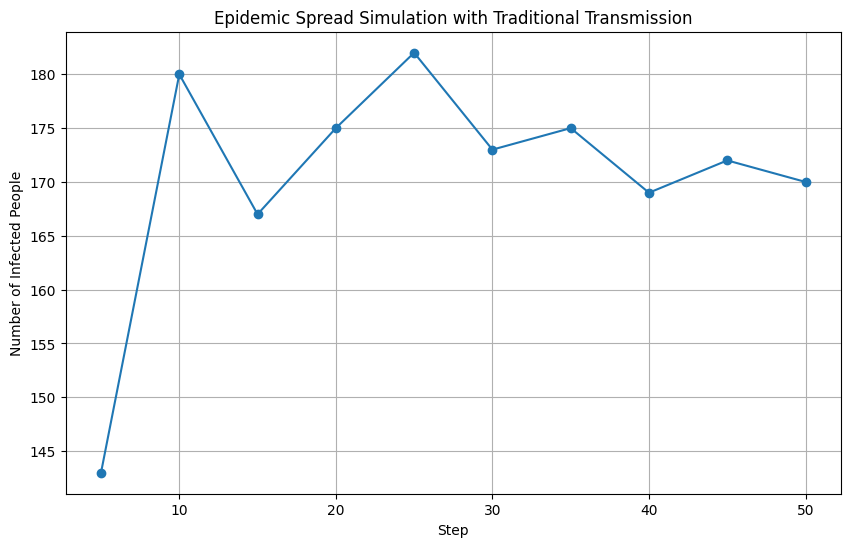

[143, 180, 167, 175, 182, 173, 175, 169, 172, 170]

In [4]:
def traditional_epidemic_simulation(
    infection_rate,
    recover_rate,
    num_people,
    initial_infected,
    num_clusters,
    intra_connections_per_cluster,
    total_inter_connections,
    num_steps=100,
    measure_interval=5,
):
    """模擬完全由傳統方式進行傳播的流行病模型"""

    # 將節點分配到各區塊
    cluster_size = num_people // num_clusters
    clusters = [list(range(i * cluster_size, (i + 1) * cluster_size)) for i in range(num_clusters)]

    # 區塊內連接（傳統方式）
    intra_connections = {
        i: set() for i in range(num_clusters)  # 使用集合避免重複連線
    }
    for i in range(num_clusters):
        while len(intra_connections[i]) < intra_connections_per_cluster:
            src, tgt = random.sample(clusters[i], 2)  # 確保 src != tgt
            intra_connections[i].add((src, tgt))

    # 區塊間連接（傳統方式）
    inter_connections = set()
    while len(inter_connections) < total_inter_connections:
        src, tgt = random.sample(range(num_people), 2)  # 確保 src != tgt
        inter_connections.add((src, tgt))

    # 初始狀態
    global_state = [0] * num_people
    for i in random.sample(range(num_people), initial_infected):
        global_state[i] = 1
    infection_counts = []

    # 建立圖形結構
    G = nx.Graph()
    for i in range(num_clusters):
        G.add_nodes_from(clusters[i])
        G.add_edges_from(intra_connections[i], quantum=False)
    G.add_edges_from(inter_connections, quantum=False)

    # 模擬過程
    for step in range(1, num_steps + 1):
        new_state = global_state.copy()

        # 區塊內傳染
        for cluster_id, connections in intra_connections.items():
            for src, tgt in connections:
                if global_state[src] == 1 and random.random() < infection_rate:
                    new_state[tgt] = 1
                elif global_state[tgt] == 1 and random.random() < infection_rate:
                    new_state[src] = 1

        # 區塊間傳染
        for src, tgt in inter_connections:
            if global_state[src] == 1 and random.random() < infection_rate:
                new_state[tgt] = 1
            elif global_state[tgt] == 1 and random.random() < infection_rate:
                new_state[src] = 1

        # 恢復過程
        for i in range(num_people):
            if global_state[i] == 1 and random.random() < recover_rate:
                new_state[i] = 0

        # 更新狀態
        global_state = new_state

        # 每隔 measure_interval 步驟記錄一次感染人數
        if step % measure_interval == 0:
            infection_counts.append(sum(global_state))

    # 可視化感染人數變化
    def plot_infection_counts(infection_counts):
        steps = list(range(measure_interval, num_steps + 1, measure_interval))
        plt.figure(figsize=(10, 6))
        plt.plot(steps, infection_counts, marker='o', linestyle='-')
        plt.xlabel("Step")
        plt.ylabel("Number of Infected People")
        plt.title("Epidemic Spread Simulation with Traditional Transmission")
        plt.grid(True)
        plt.show()

    plot_infection_counts(infection_counts)

    return infection_counts


# 呼叫模擬函數
traditional_epidemic_simulation(
    infection_rate=0.2,
    recover_rate=0.1,
    num_people=200,
    initial_infected=10,
    num_clusters=20,
    intra_connections_per_cluster=20,
    total_inter_connections=300,
    num_steps=50,
    measure_interval=5,
)


Simulating for Infection Rate=0.2, Recover Rate=0.1...
Quantum Connections: 400
Classical Connections: 300


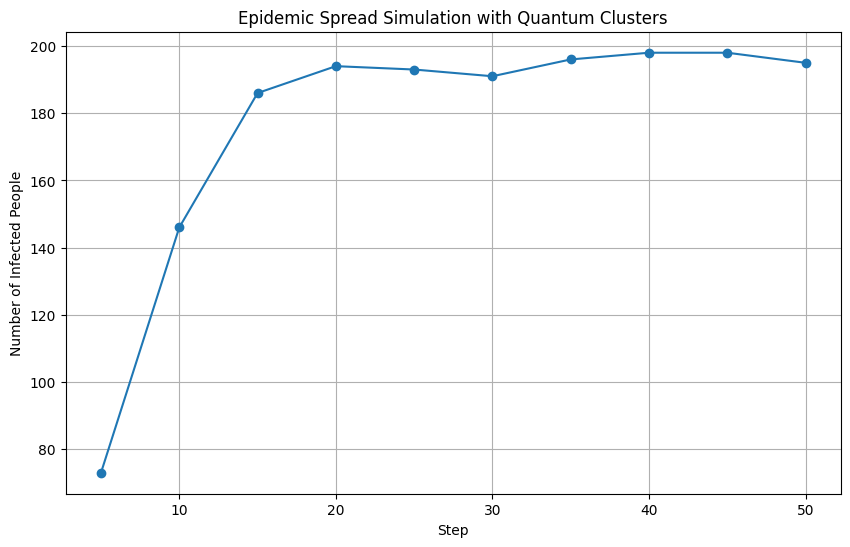

Quantum Connections: 400
Classical Connections: 300


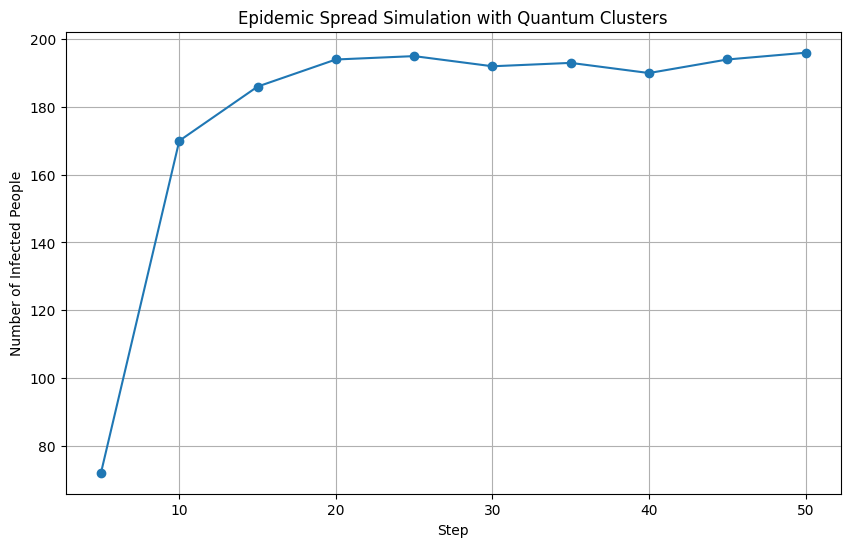

Quantum Connections: 400
Classical Connections: 300


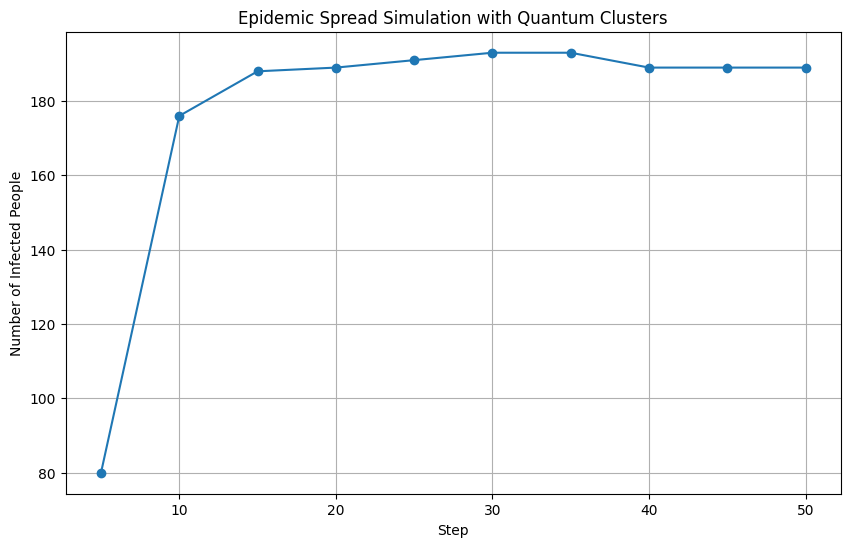

Quantum Connections: 400
Classical Connections: 300


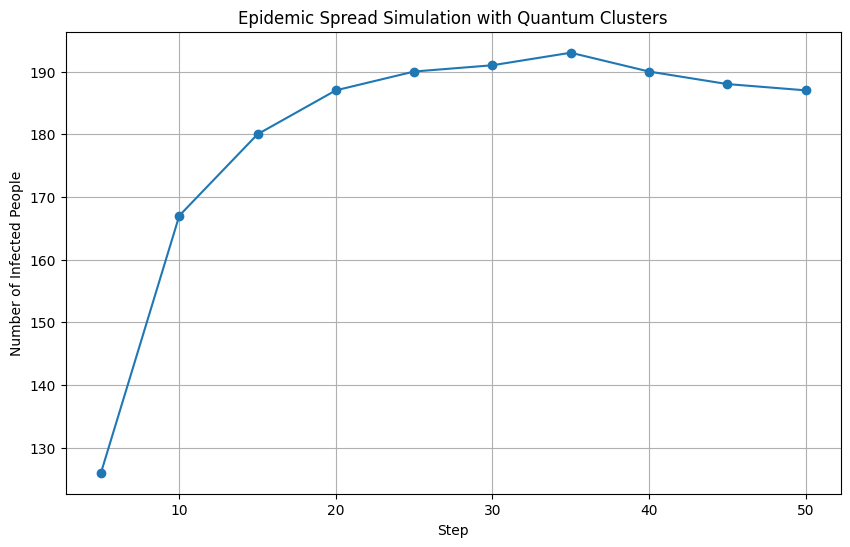

Quantum Connections: 400
Classical Connections: 300


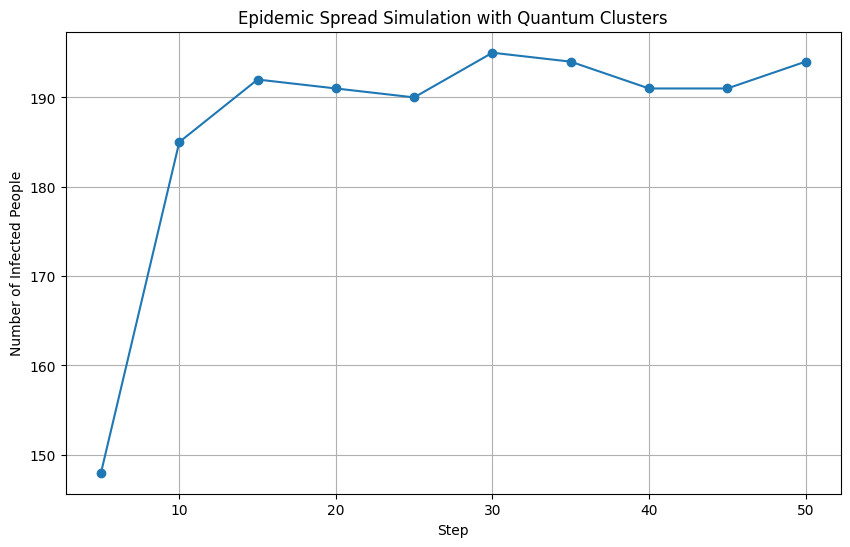

Quantum Connections: 400
Classical Connections: 300


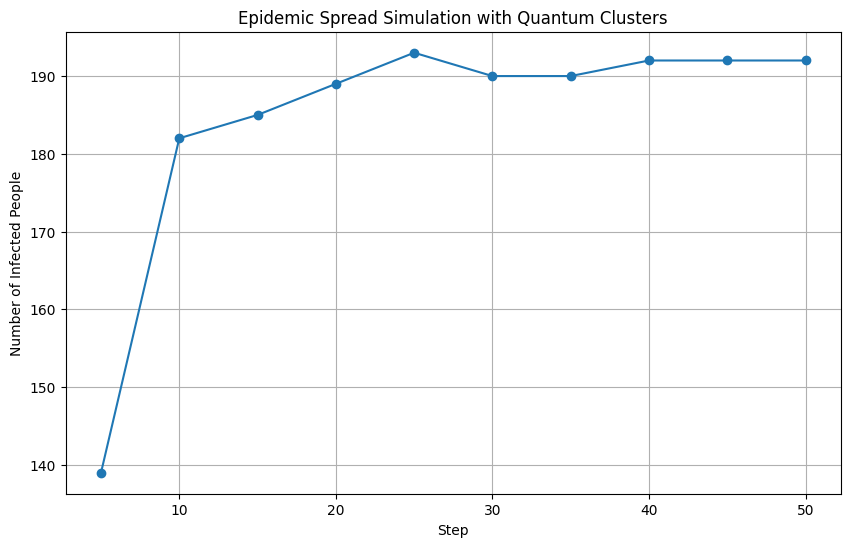

Quantum Connections: 400
Classical Connections: 300


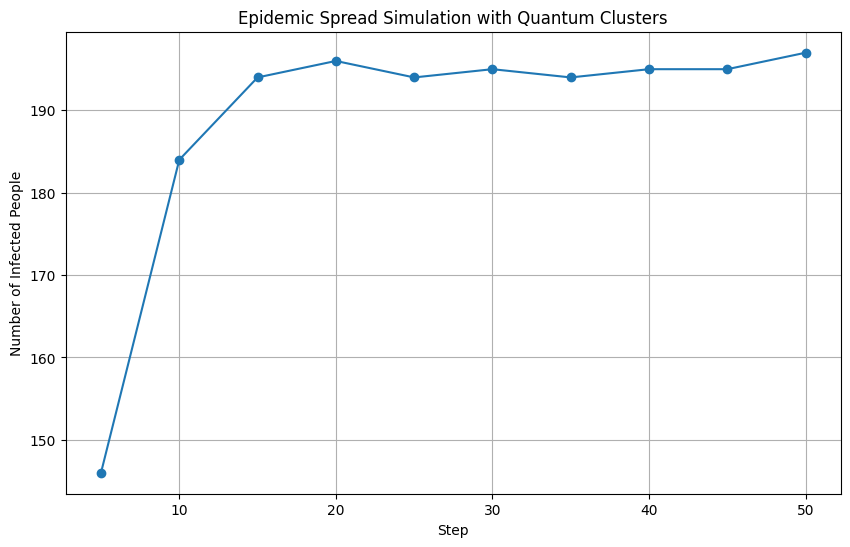

Quantum Connections: 400
Classical Connections: 300


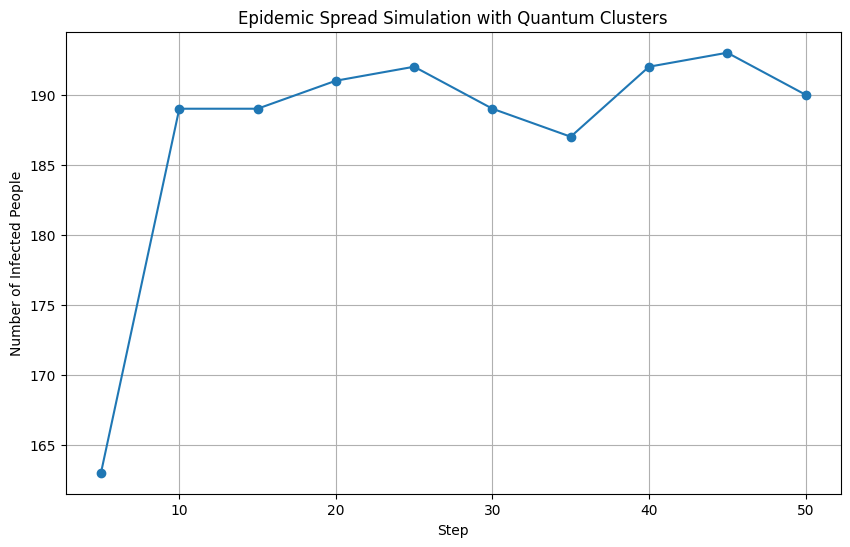

Quantum Connections: 400
Classical Connections: 300


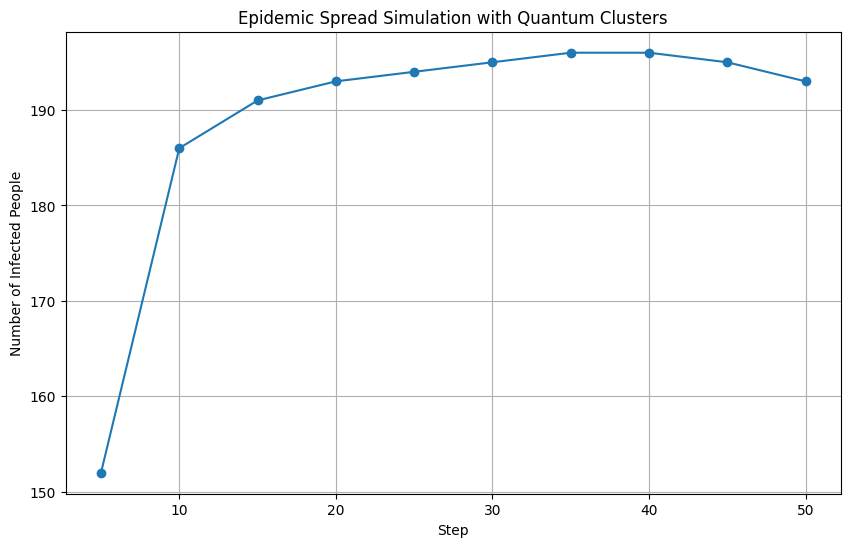

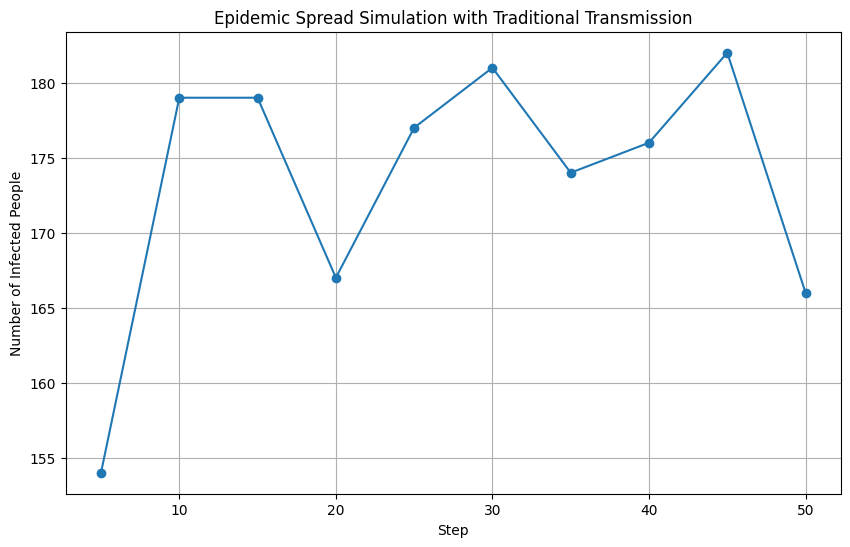

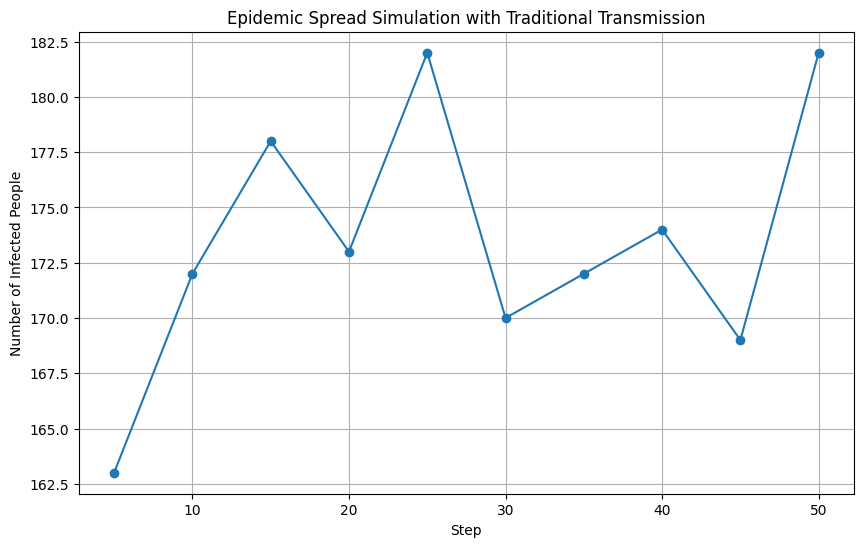

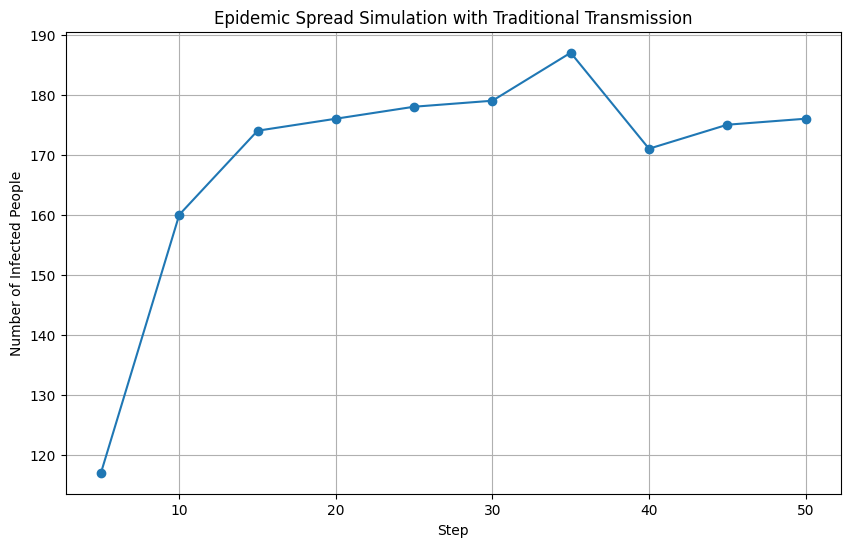

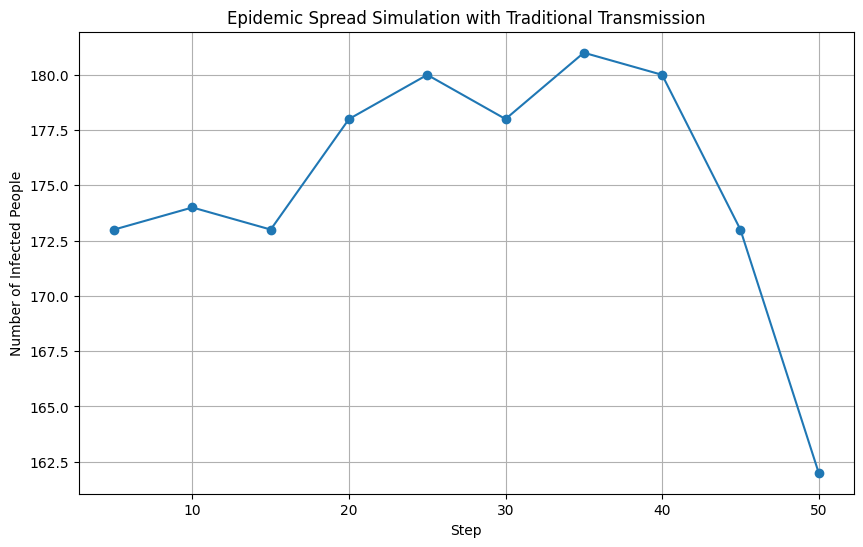

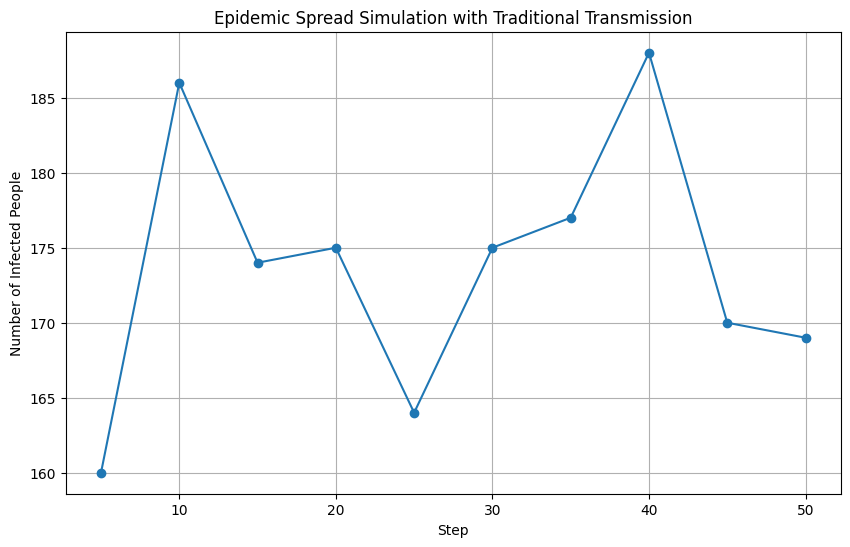

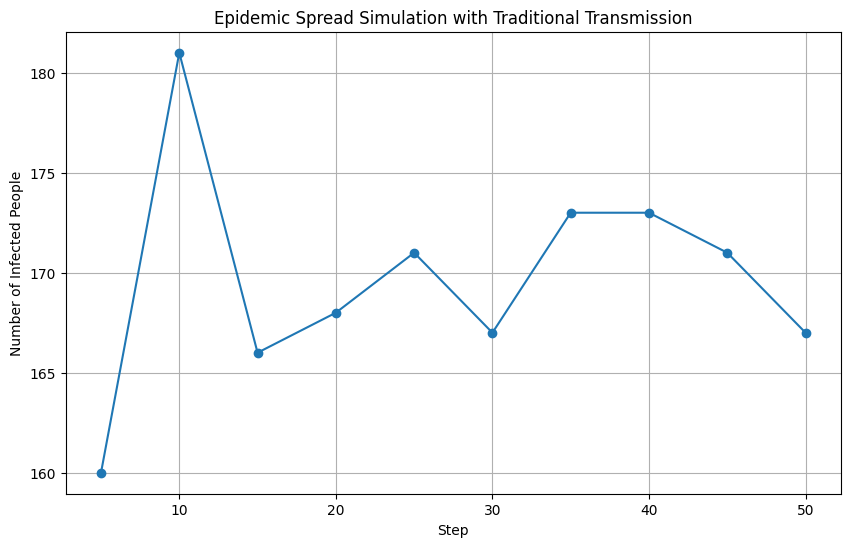

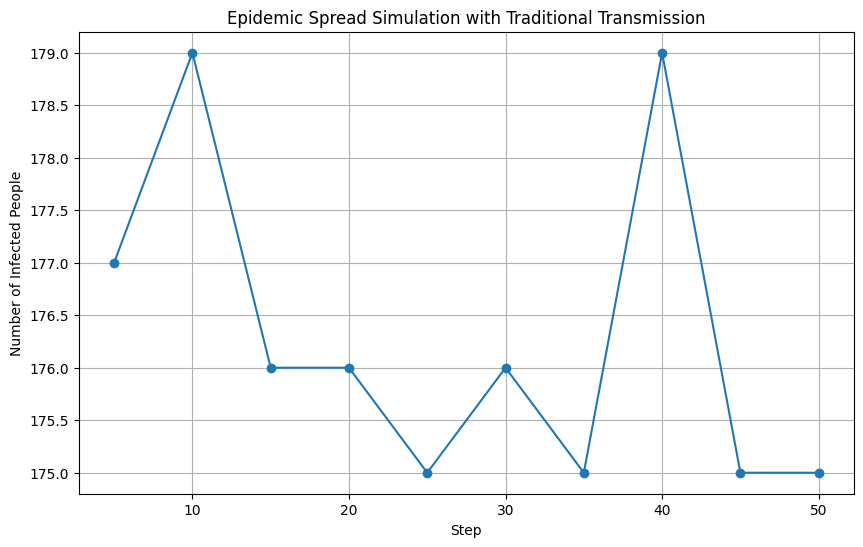

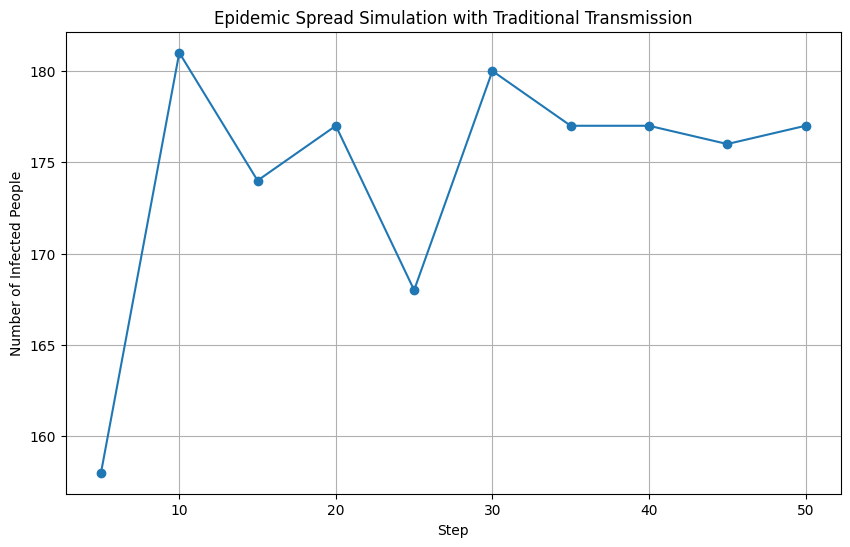

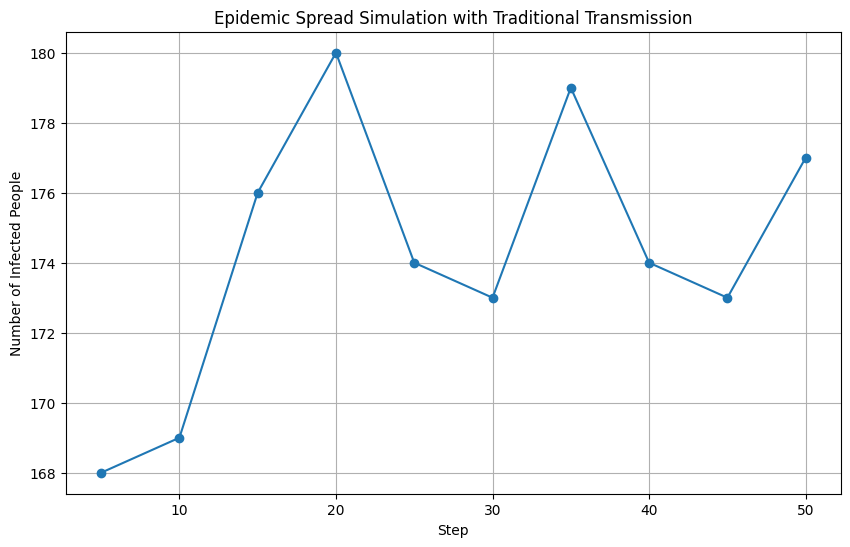

Simulating for Infection Rate=0.2, Recover Rate=0.3...
Quantum Connections: 400
Classical Connections: 300


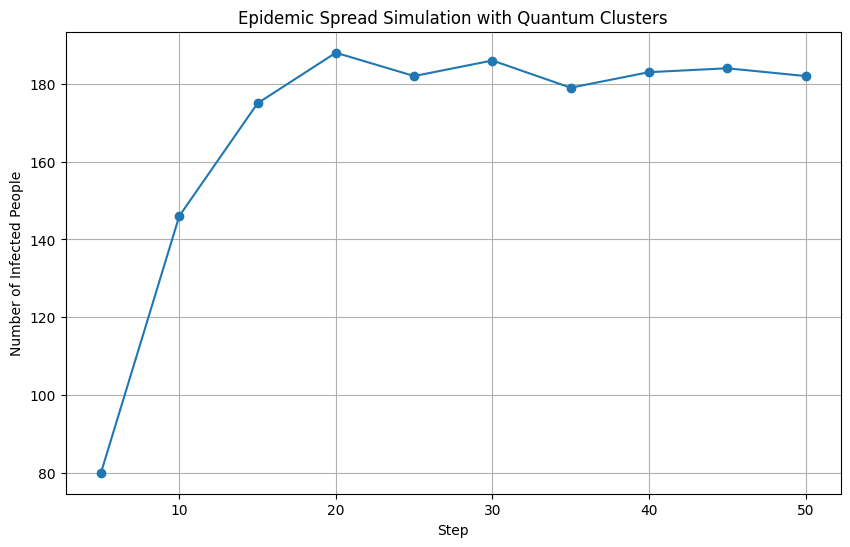

Quantum Connections: 400
Classical Connections: 300


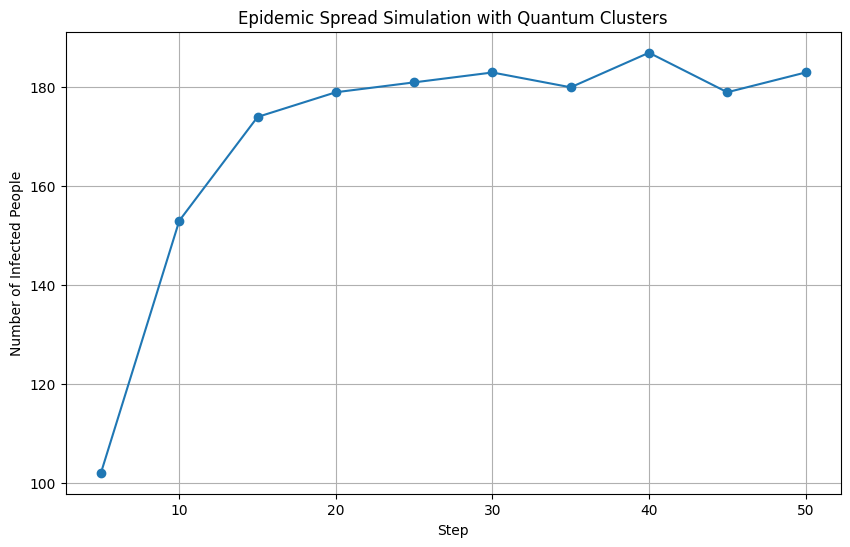

Quantum Connections: 400
Classical Connections: 300


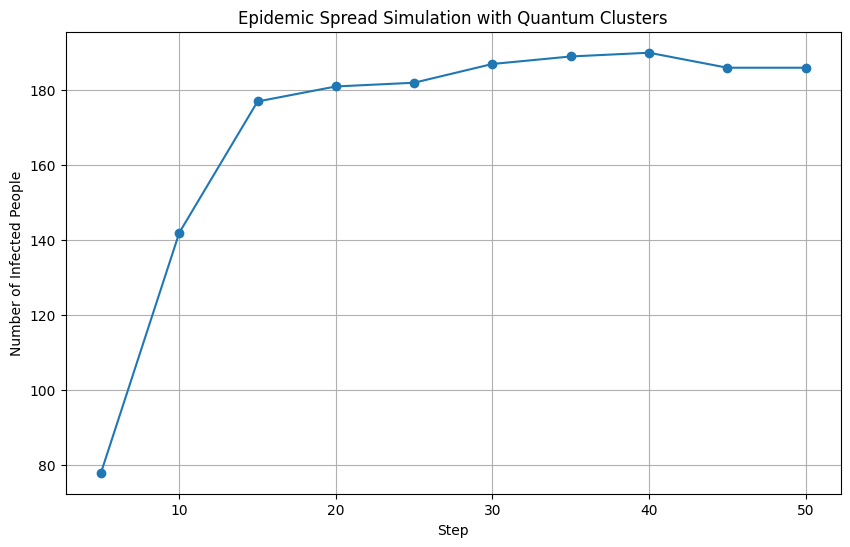

Quantum Connections: 400
Classical Connections: 300


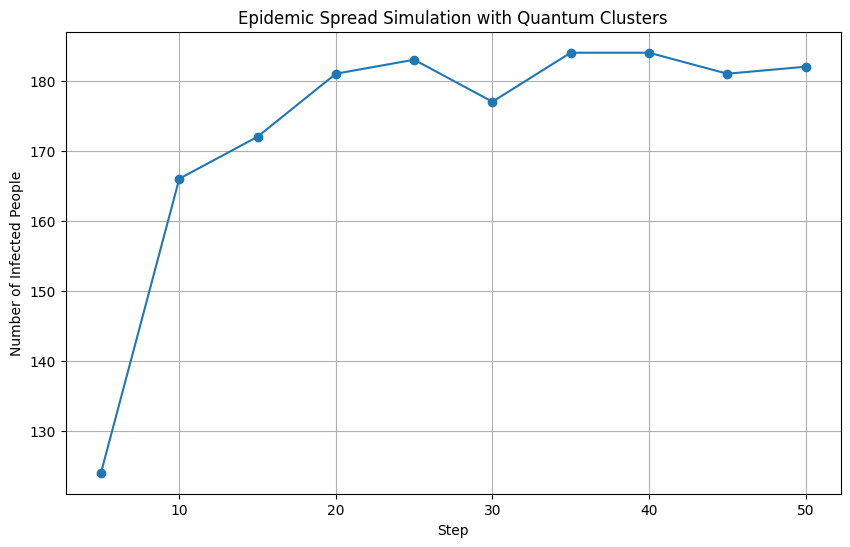

Quantum Connections: 400
Classical Connections: 300


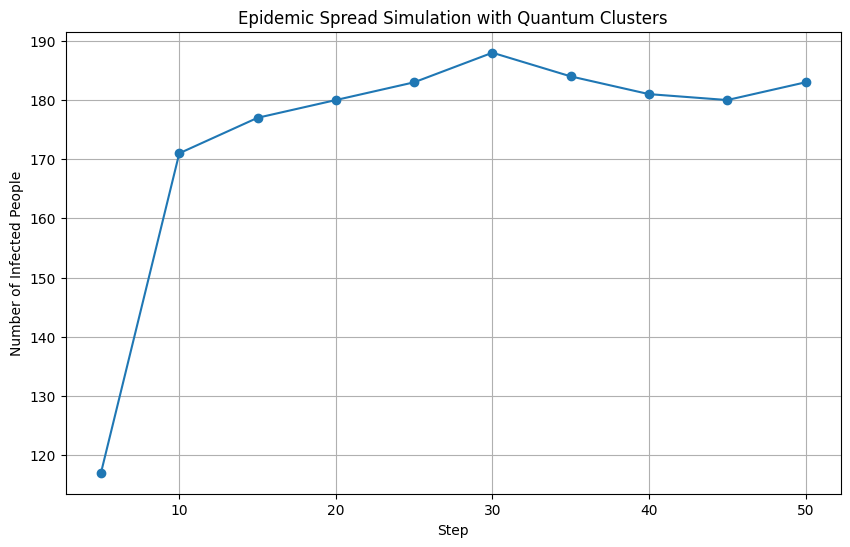

Quantum Connections: 400
Classical Connections: 300


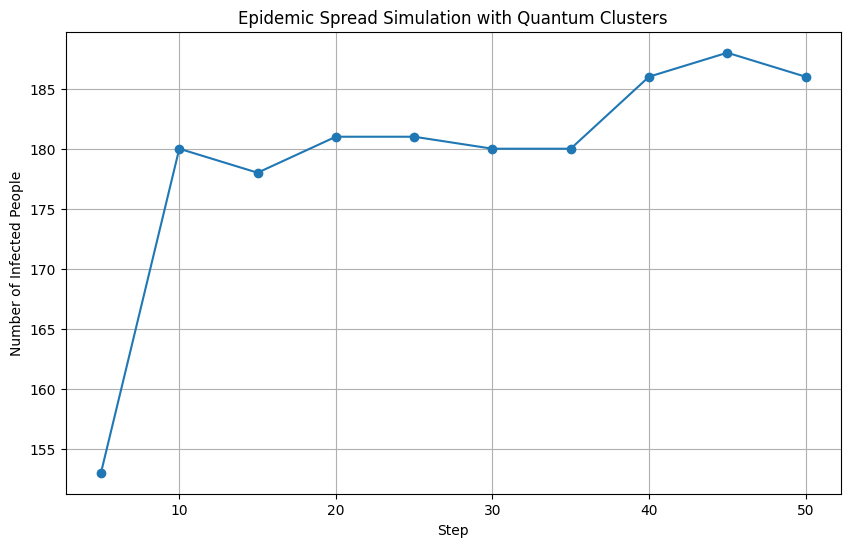

Quantum Connections: 400
Classical Connections: 300


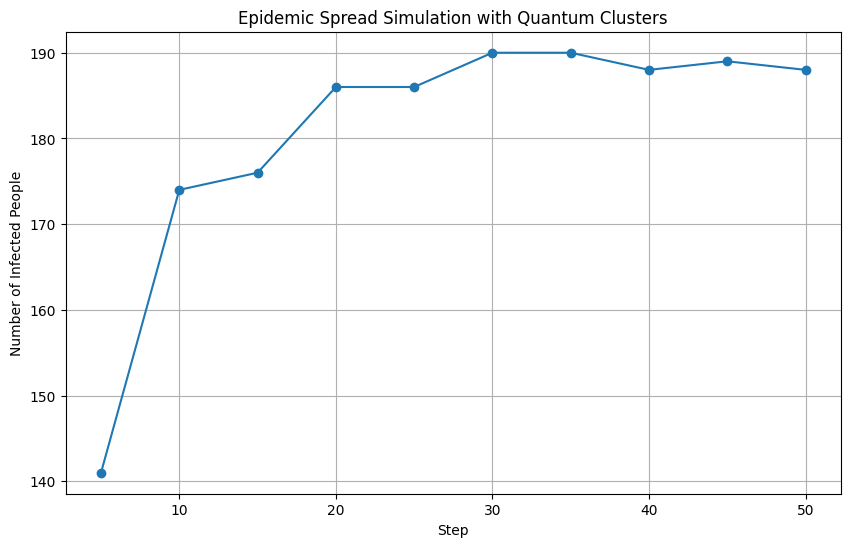

Quantum Connections: 400
Classical Connections: 300


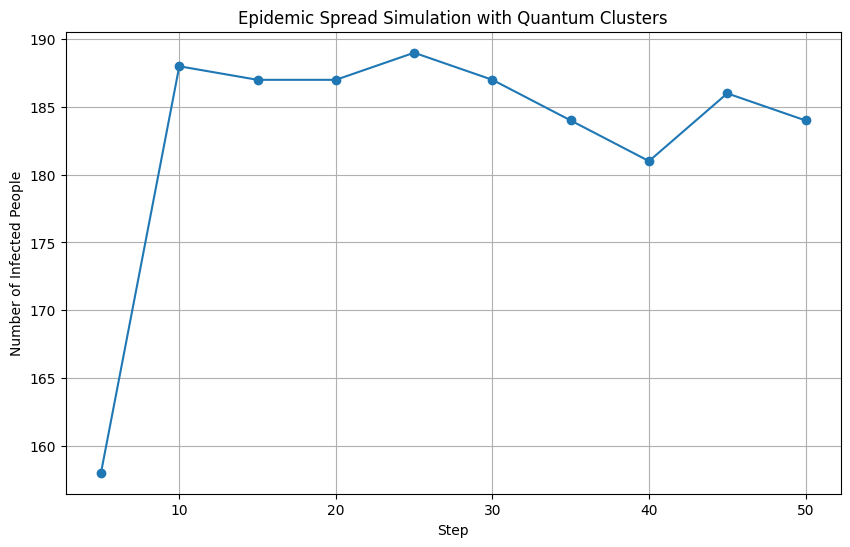

Quantum Connections: 400
Classical Connections: 300


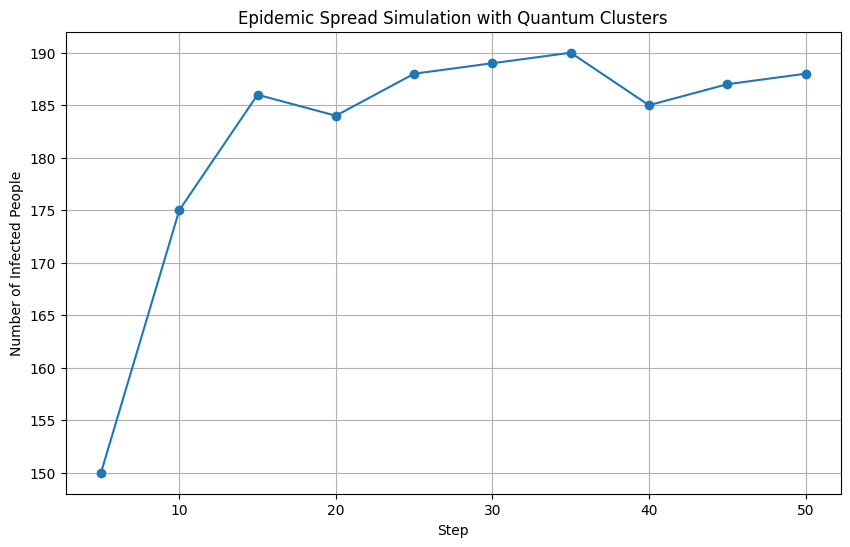

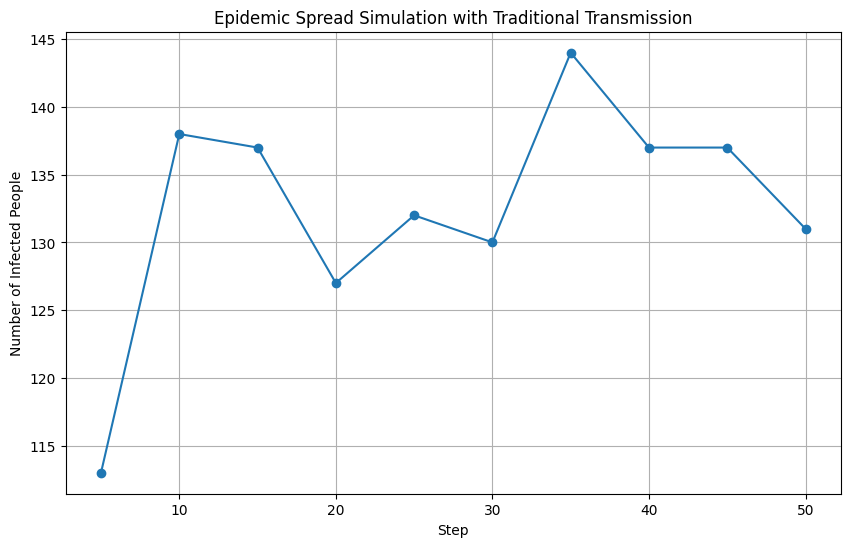

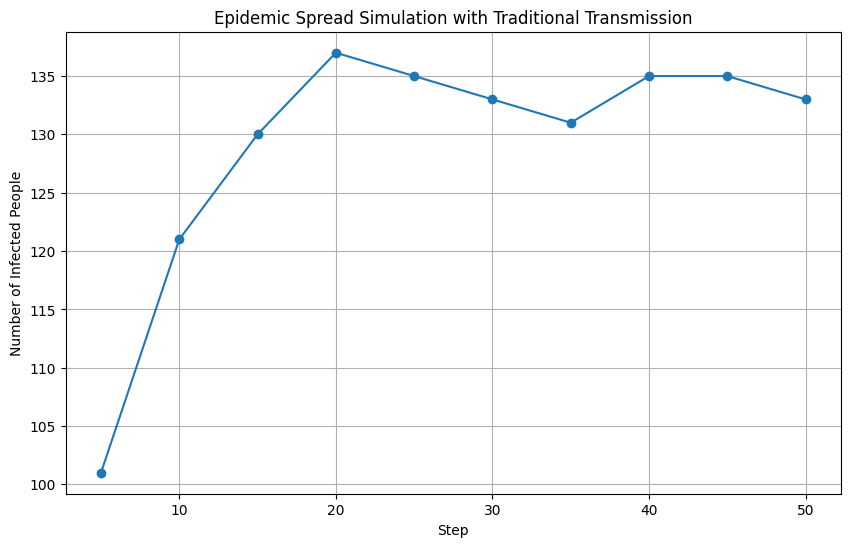

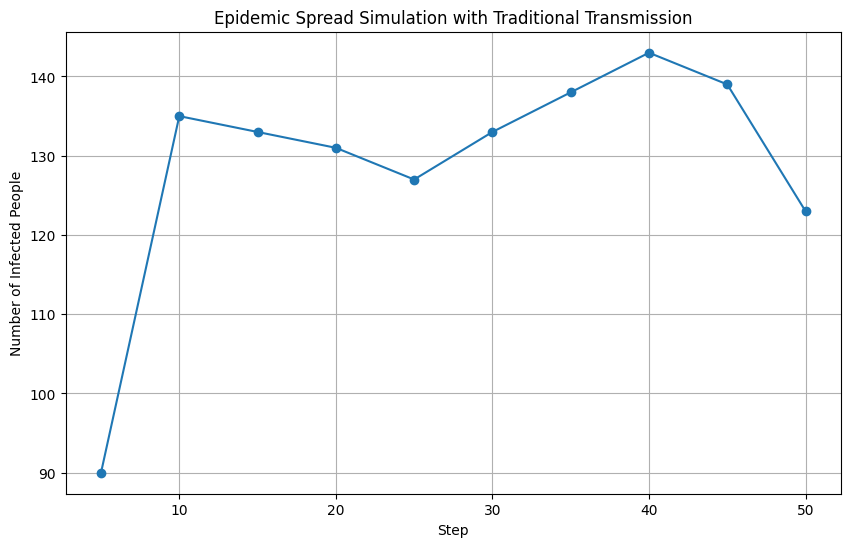

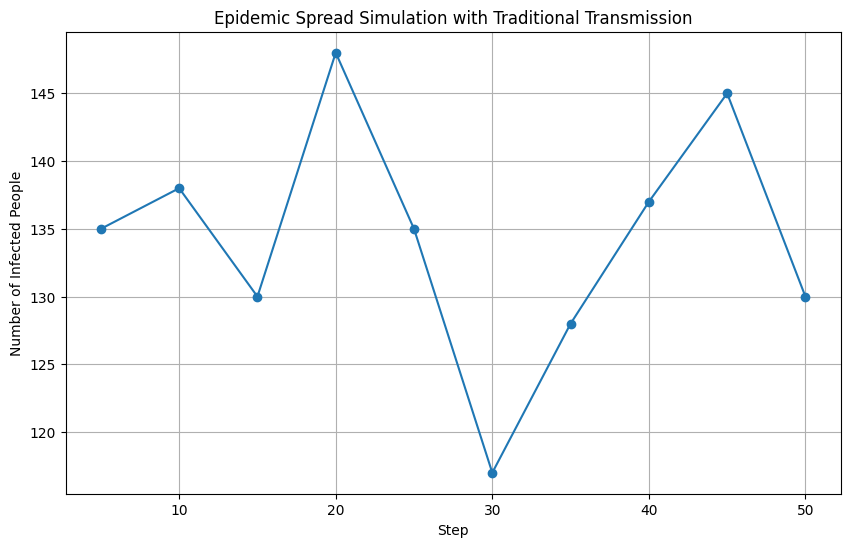

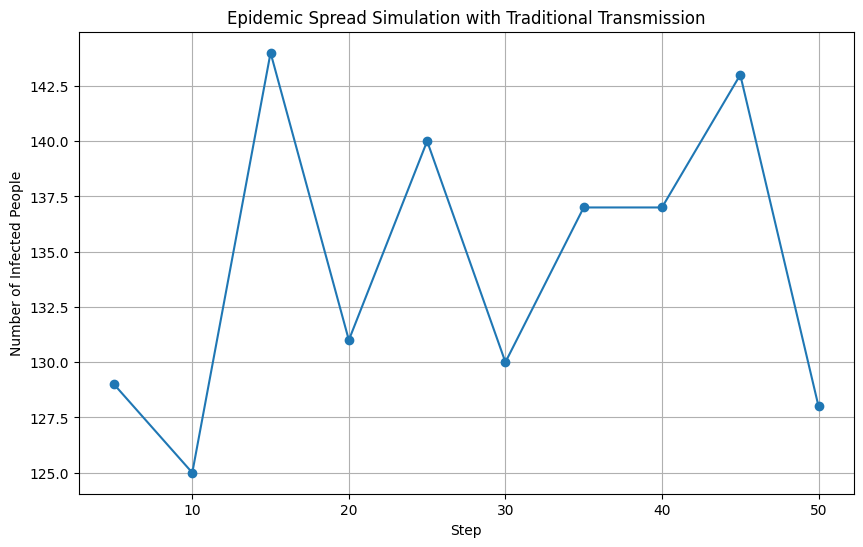

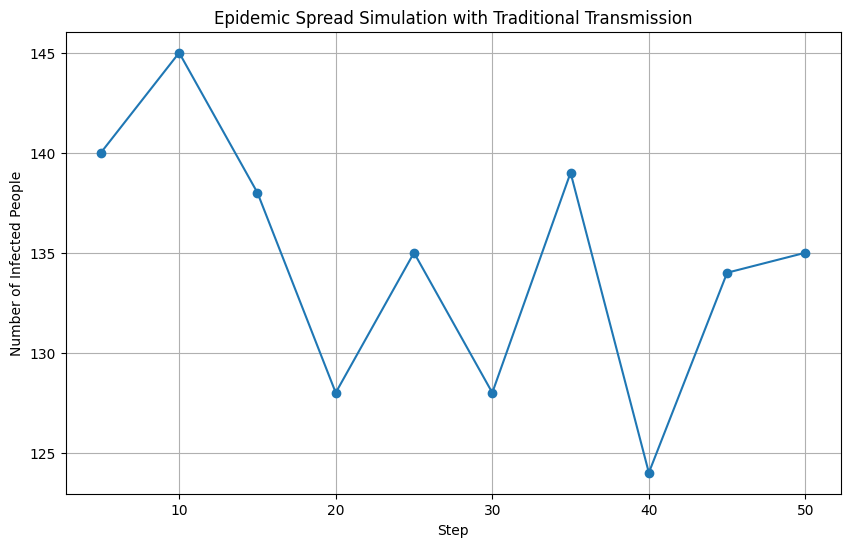

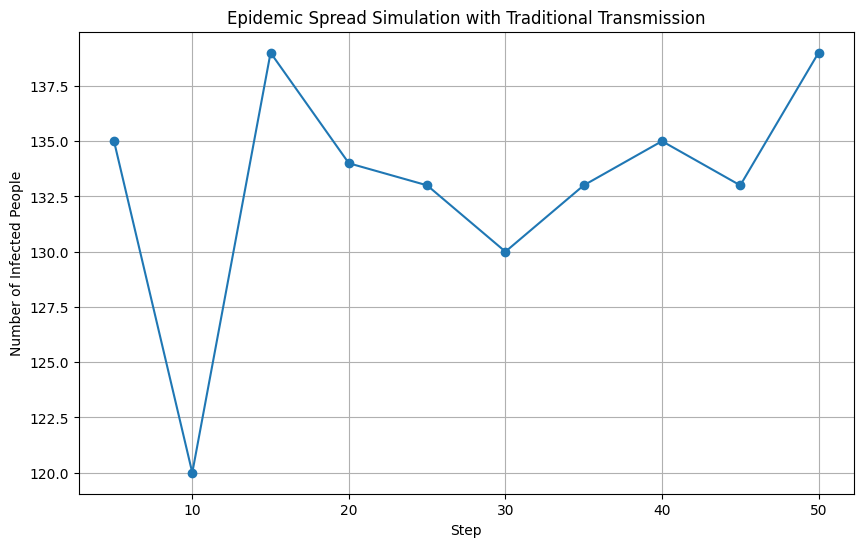

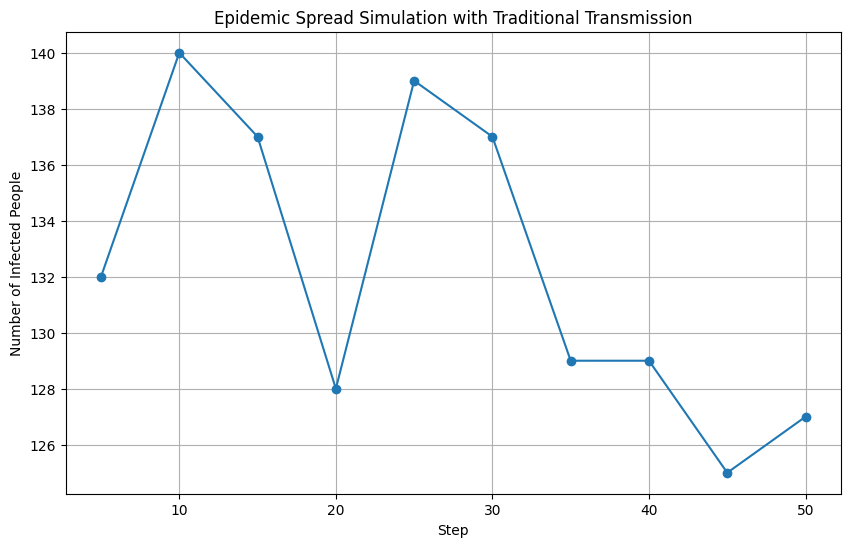

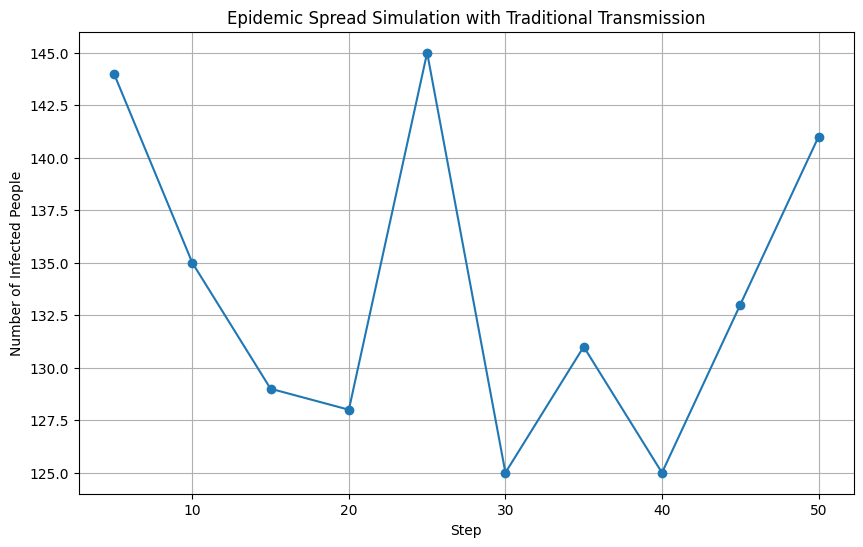

Simulating for Infection Rate=0.4, Recover Rate=0.1...
Quantum Connections: 400
Classical Connections: 300


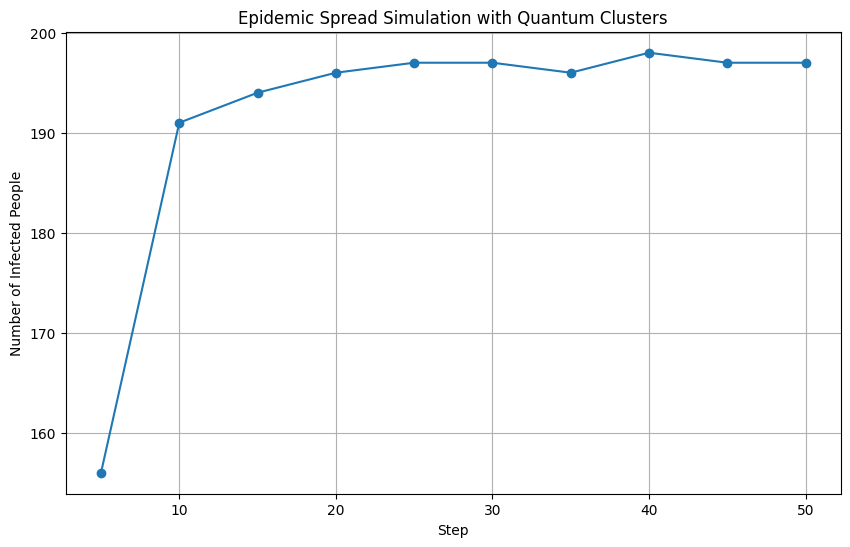

Quantum Connections: 400
Classical Connections: 300


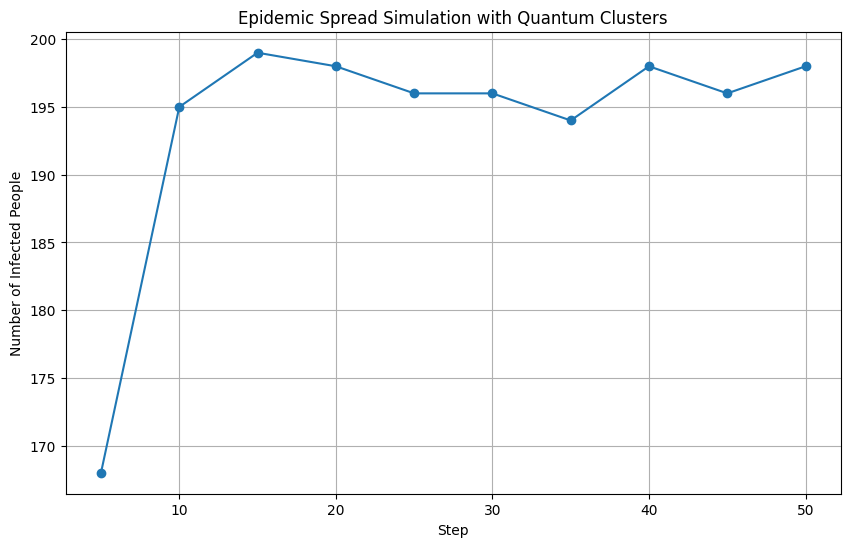

Quantum Connections: 400
Classical Connections: 300


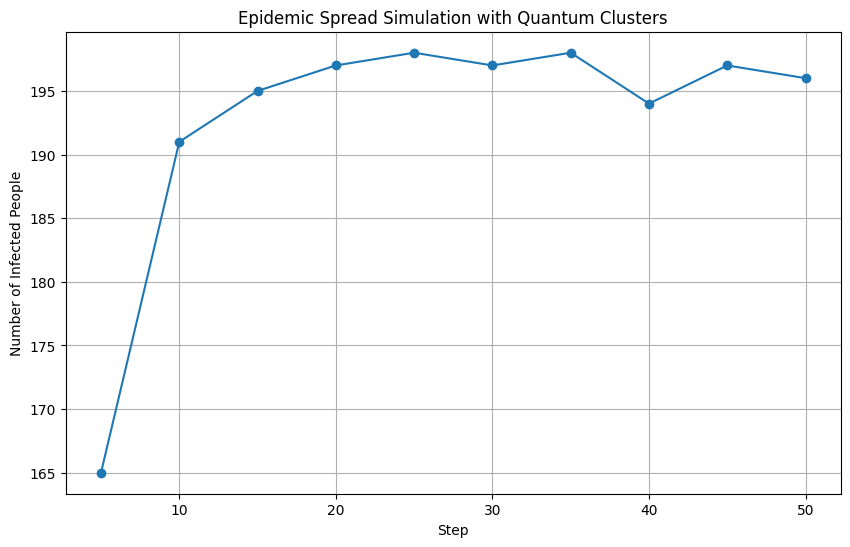

Quantum Connections: 400
Classical Connections: 300


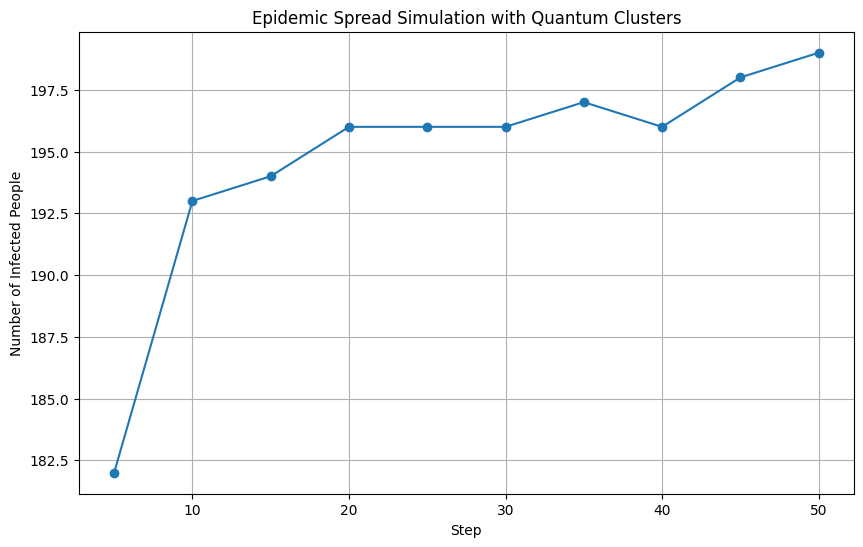

Quantum Connections: 400
Classical Connections: 300


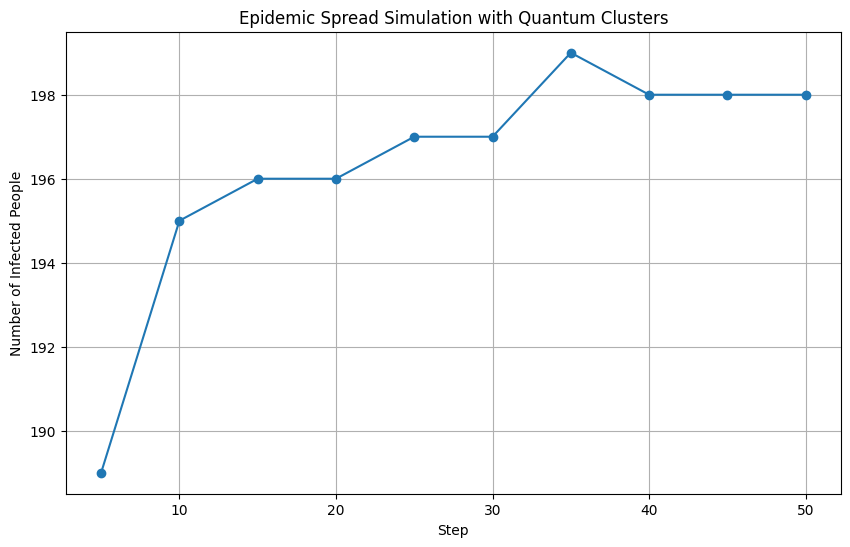

Quantum Connections: 400
Classical Connections: 300


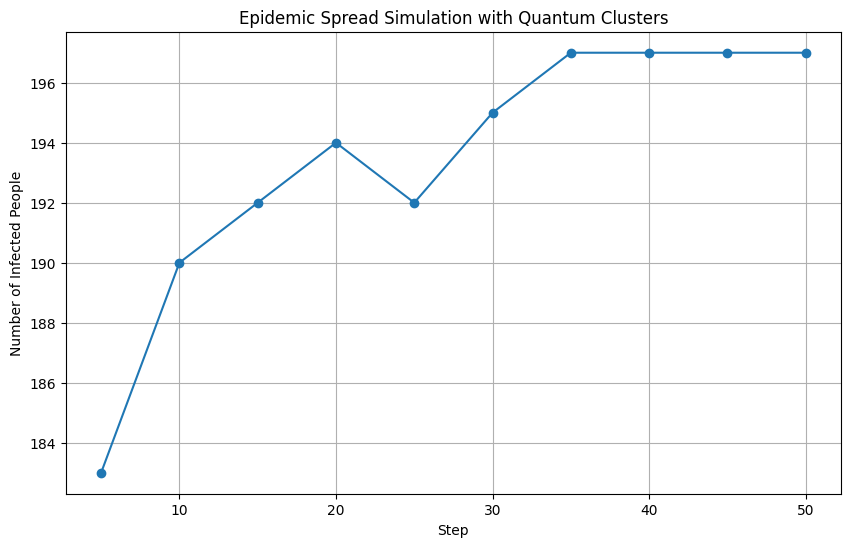

Quantum Connections: 400
Classical Connections: 300


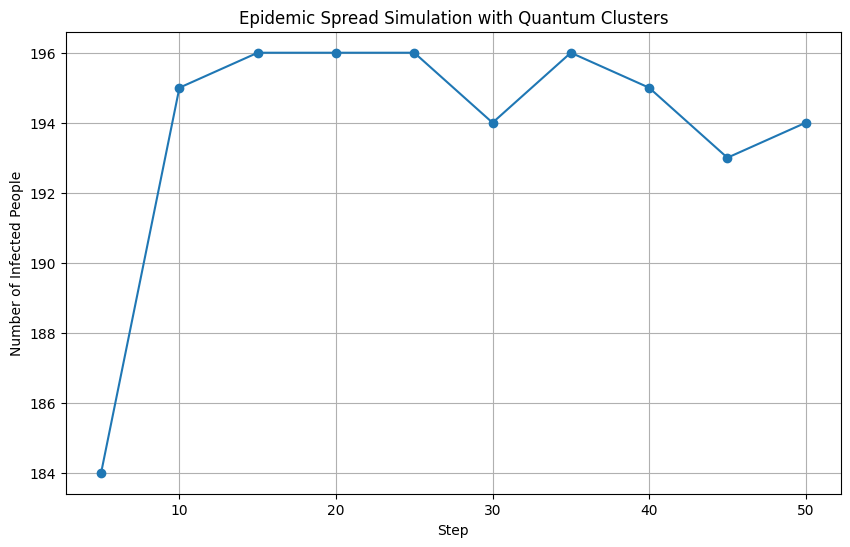

Quantum Connections: 400
Classical Connections: 300


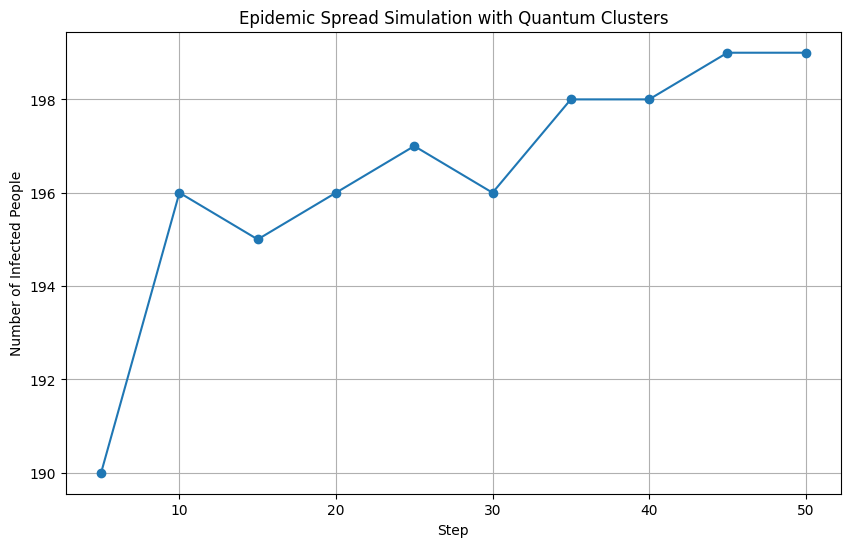

Quantum Connections: 400
Classical Connections: 300


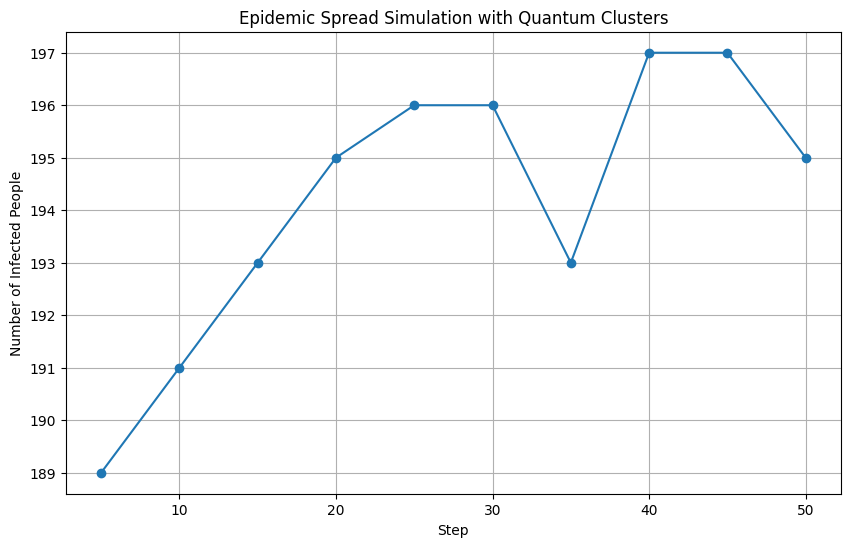

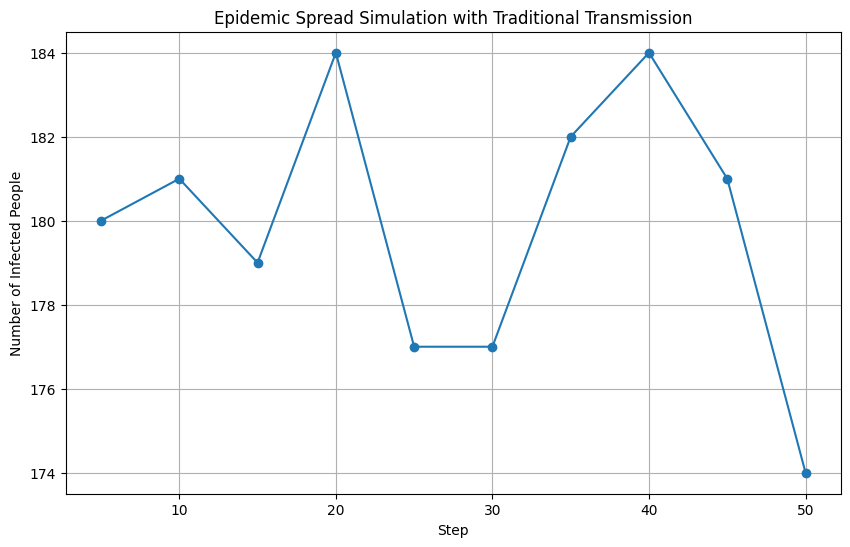

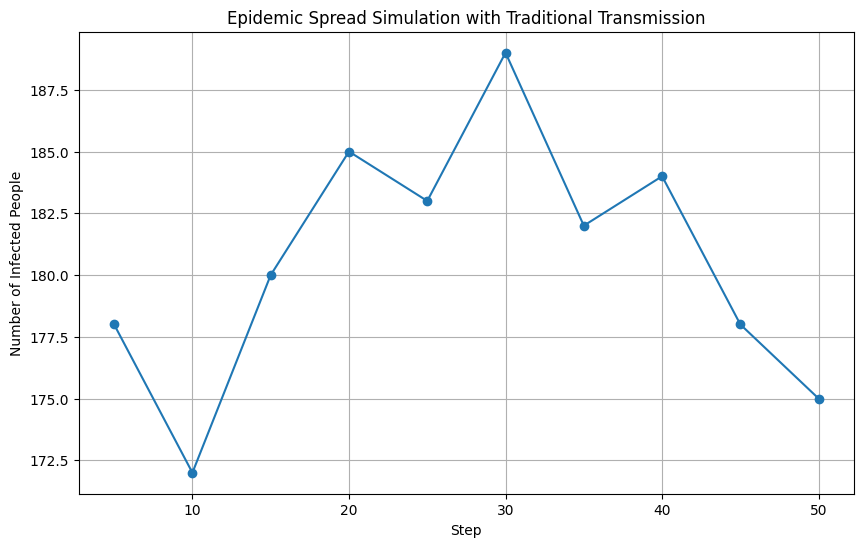

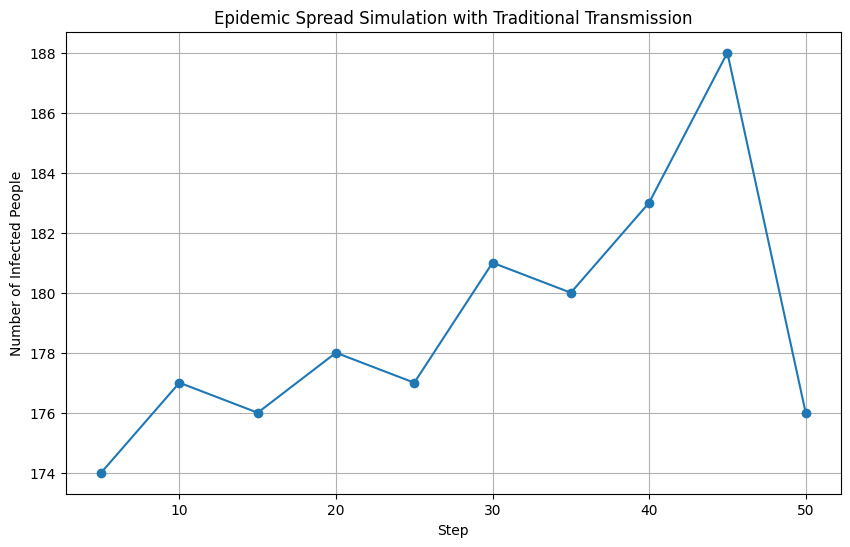

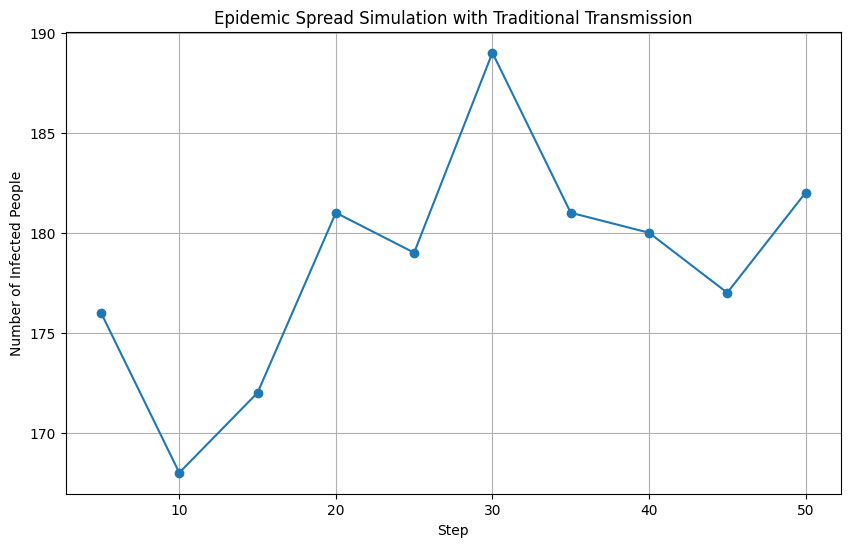

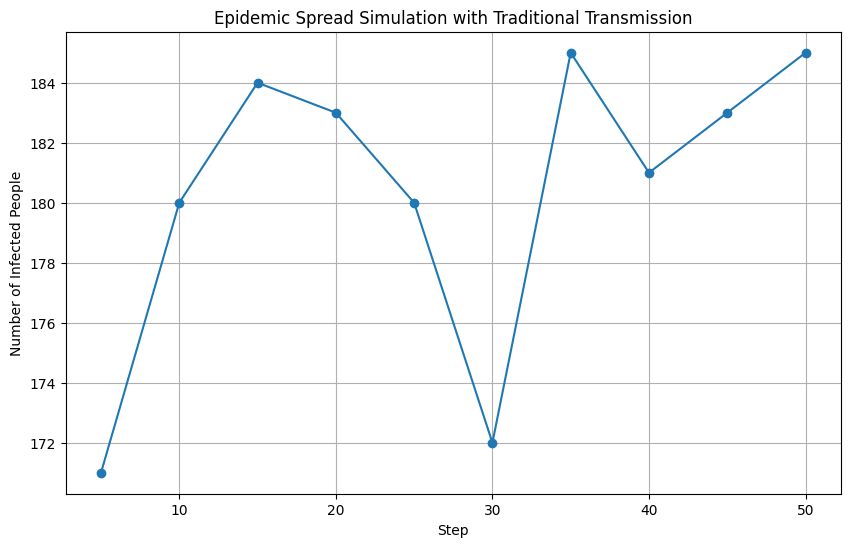

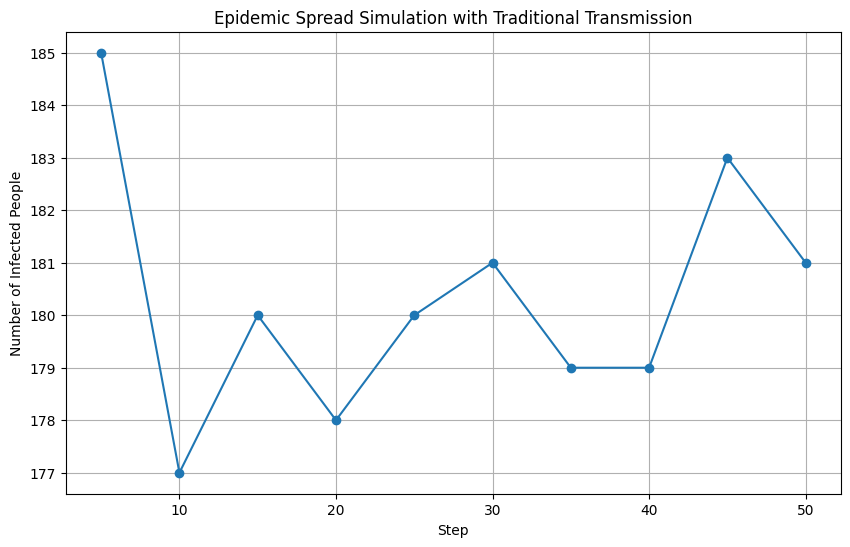

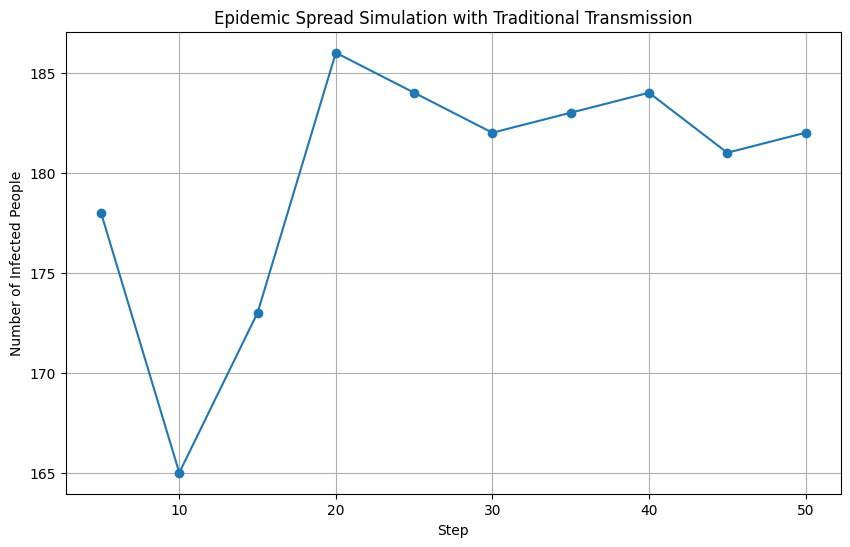

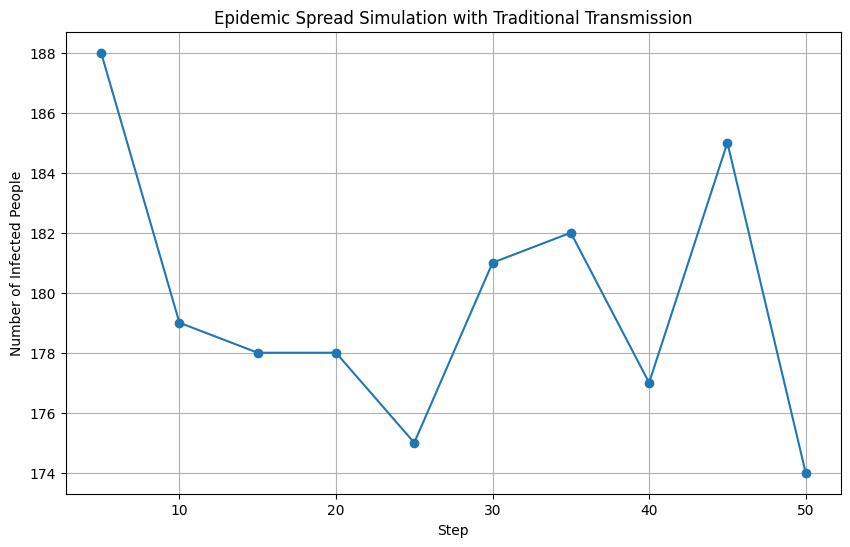

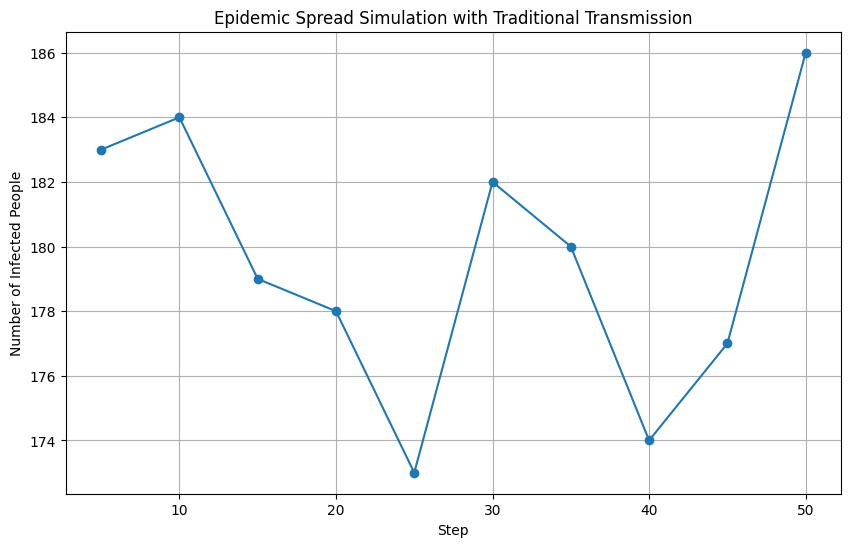

Simulating for Infection Rate=0.4, Recover Rate=0.3...
Quantum Connections: 400
Classical Connections: 300


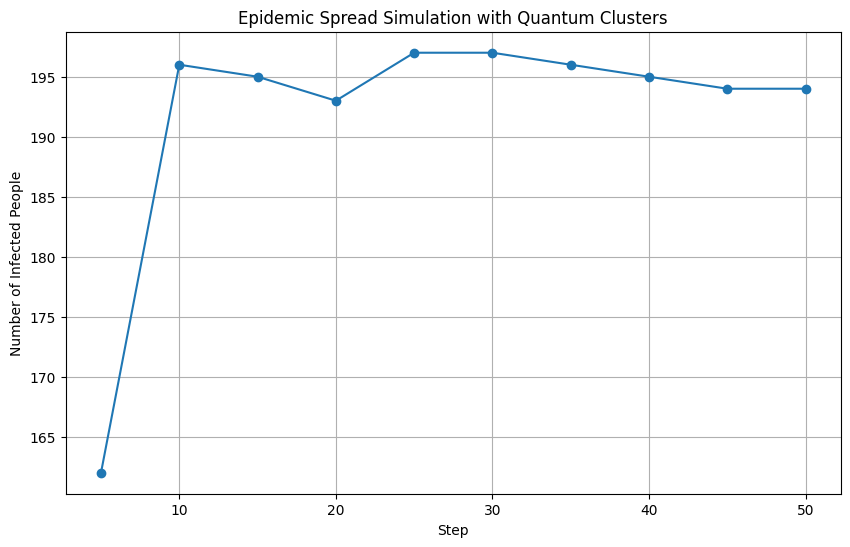

Quantum Connections: 400
Classical Connections: 300


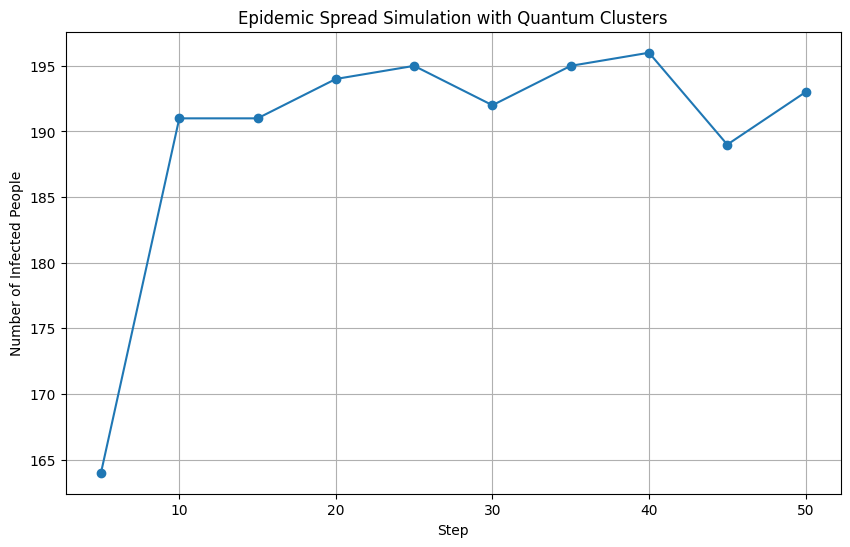

Quantum Connections: 400
Classical Connections: 300


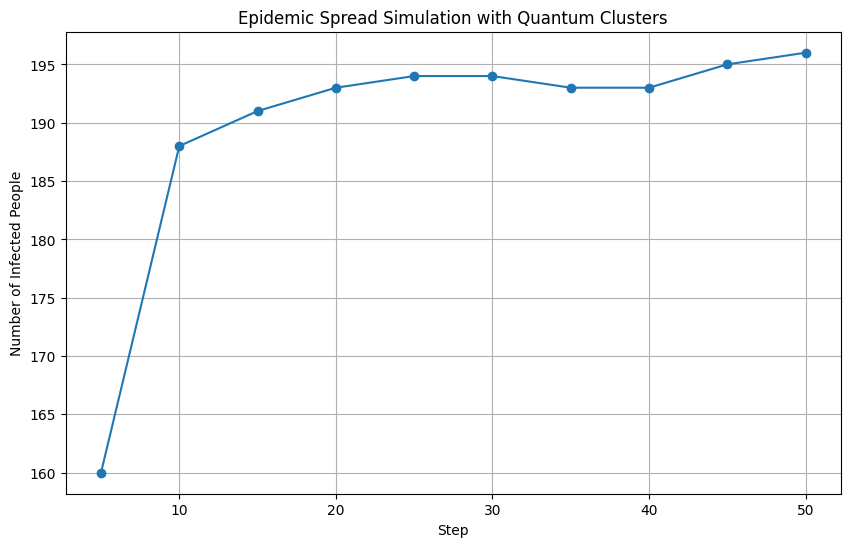

Quantum Connections: 400
Classical Connections: 300


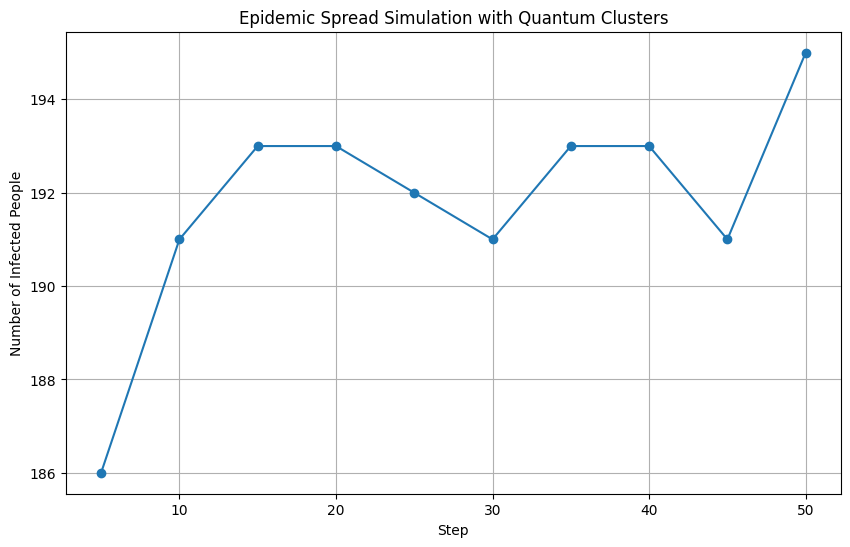

Quantum Connections: 400
Classical Connections: 300


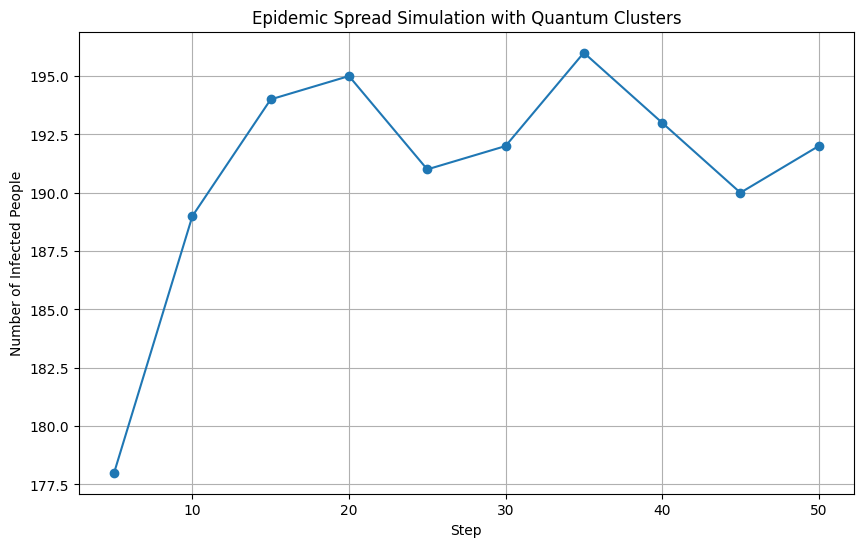

Quantum Connections: 400
Classical Connections: 300


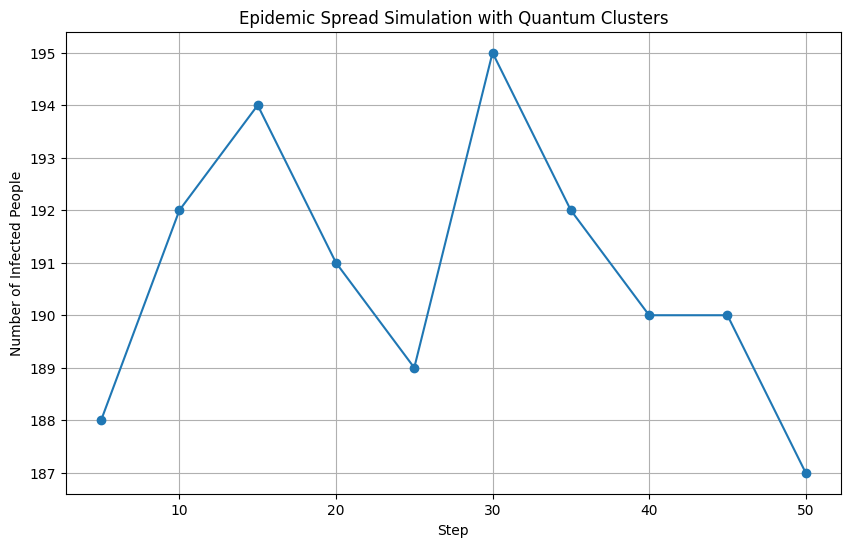

Quantum Connections: 400
Classical Connections: 300


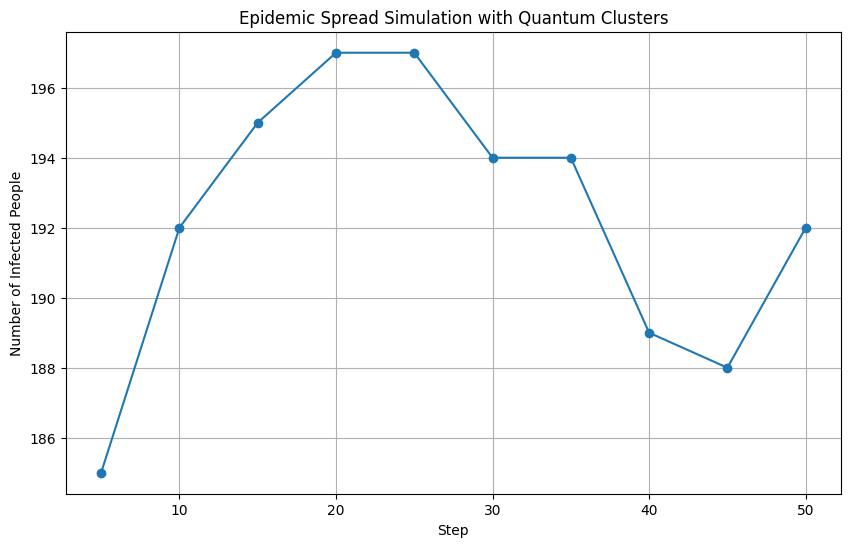

Quantum Connections: 400
Classical Connections: 300


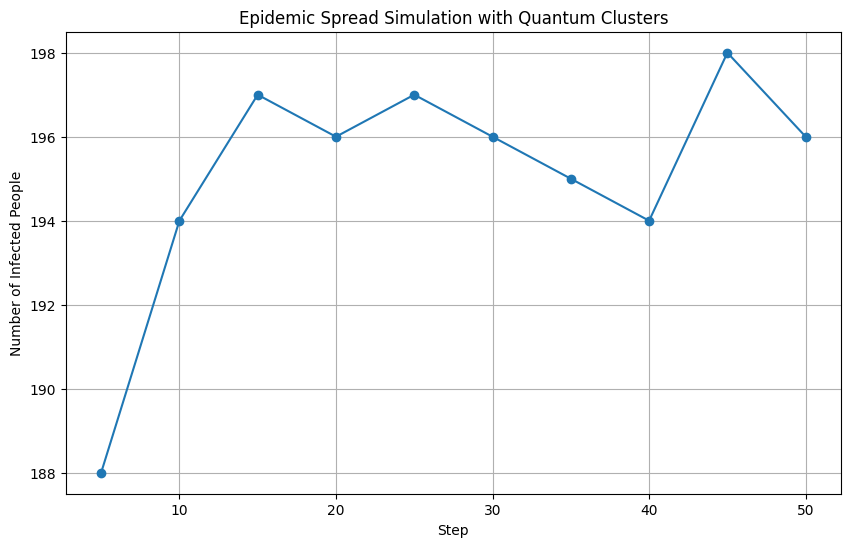

Quantum Connections: 400
Classical Connections: 300


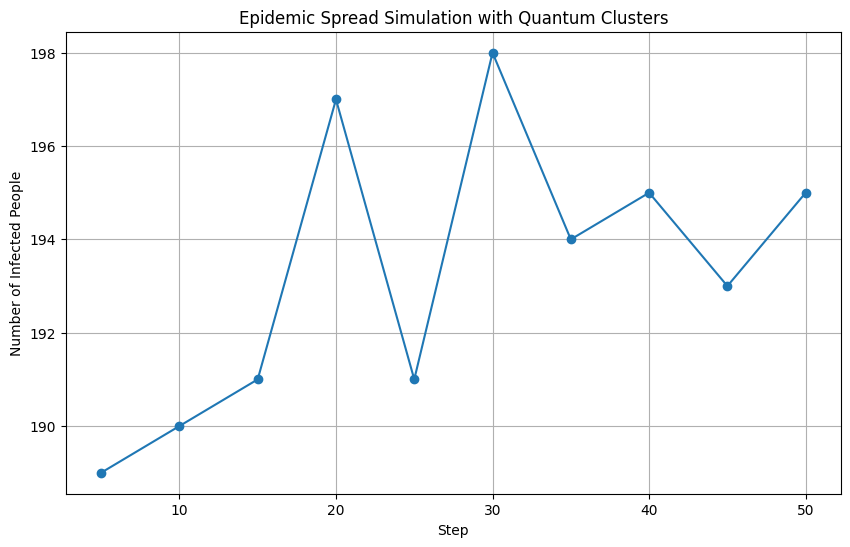

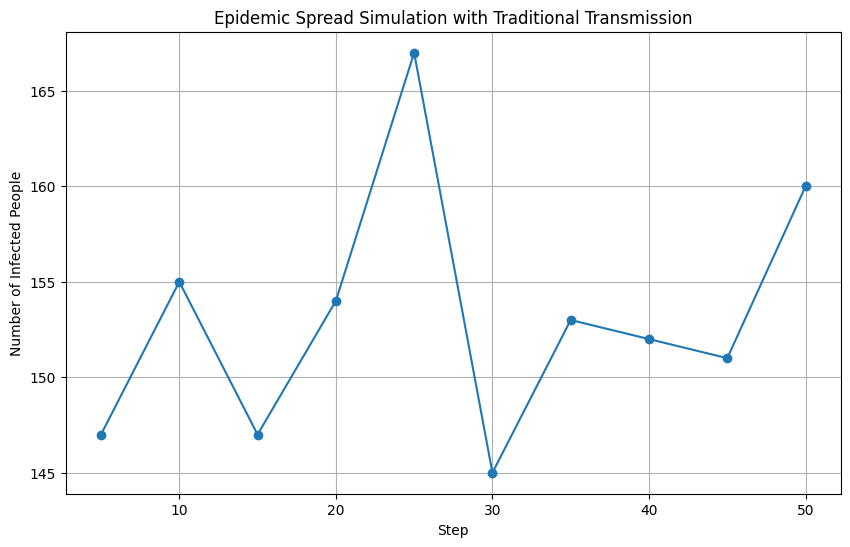

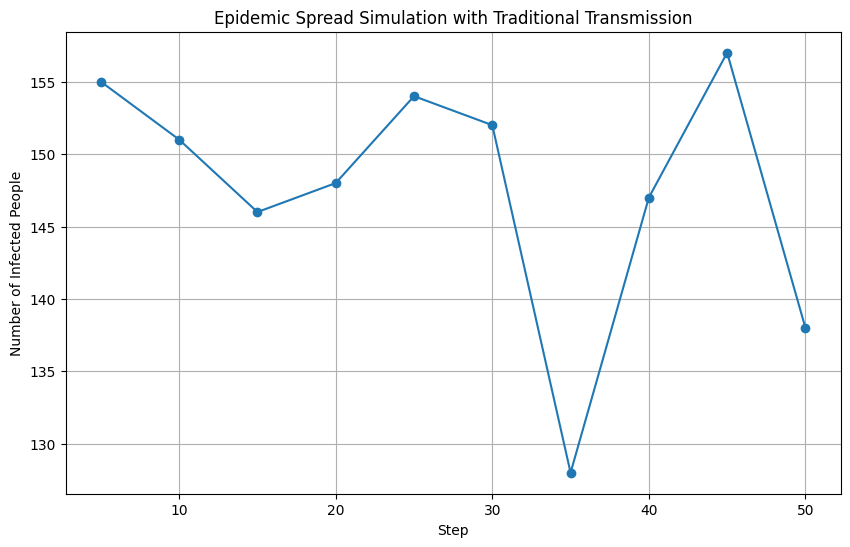

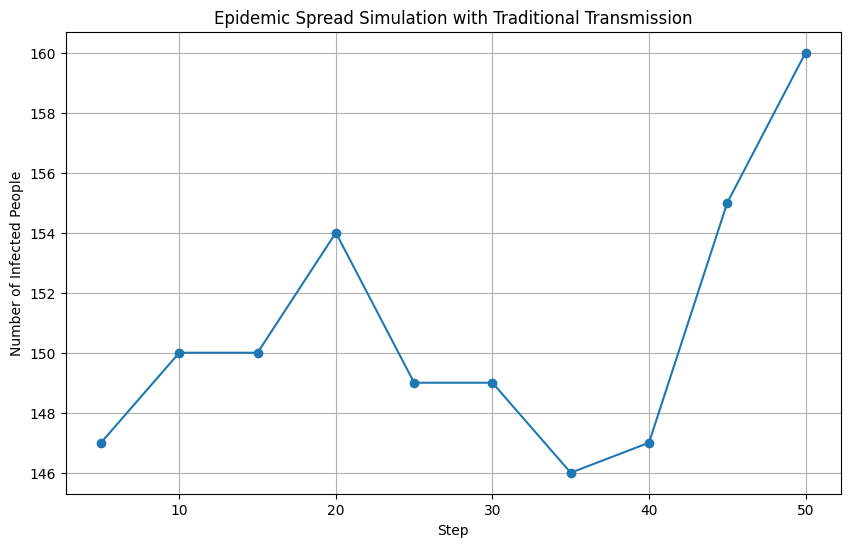

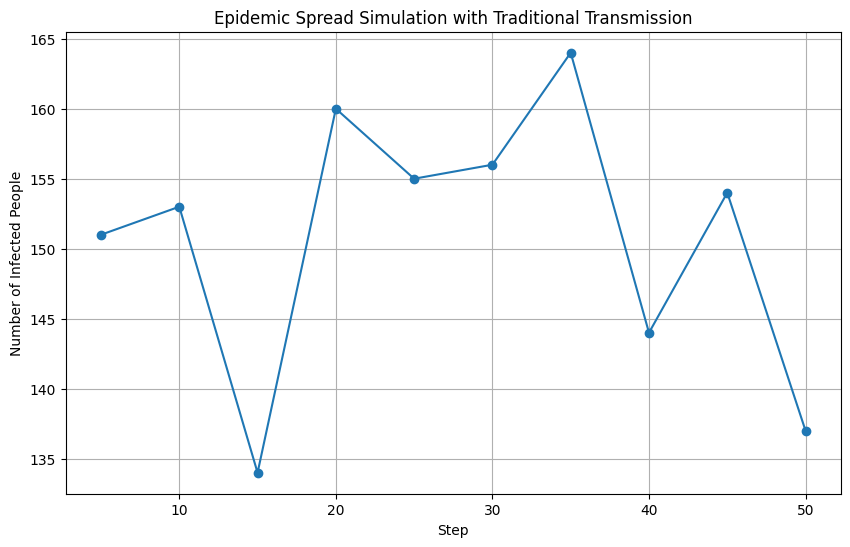

...

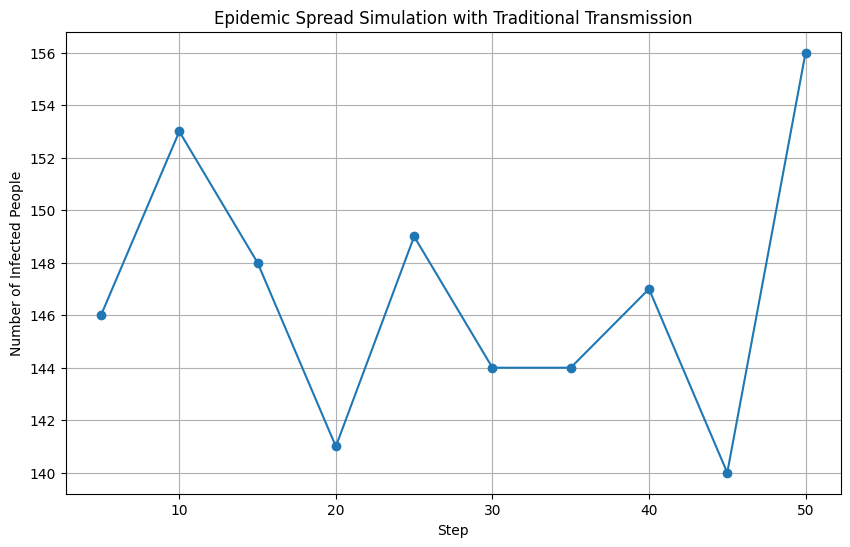

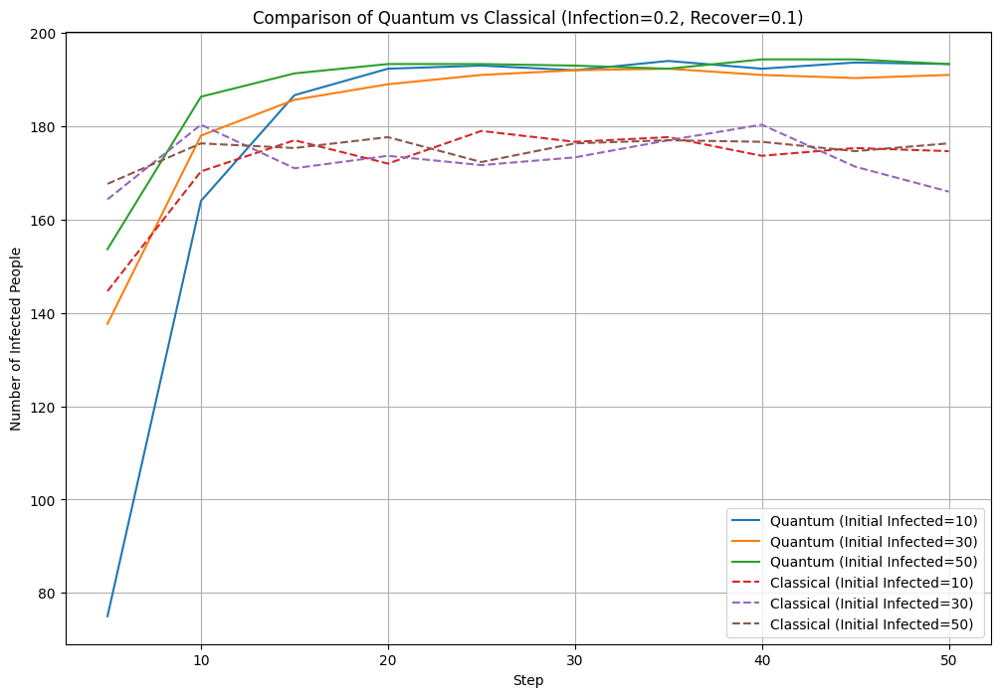

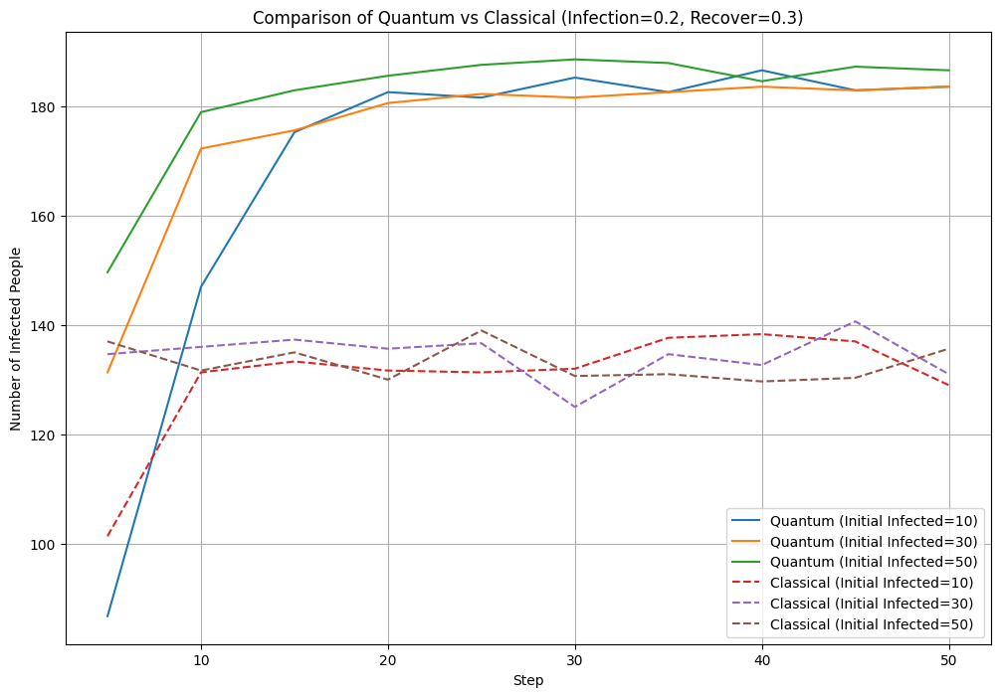

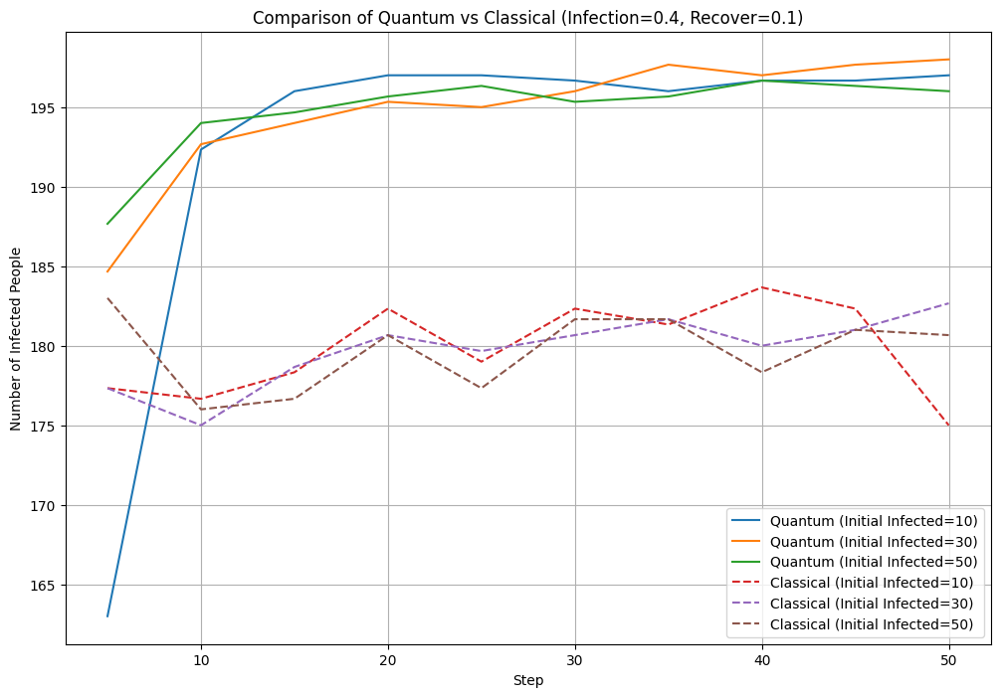

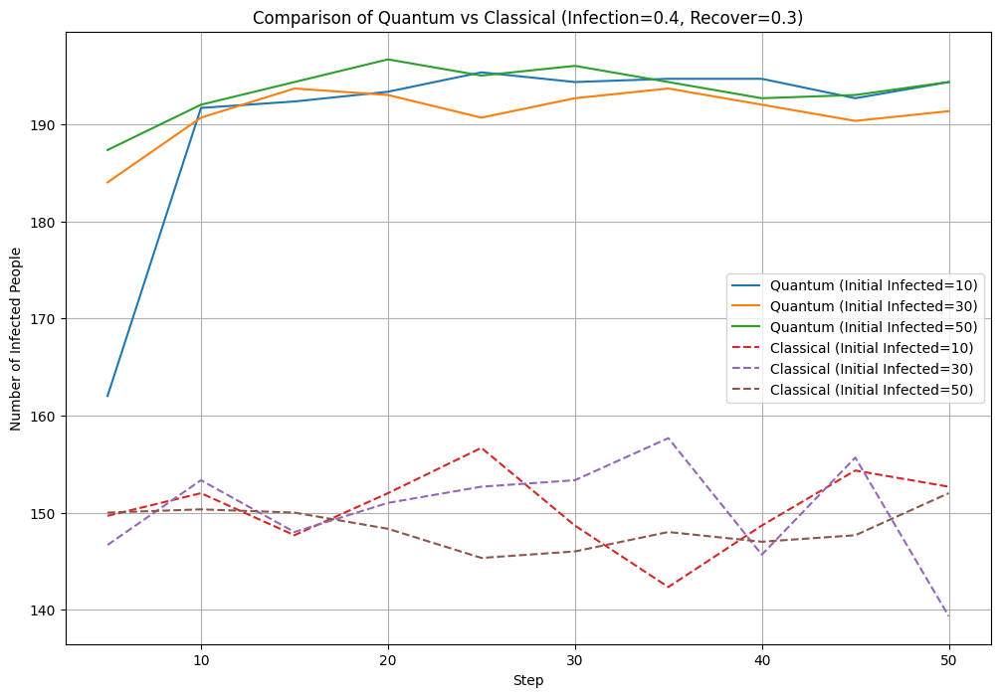

In [23]:
def compare_quantum_vs_classical(
    infection_rates,
    recover_rates,
    num_people,
    num_clusters,
    intra_connections_per_cluster,
    total_inter_connections,
    initial_infected_values,
    num_steps=100,
    measure_interval=5,
    num_simulations=5,  # 每組參數重複模擬次數
):
    """
    比較有無量子電路的情況下，流行病傳播的差異
    """
    results = {
        "quantum": {},
        "classical": {},
    }

    # 遍歷參數組合
    for infection_rate in infection_rates:
        for recover_rate in recover_rates:
            print(f"Simulating for Infection Rate={infection_rate}, Recover Rate={recover_rate}...")

            for method in ["quantum", "classical"]:
                # 初始化儲存結果的結構
                results[method][(infection_rate, recover_rate)] = {}

                for initial_infected in initial_infected_values:
                    all_counts = []

                    for _ in range(num_simulations):
                        if method == "quantum":
                            counts = epidemic_simulation(
                                infection_rate=infection_rate,
                                recover_rate=recover_rate,
                                num_people=num_people,
                                initial_infected=initial_infected,
                                num_clusters=num_clusters,
                                intra_connections_per_cluster=intra_connections_per_cluster,
                                total_inter_connections=total_inter_connections,
                                num_steps=num_steps,
                                measure_interval=measure_interval,
                            )
                        else:
                            counts = traditional_epidemic_simulation(
                                infection_rate=infection_rate,
                                recover_rate=recover_rate,
                                num_people=num_people,
                                initial_infected=initial_infected,
                                num_clusters=num_clusters,
                                intra_connections_per_cluster=intra_connections_per_cluster,
                                total_inter_connections=total_inter_connections,
                                num_steps=num_steps,
                                measure_interval=measure_interval,
                            )
                        all_counts.append(counts)

                    # 計算平均結果
                    avg_counts = np.mean(all_counts, axis=0)
                    results[method][(infection_rate, recover_rate)][initial_infected] = avg_counts

    # 繪製結果
    steps = list(range(measure_interval, num_steps + 1, measure_interval))
    for infection_rate in infection_rates:
        for recover_rate in recover_rates:
            plt.figure(figsize=(12, 8))
            for method in ["quantum", "classical"]:
                for initial_infected, counts in results[method][(infection_rate, recover_rate)].items():
                    plt.plot(
                        steps,
                        counts,
                        label=f"{method.capitalize()} (Initial Infected={initial_infected})",
                        linestyle="-" if method == "quantum" else "--",
                    )

            plt.xlabel("Step")
            plt.ylabel("Number of Infected People")
            plt.title(f"Comparison of Quantum vs Classical (Infection={infection_rate}, Recover={recover_rate})")
            plt.legend()
            plt.grid(True)
            plt.show()


# 呼叫函數進行模擬與比較
compare_quantum_vs_classical(
    infection_rates=[0.2, 0.4],
    recover_rates=[0.1, 0.3],
    num_people=200,
    num_clusters=20,
    intra_connections_per_cluster=20,
    total_inter_connections=300,
    initial_infected_values=[10, 30, 50],
    num_steps=50,
    measure_interval=5,
    num_simulations=3,
)


In [24]:
def inverse_sin_squared(y):
        if y < 0 or y > 1:
            raise ValueError("Input y must be in the range [0, 1]")
        arcsin_sqrt_y = np.arcsin(np.sqrt(y))
        return (2 / np.pi) * arcsin_sqrt_y
inverse_sin_squared(0.1)


0.20483276469913345

Simulating for Infection Rate=0.1, Recover Rate=0.1...


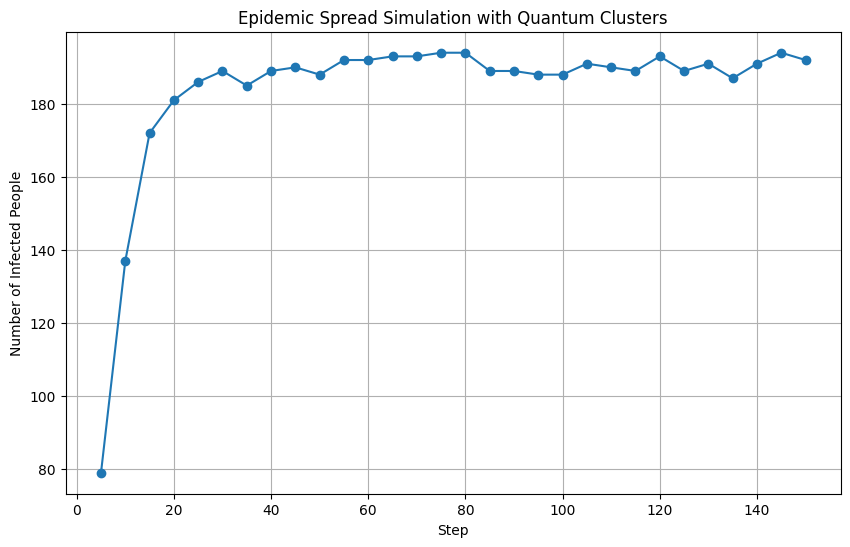

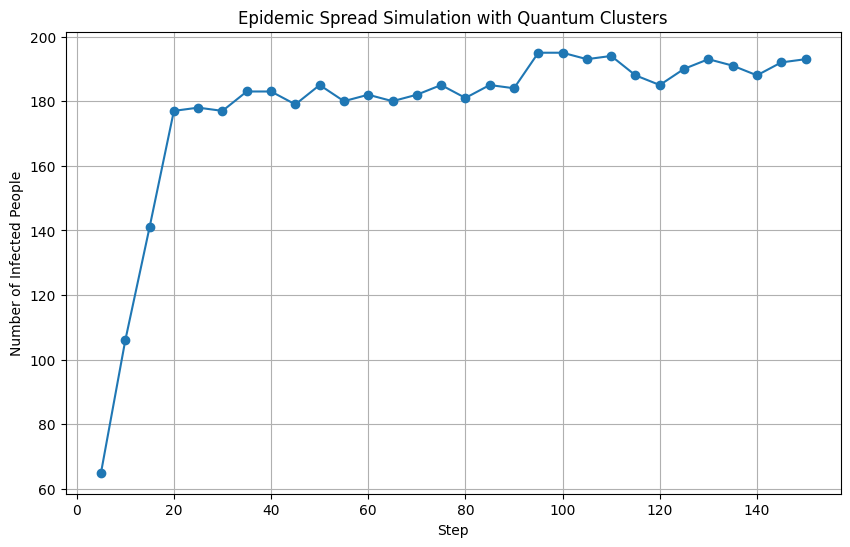

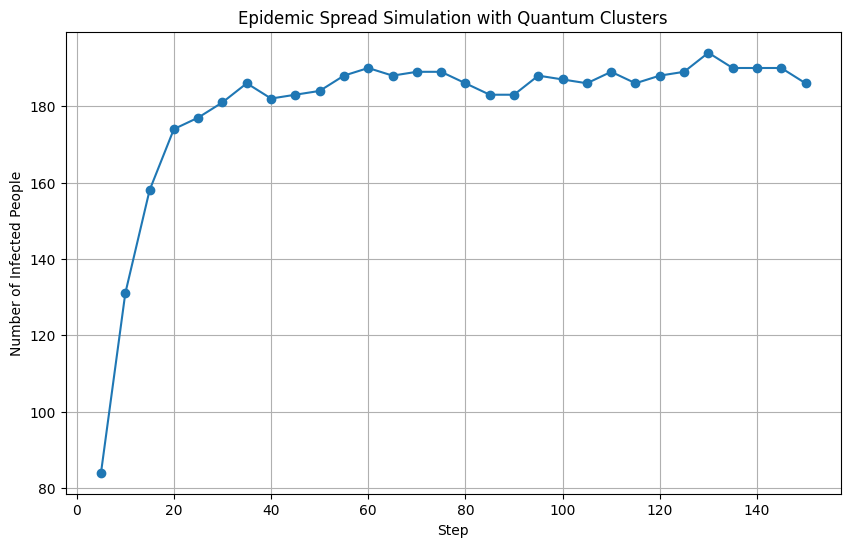

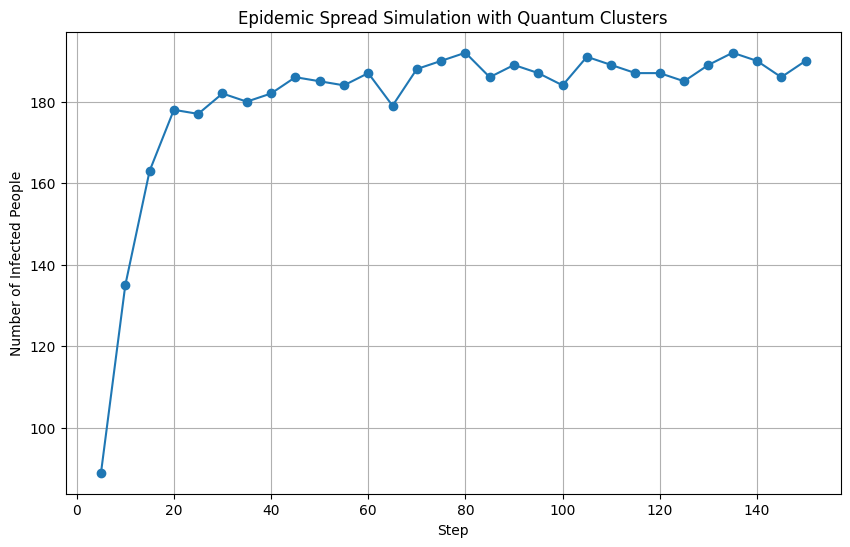

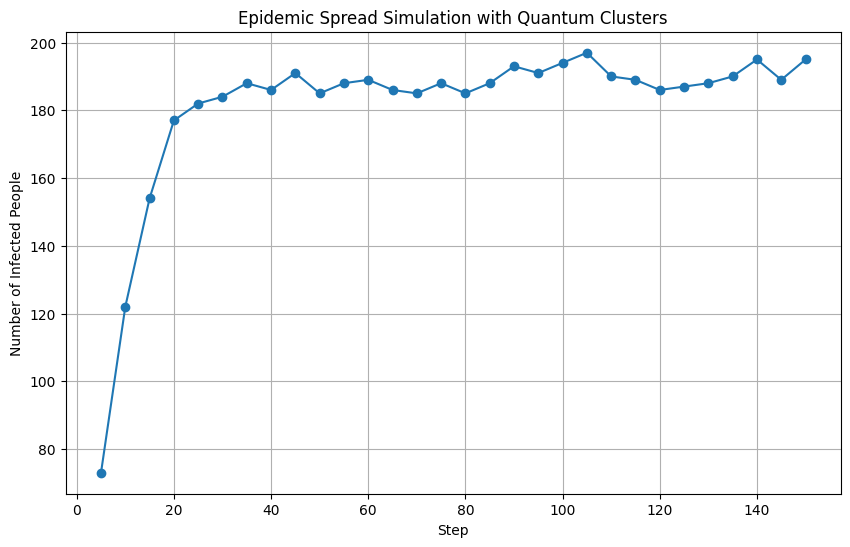

...

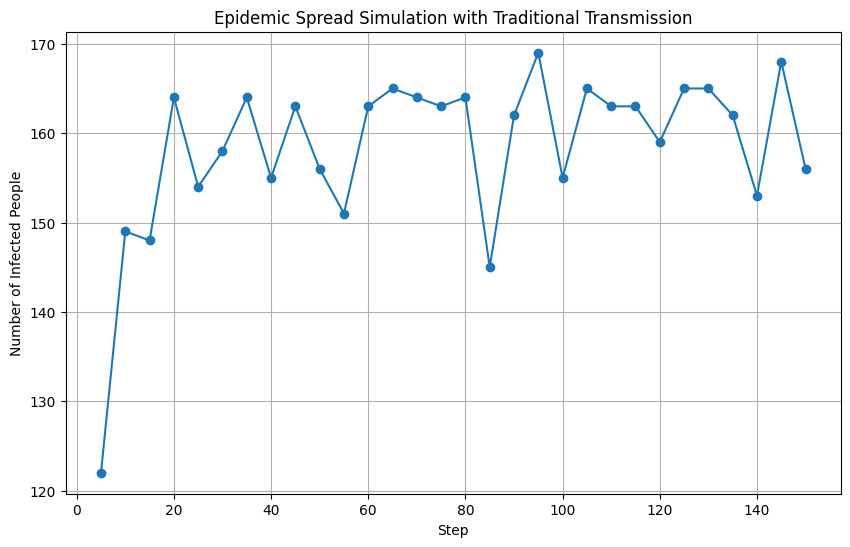

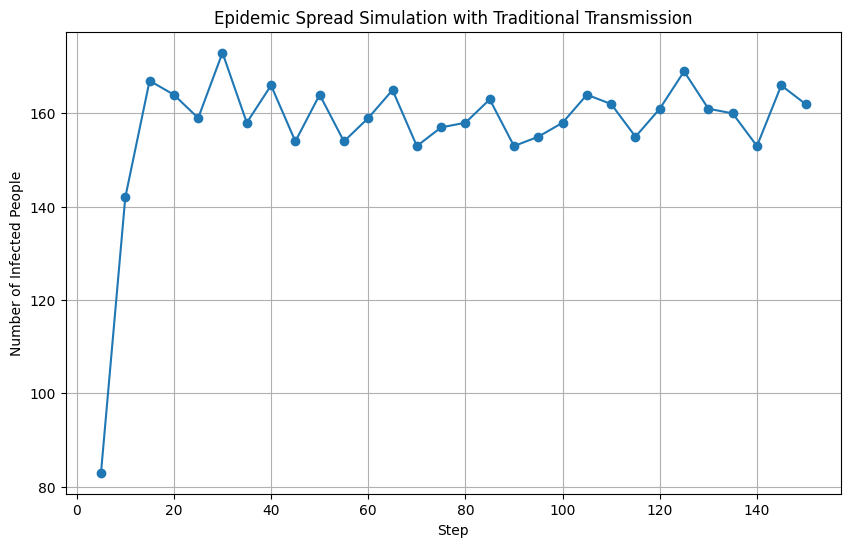

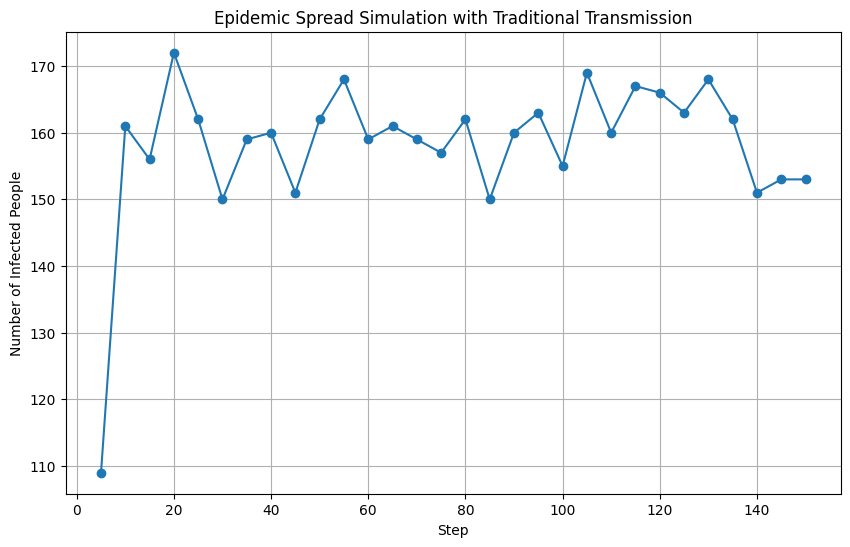

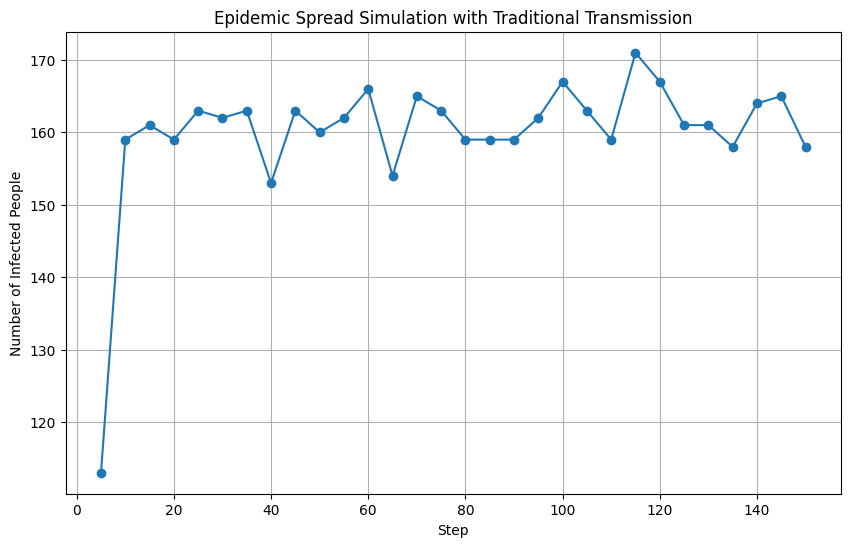

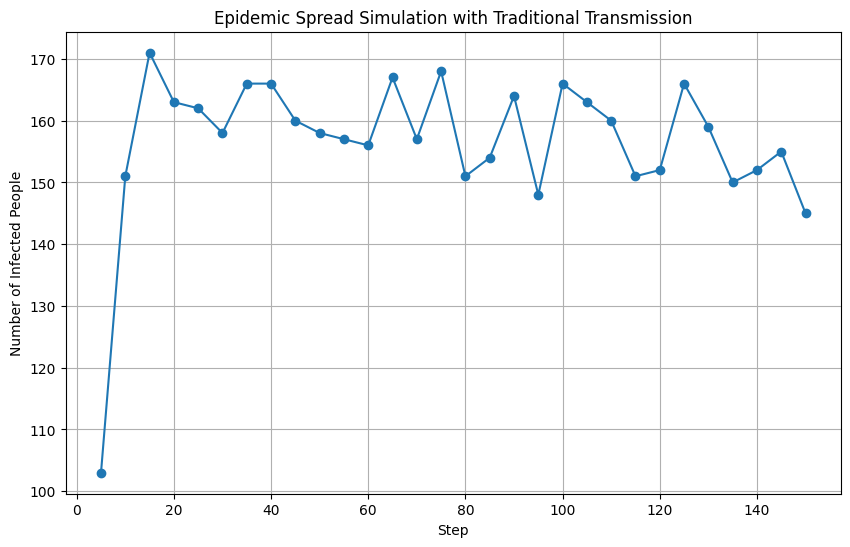

Simulating for Infection Rate=0.1, Recover Rate=0.08...


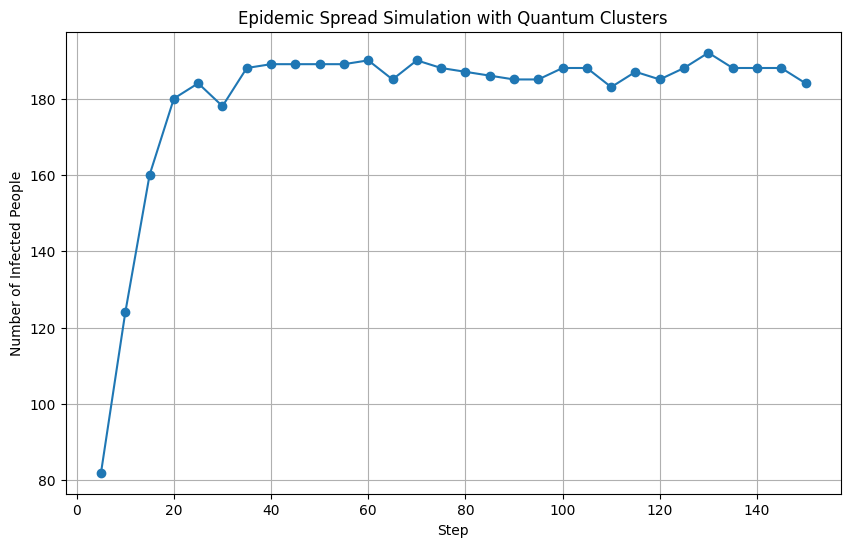

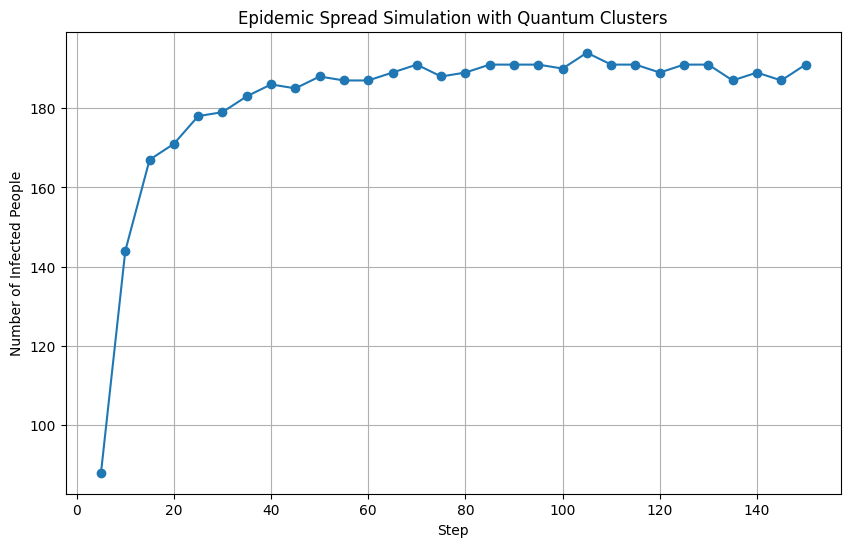

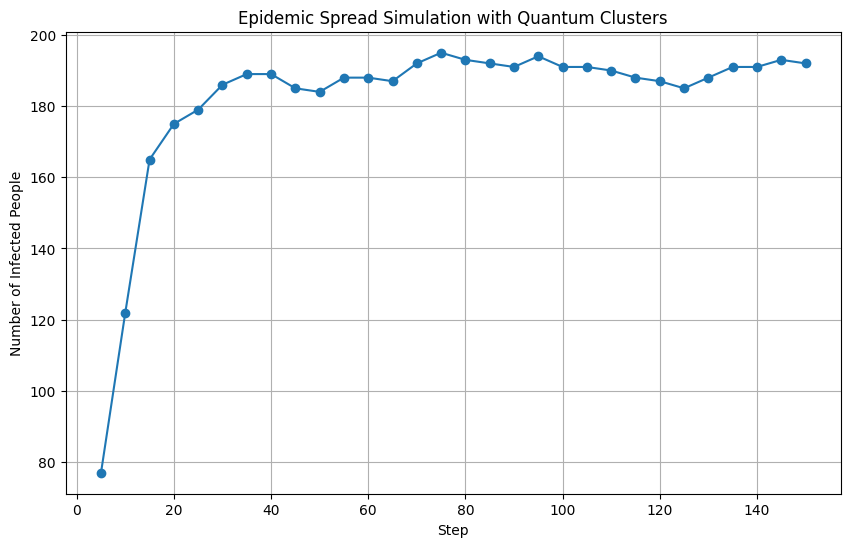

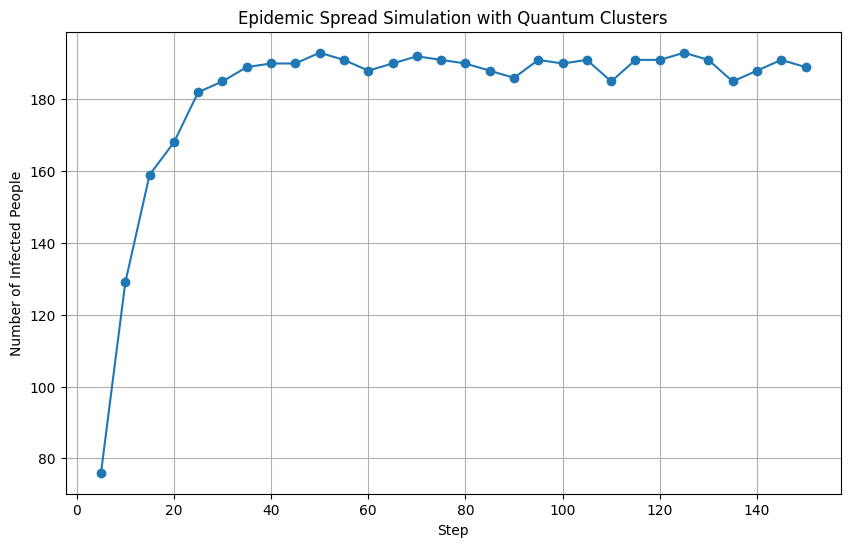

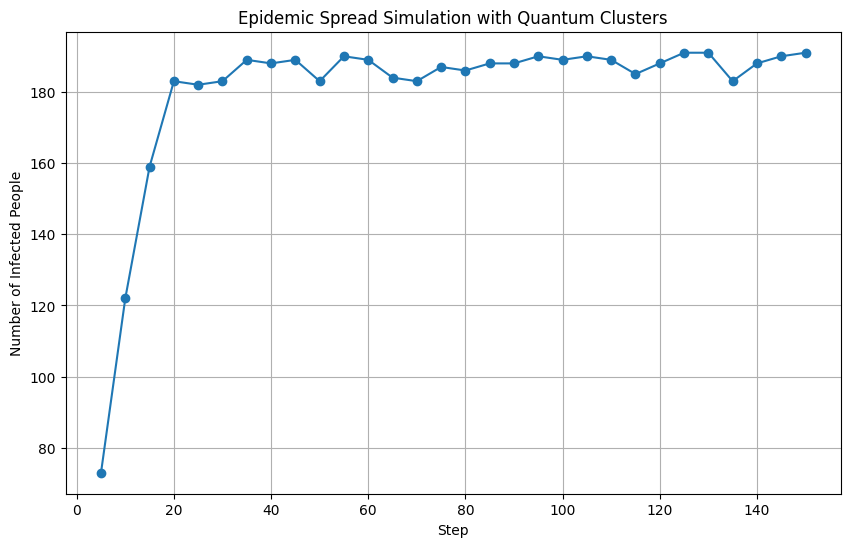

...

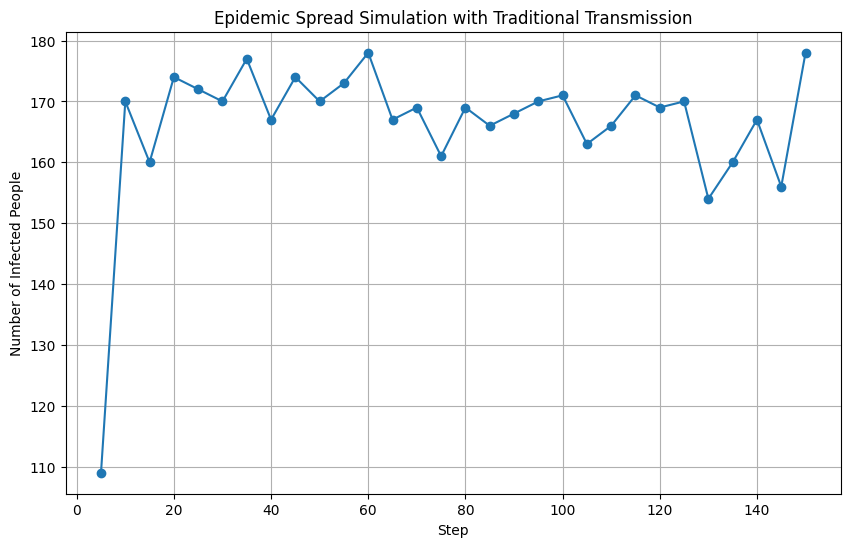

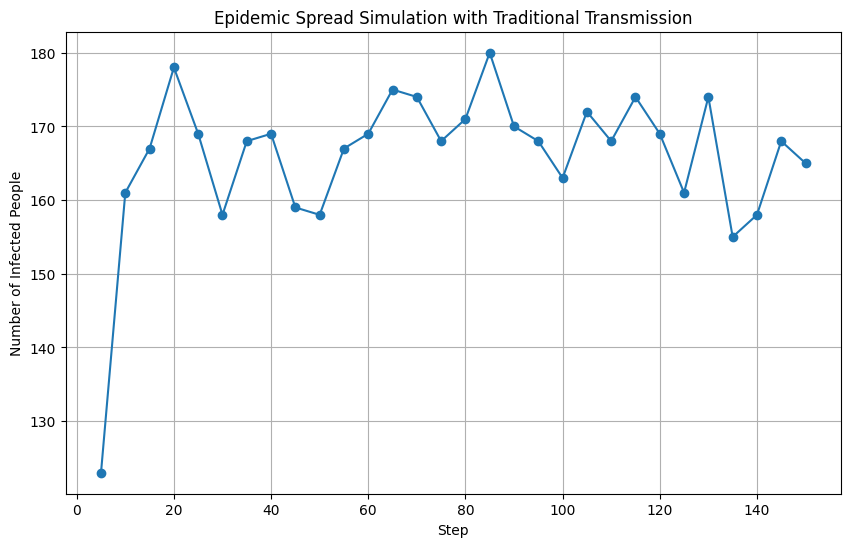

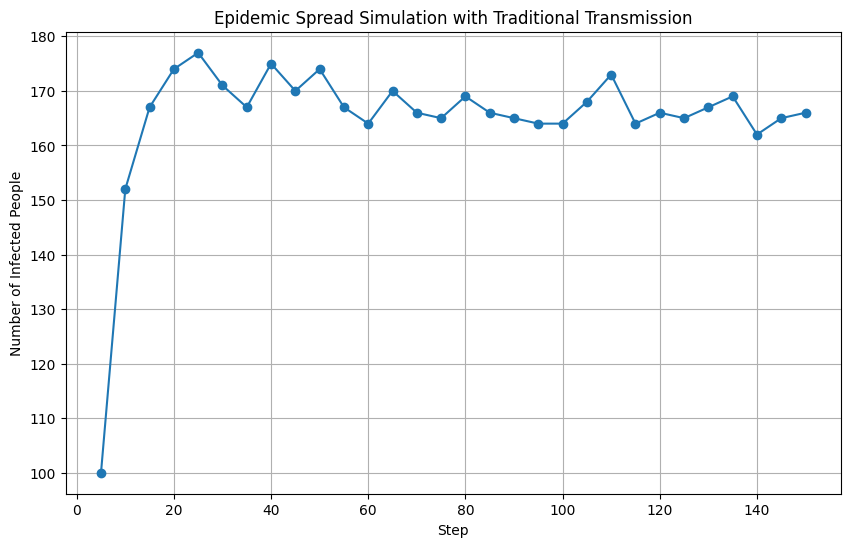

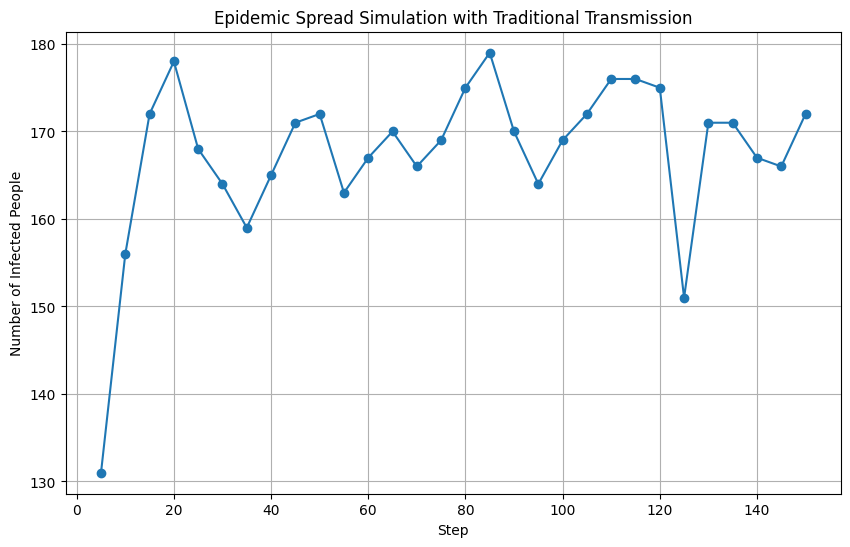

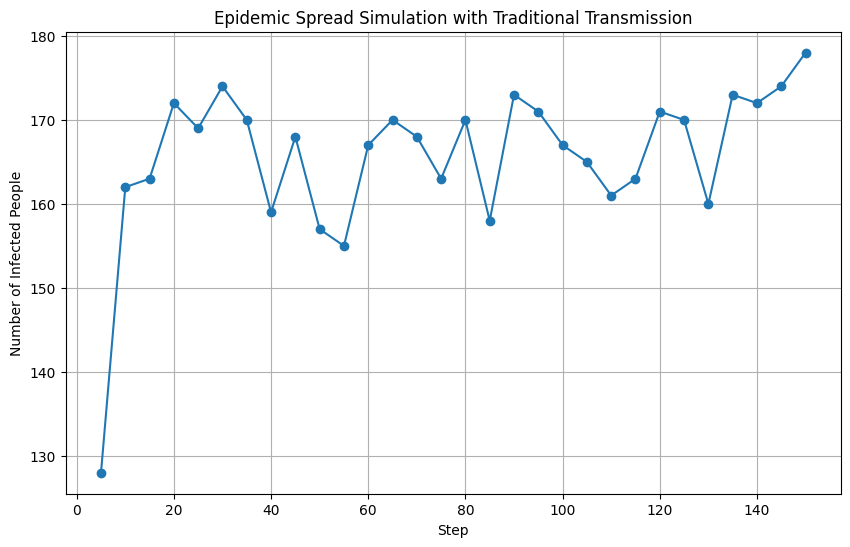

Simulating for Infection Rate=0.1, Recover Rate=0.06...


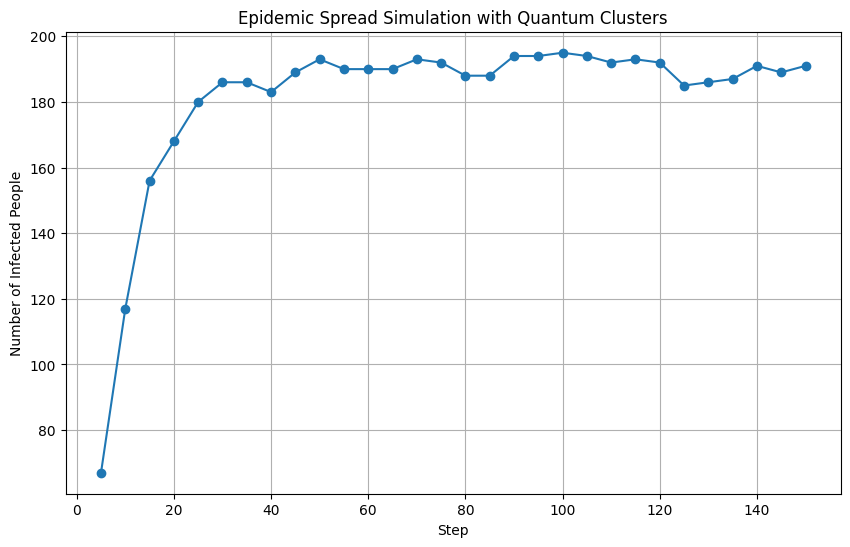

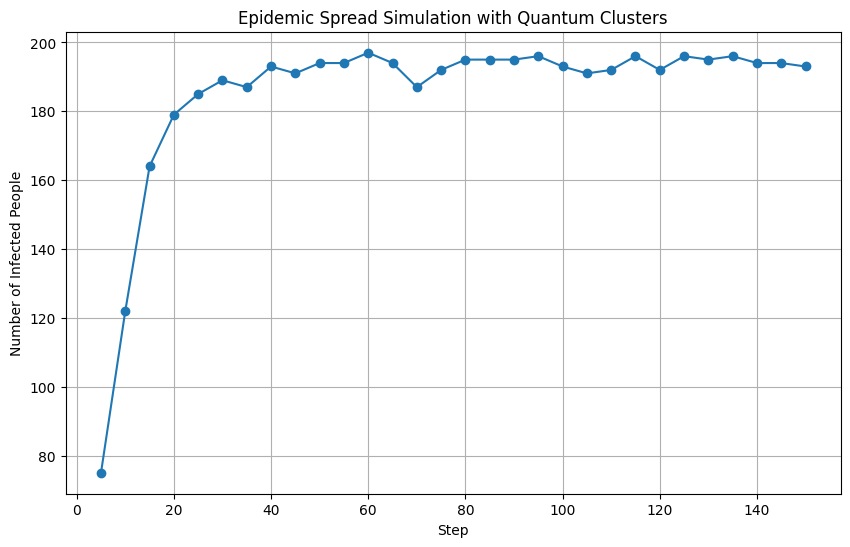

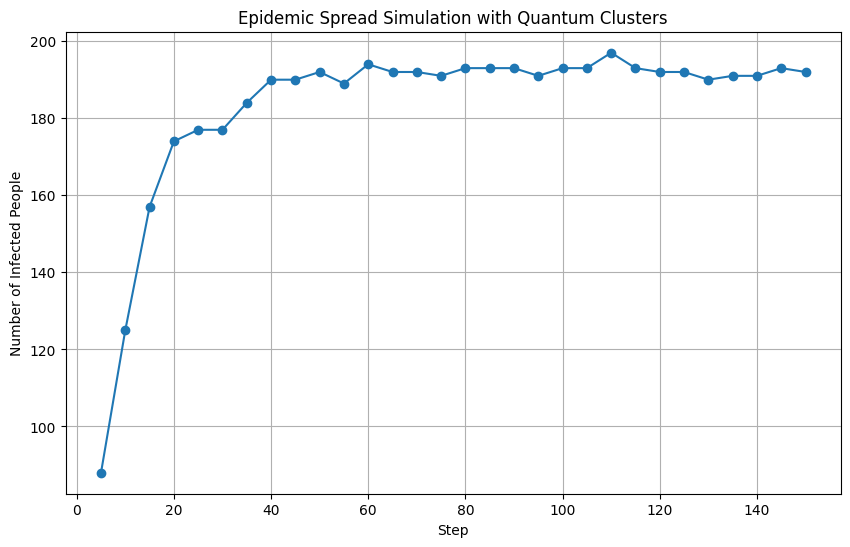

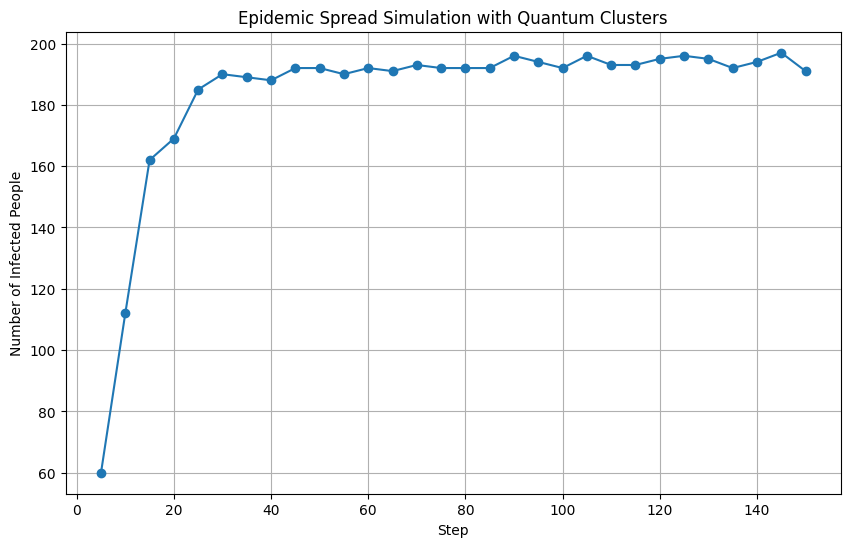

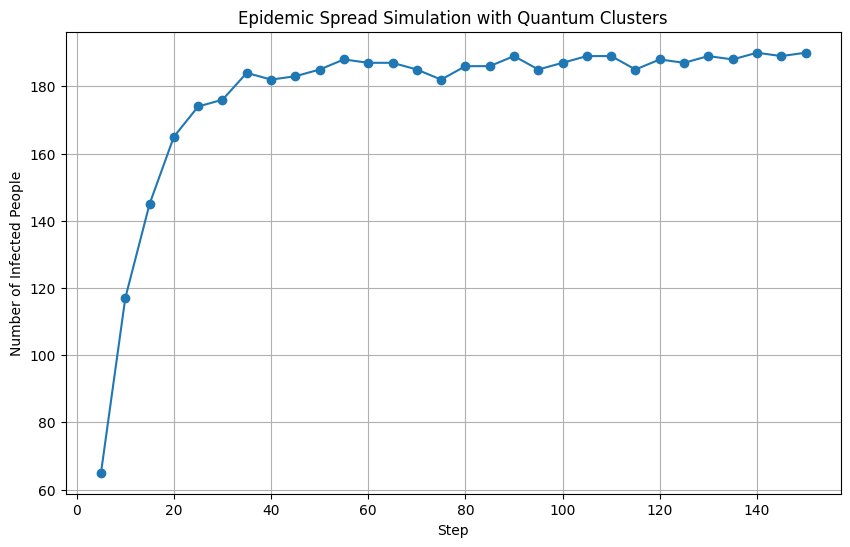

...

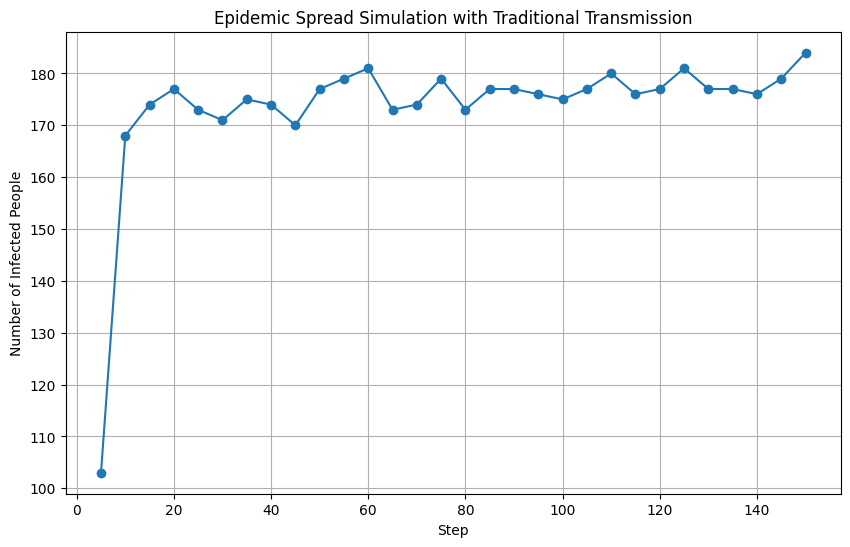

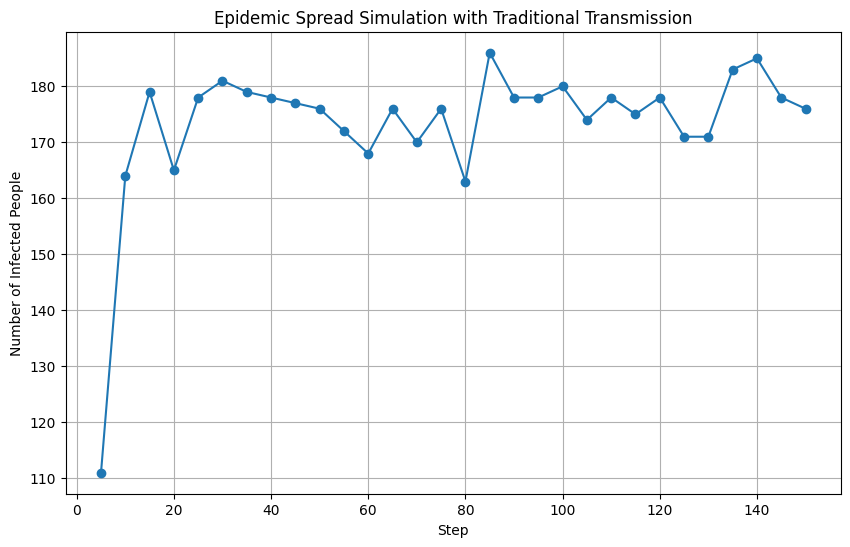

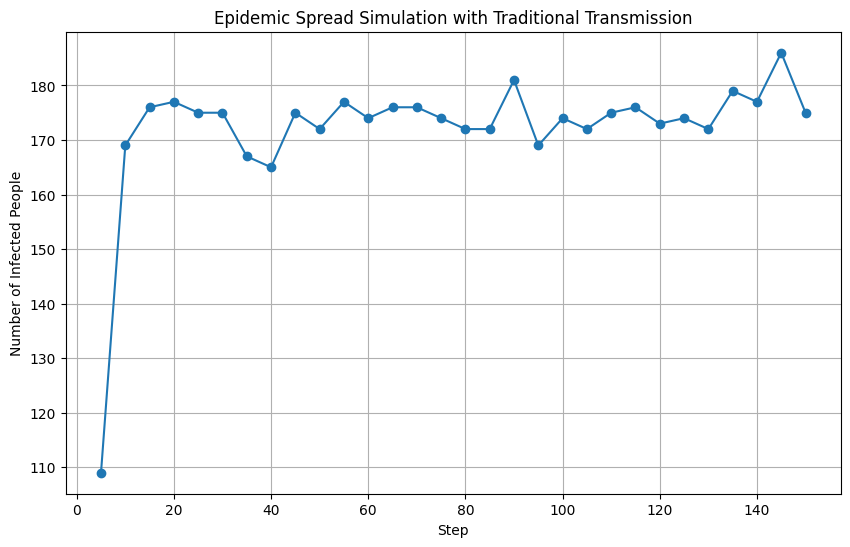

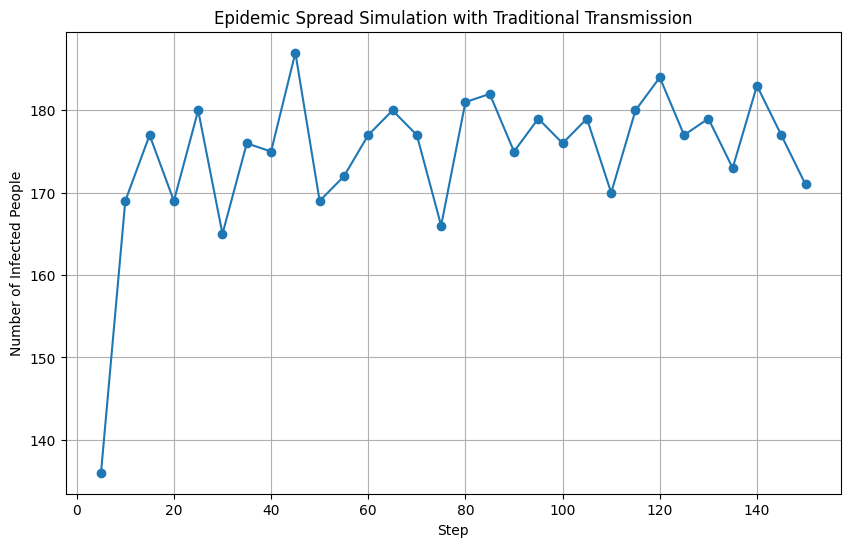

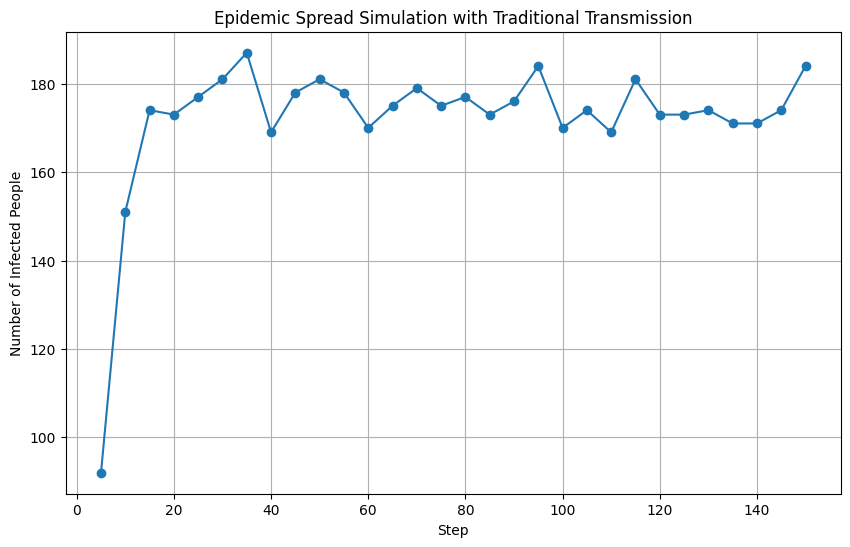

Simulating for Infection Rate=0.08, Recover Rate=0.1...


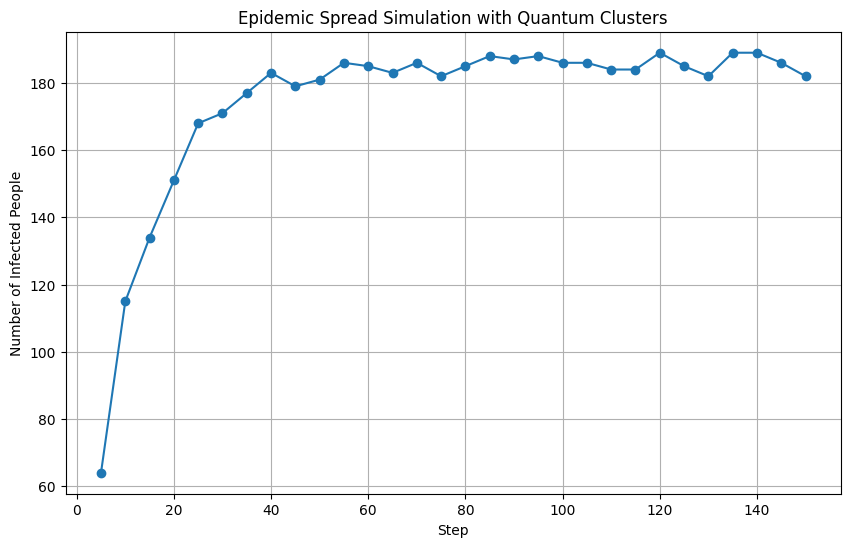

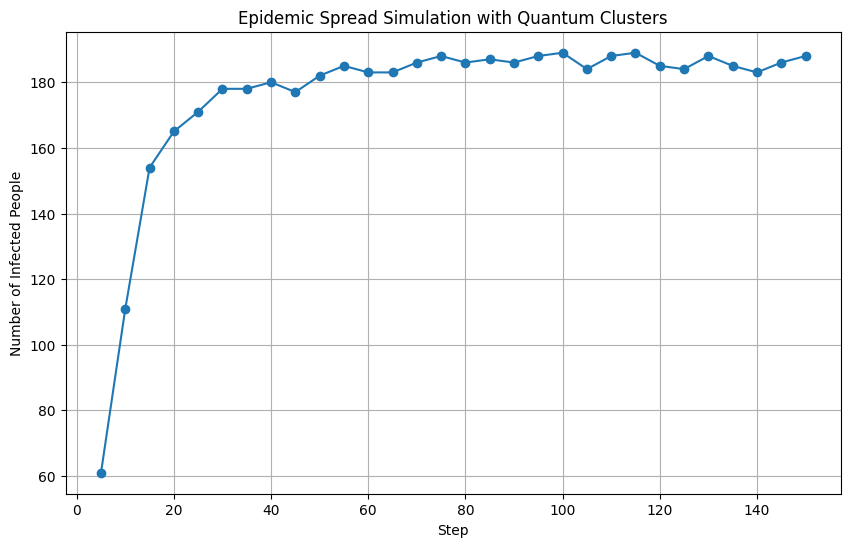

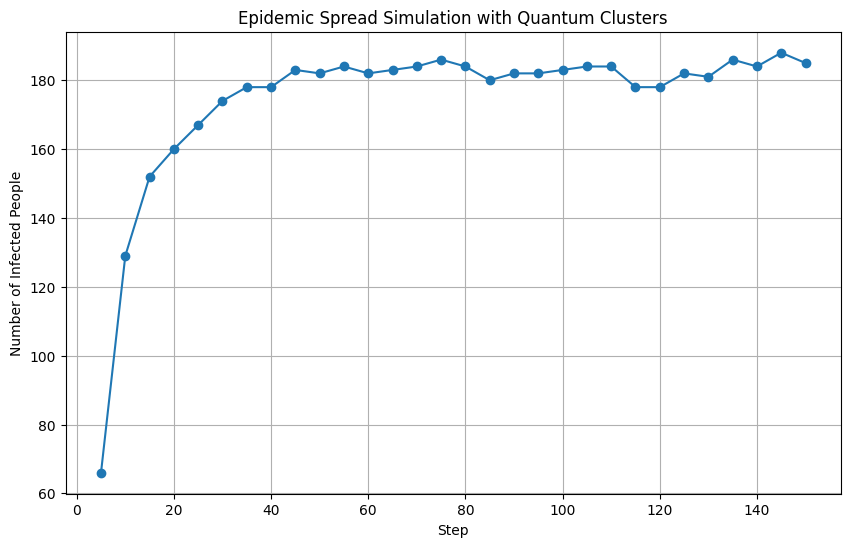

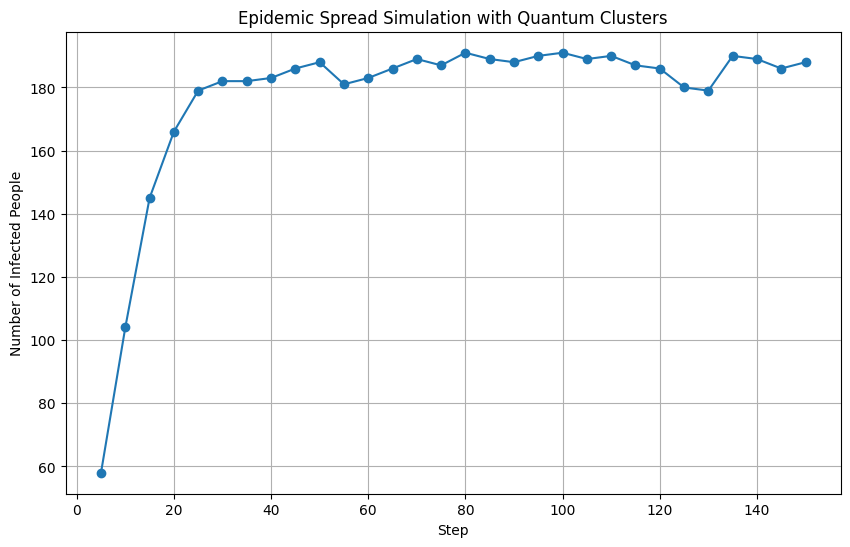

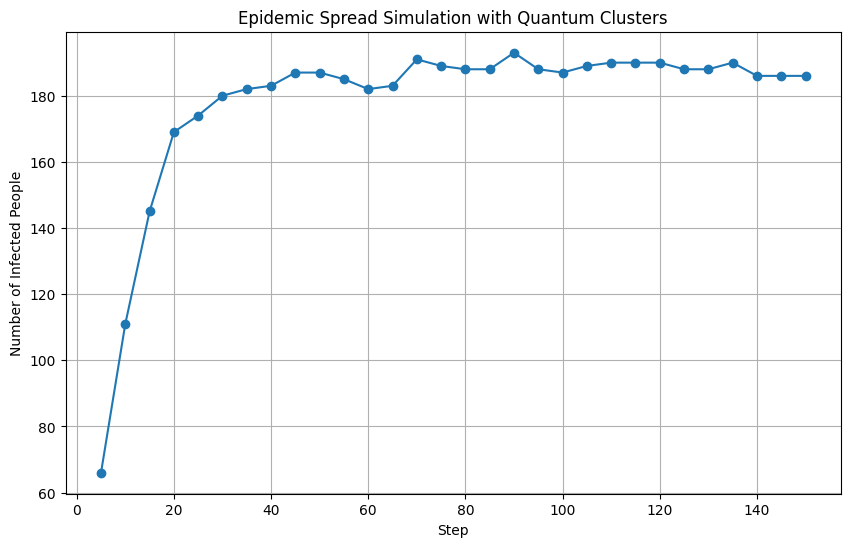

...

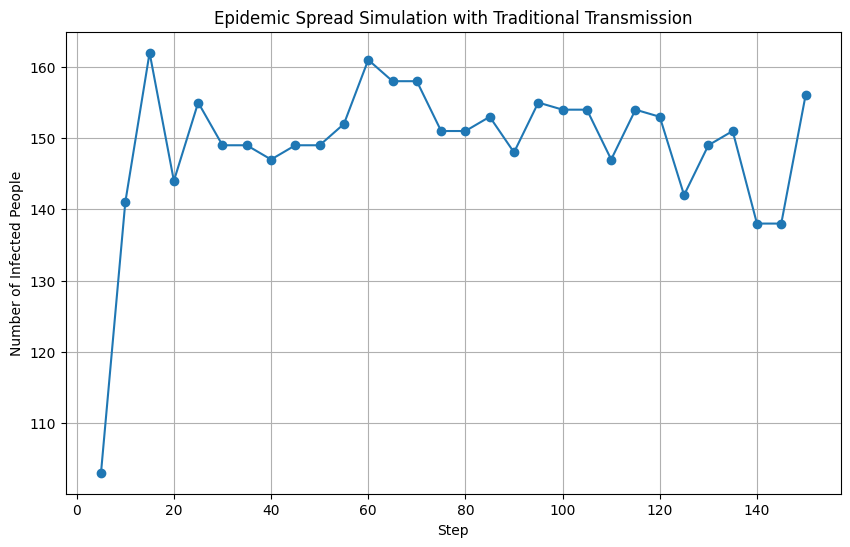

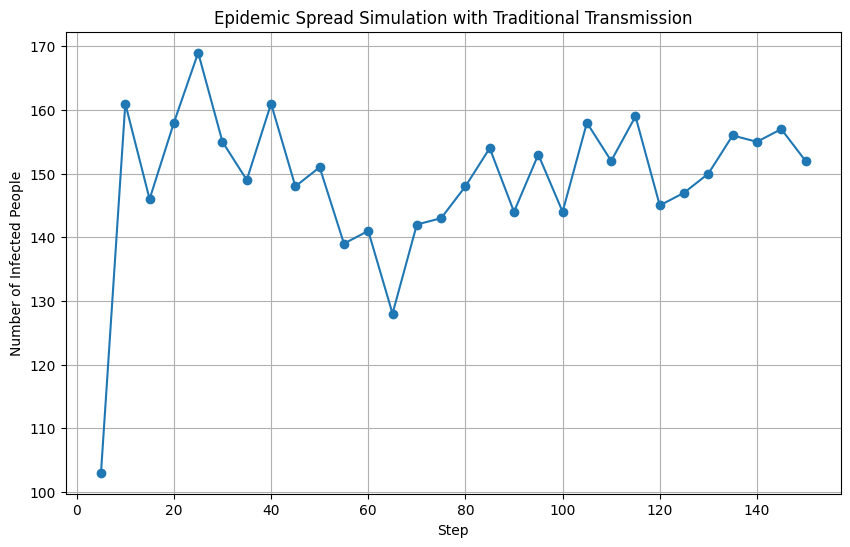

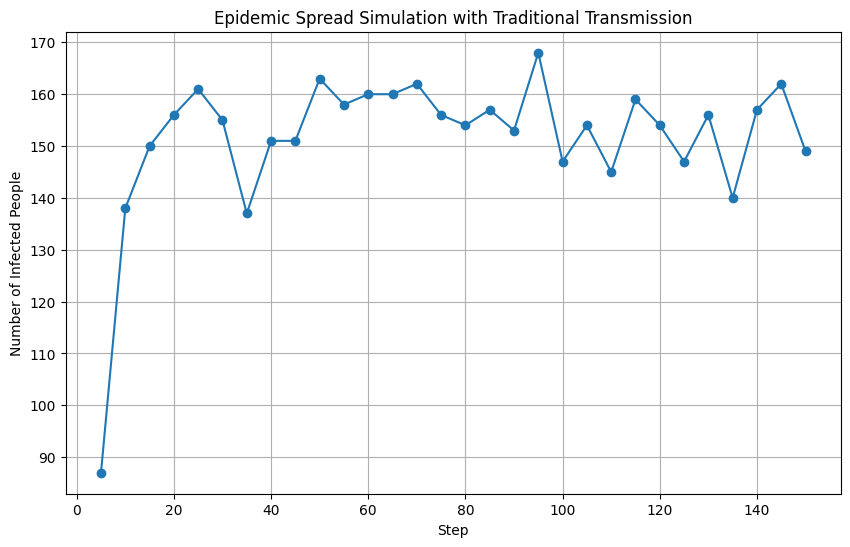

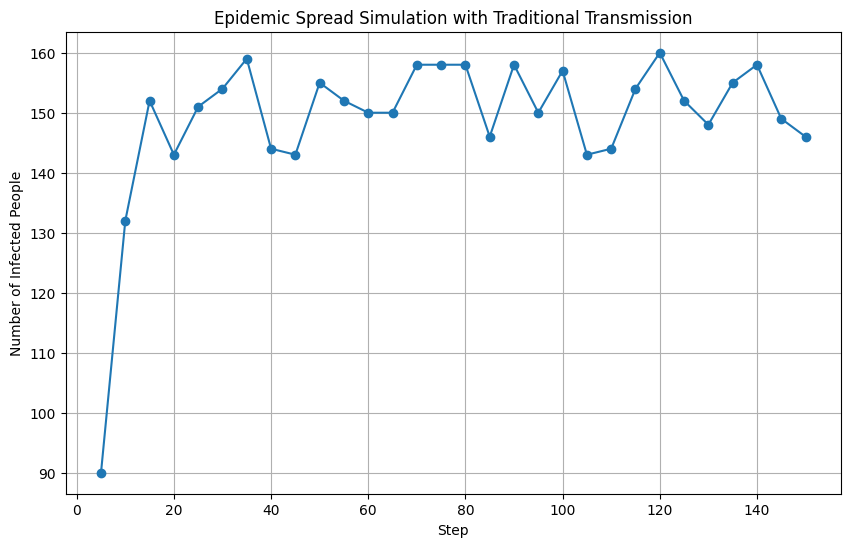

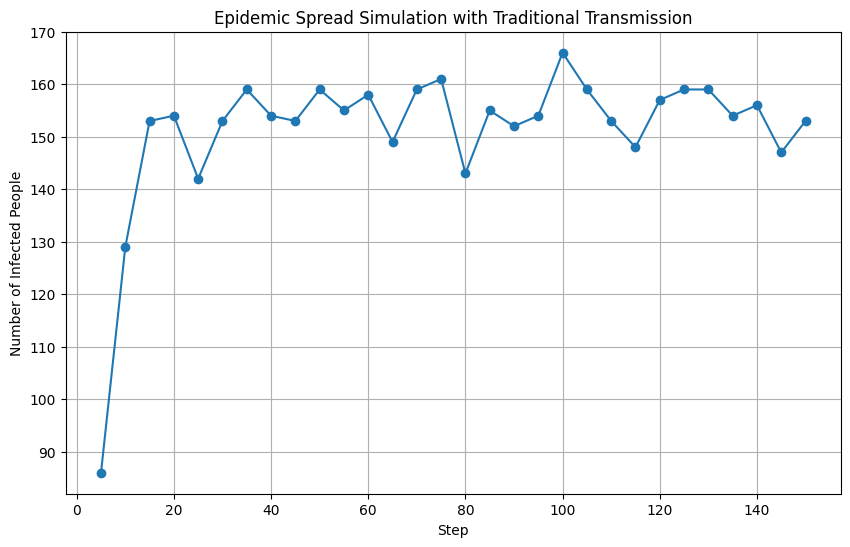

Simulating for Infection Rate=0.08, Recover Rate=0.08...


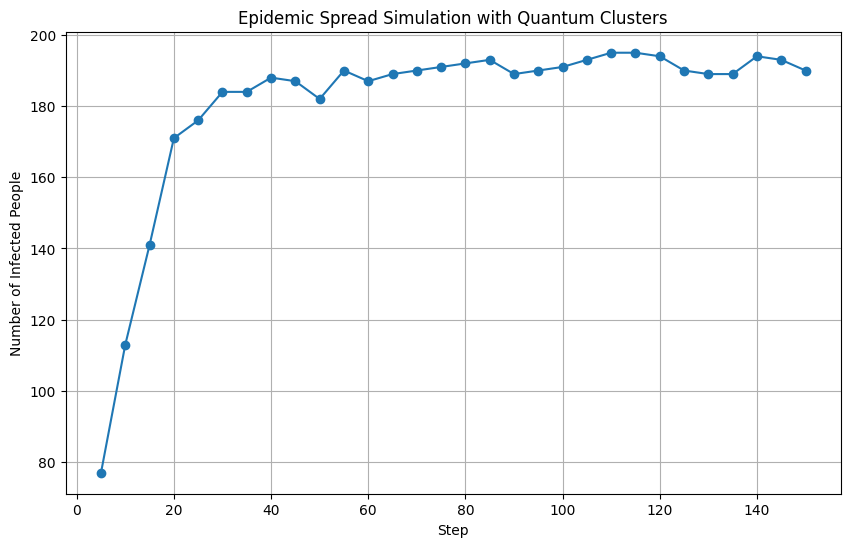

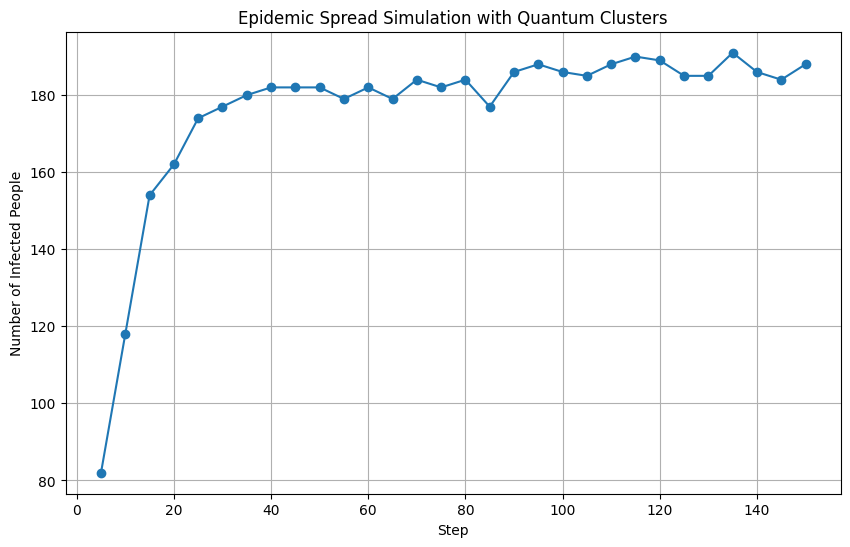

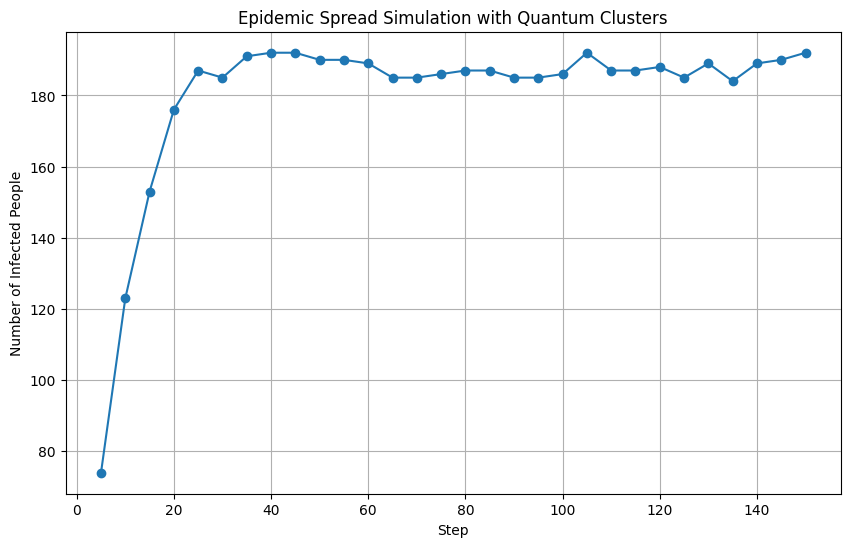

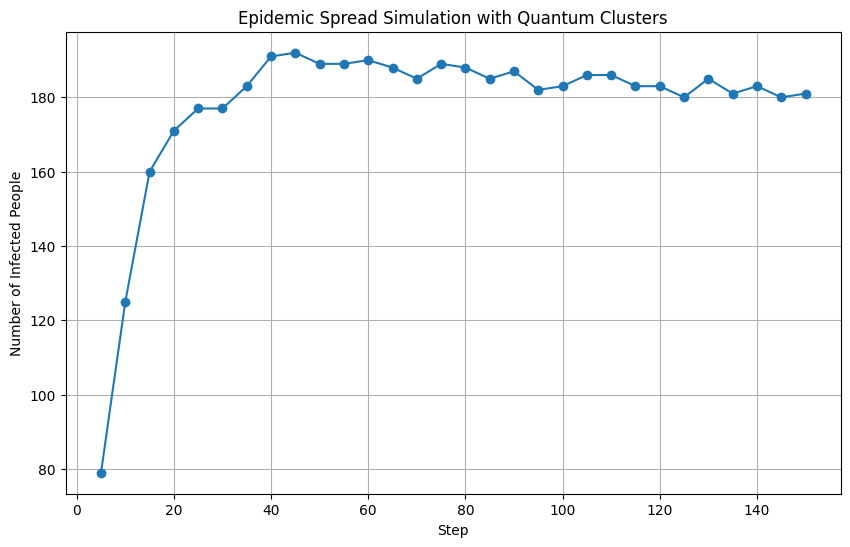

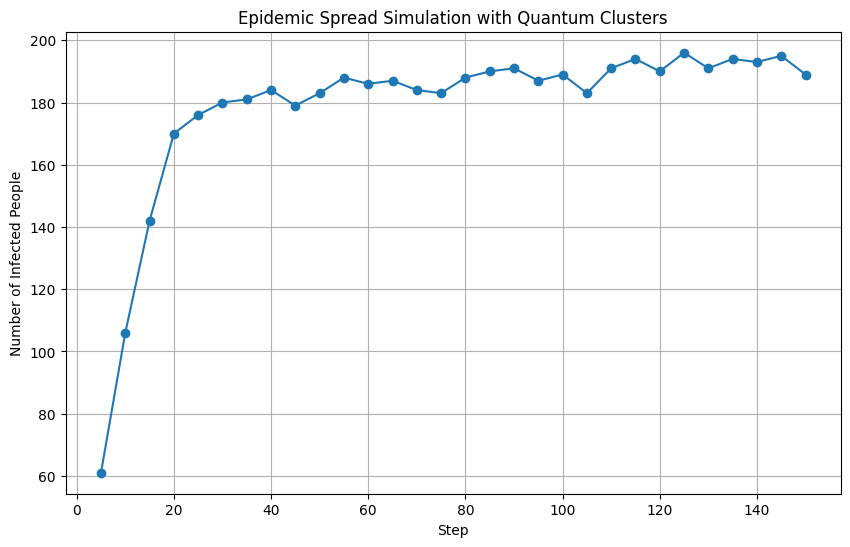

...

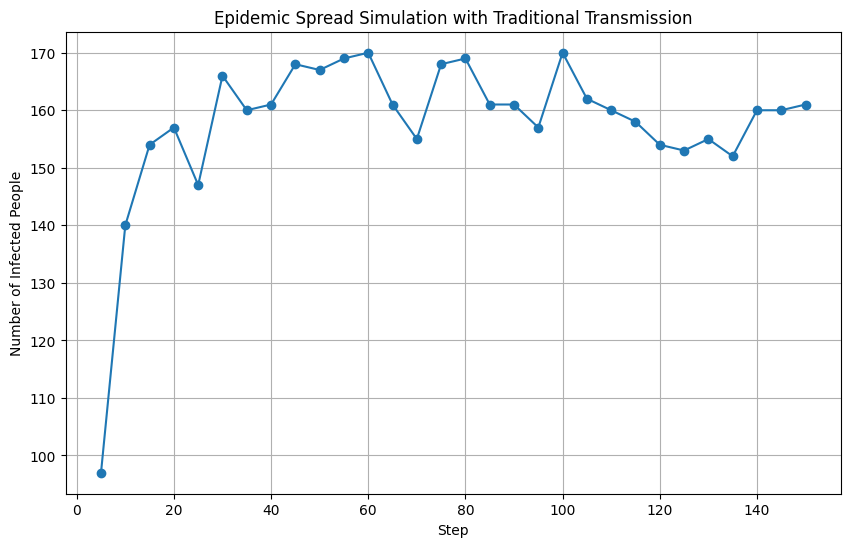

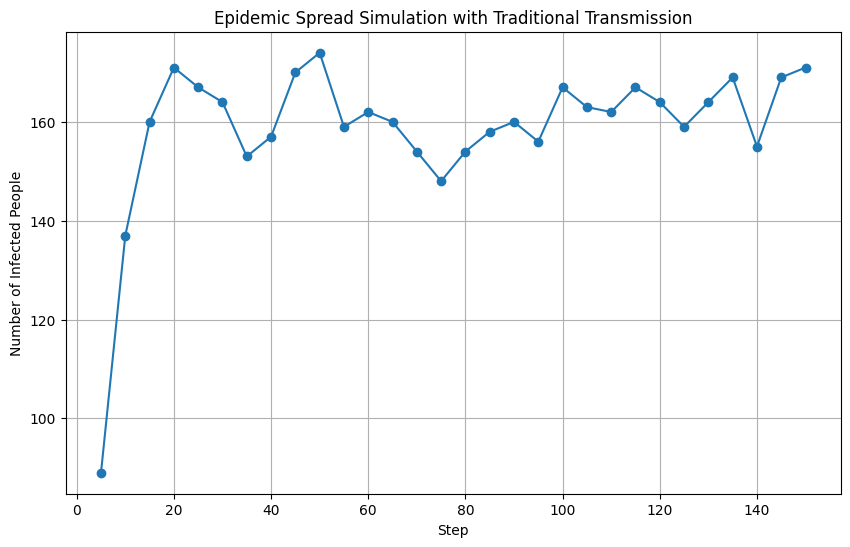

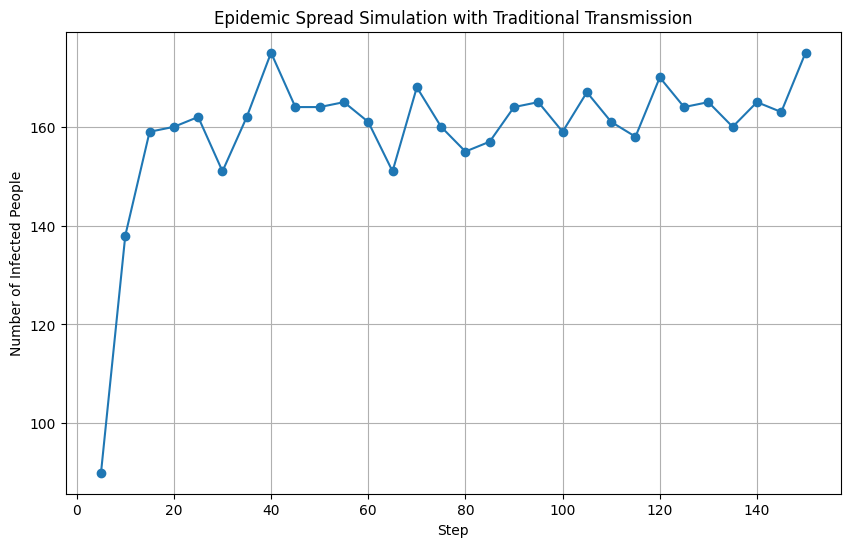

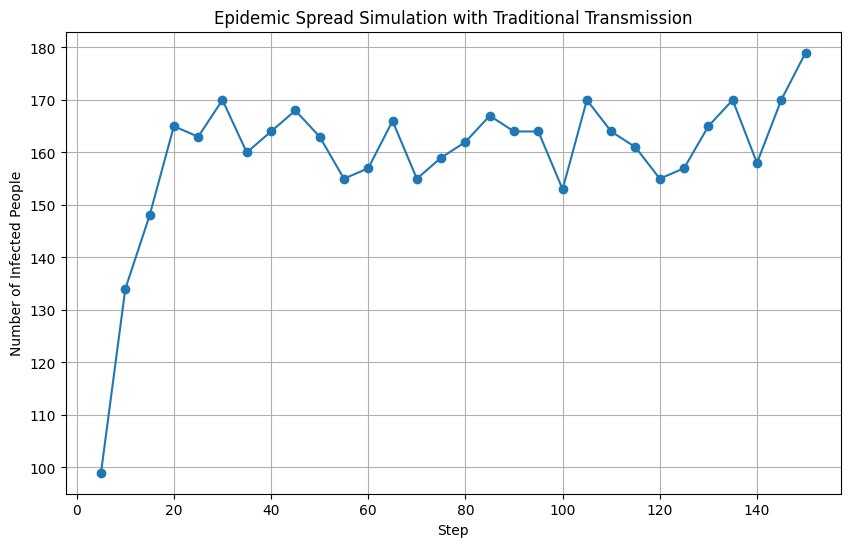

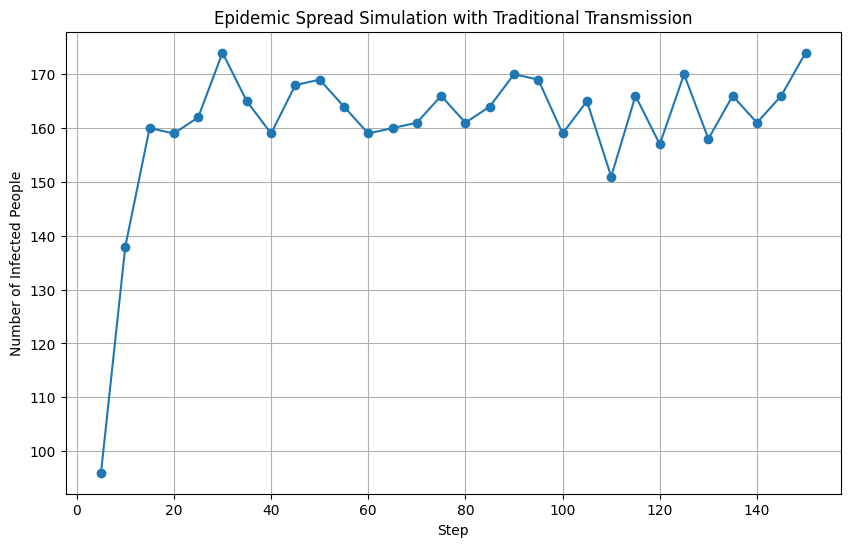

Simulating for Infection Rate=0.08, Recover Rate=0.06...


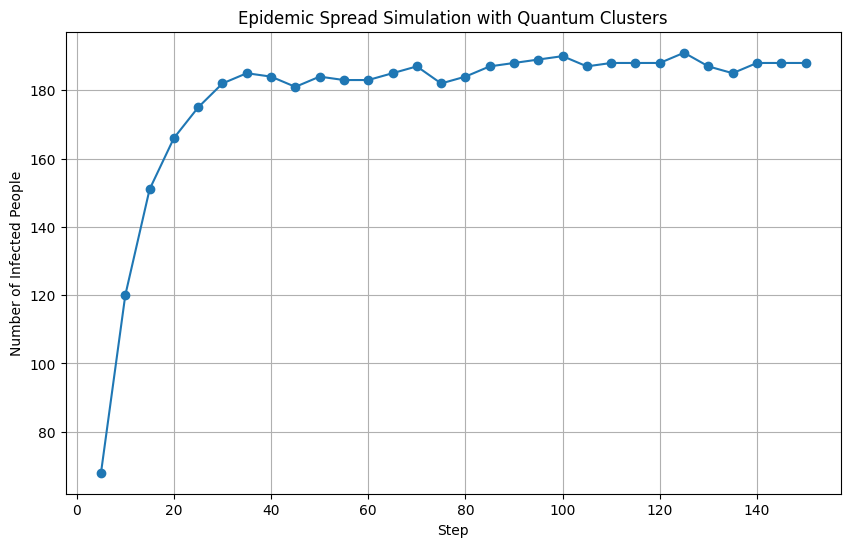

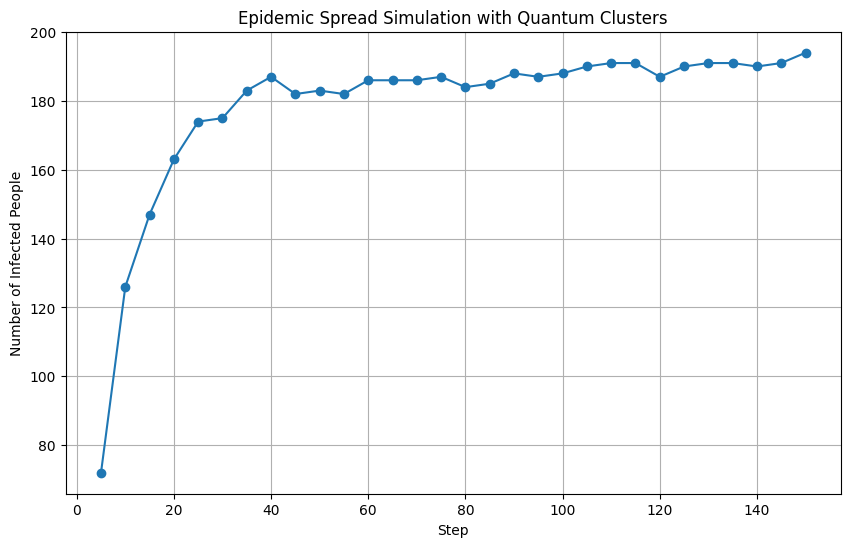

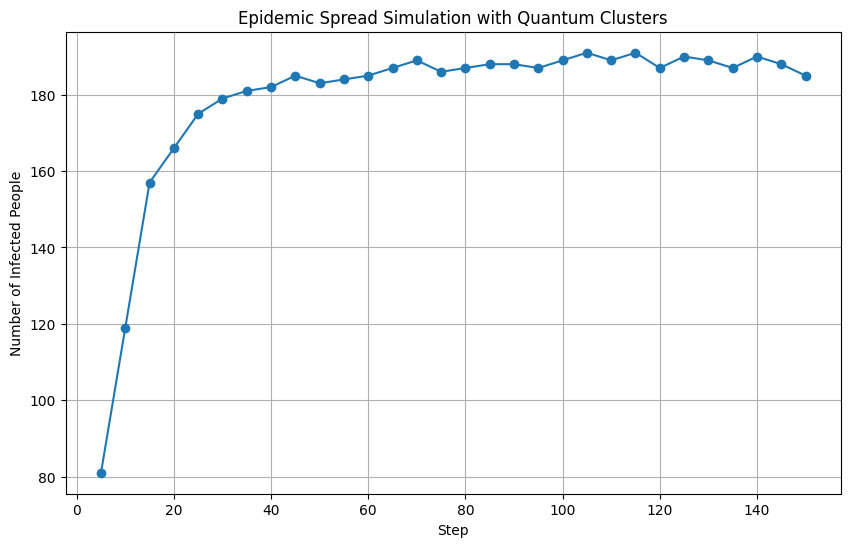

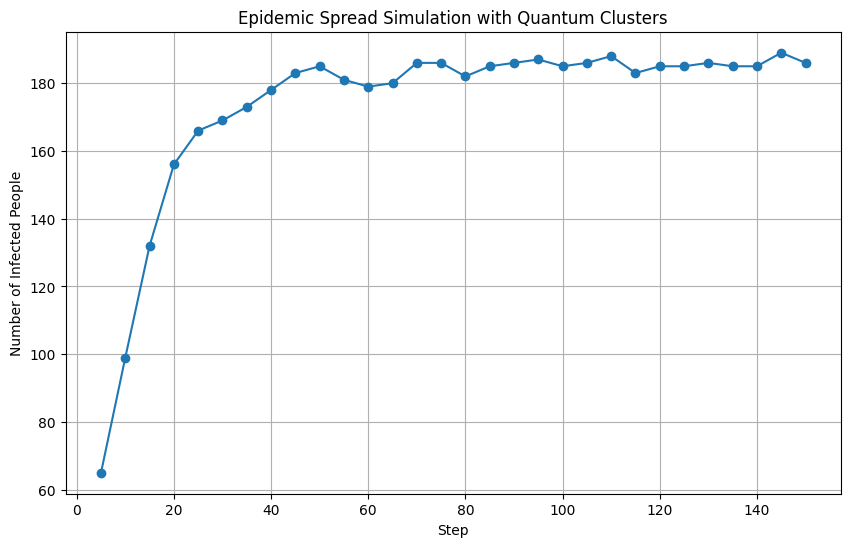

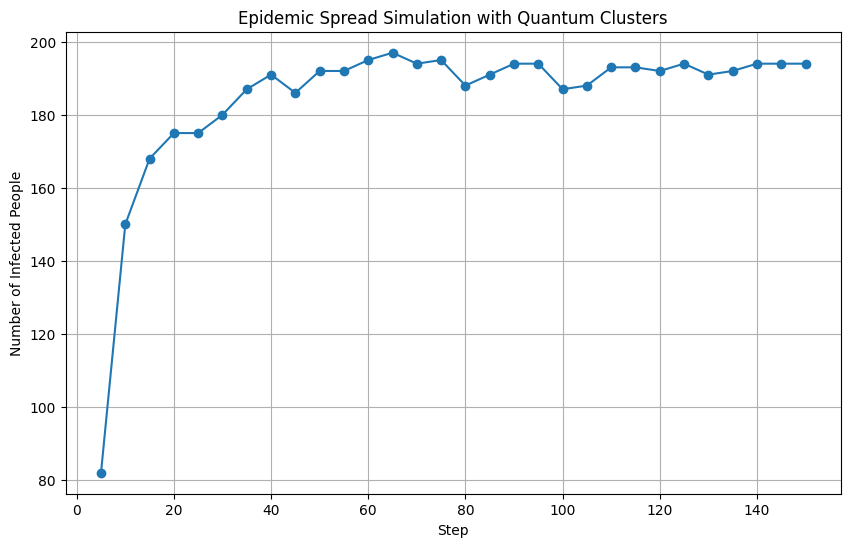

...

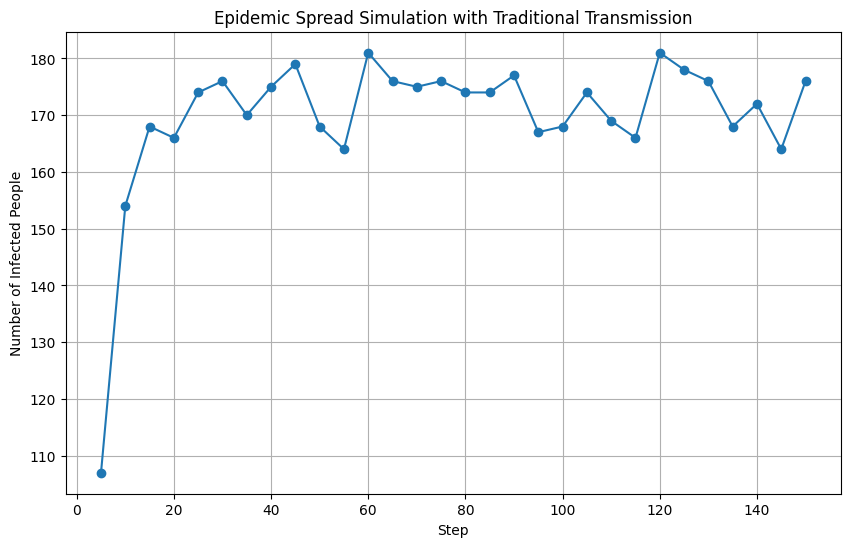

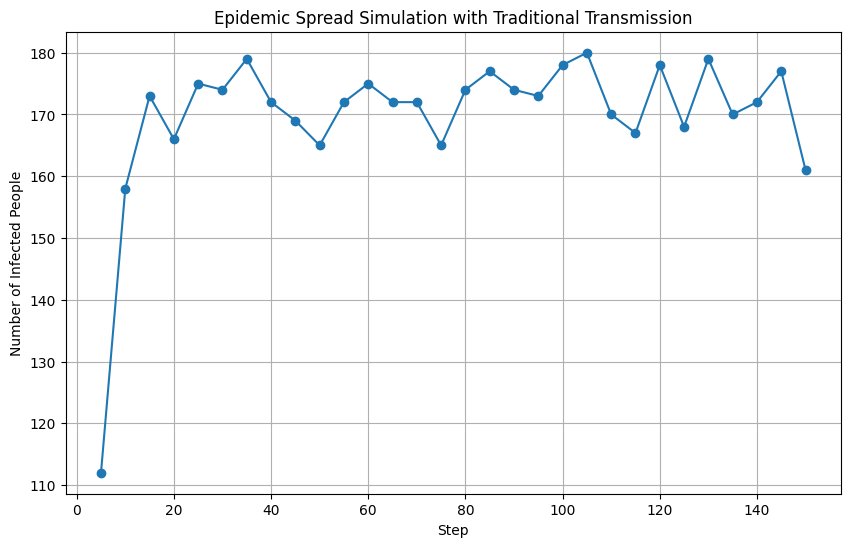

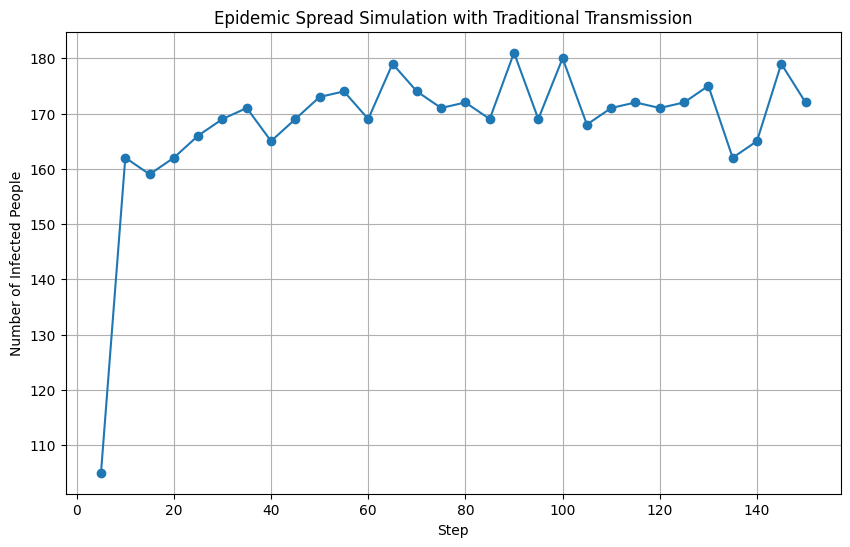

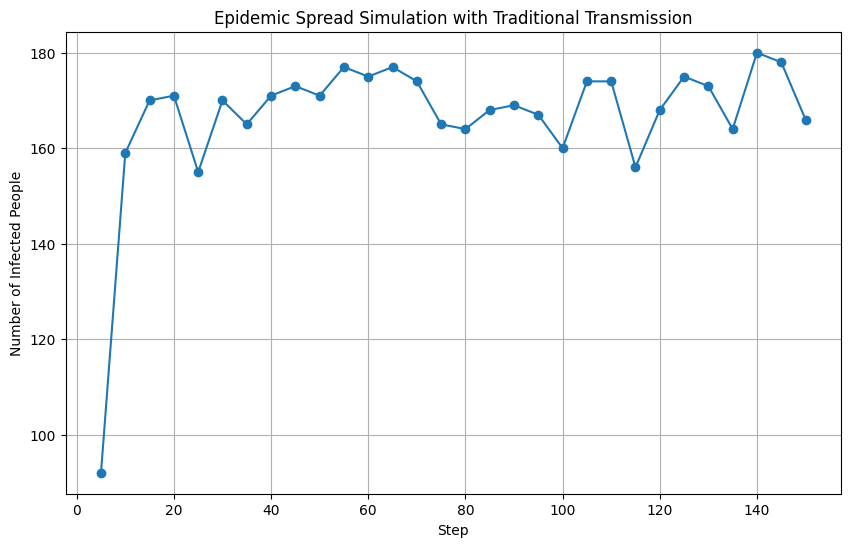

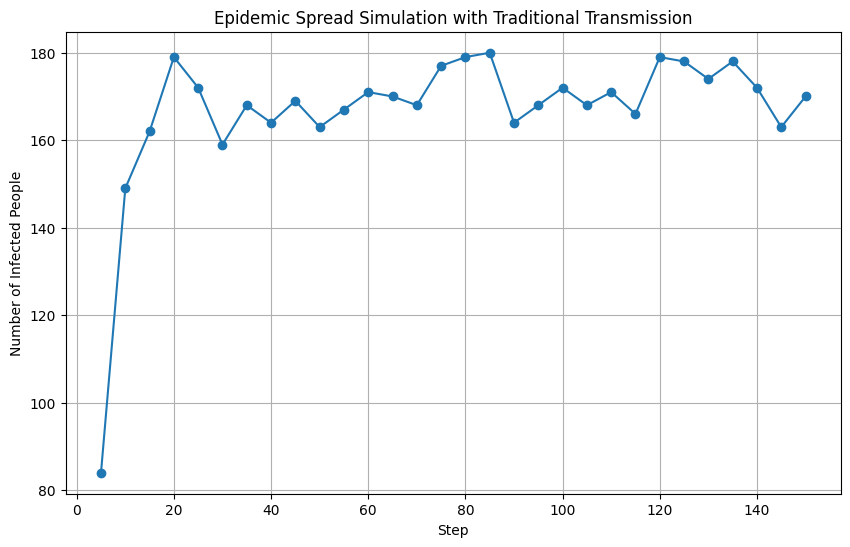

Simulating for Infection Rate=0.06, Recover Rate=0.1...


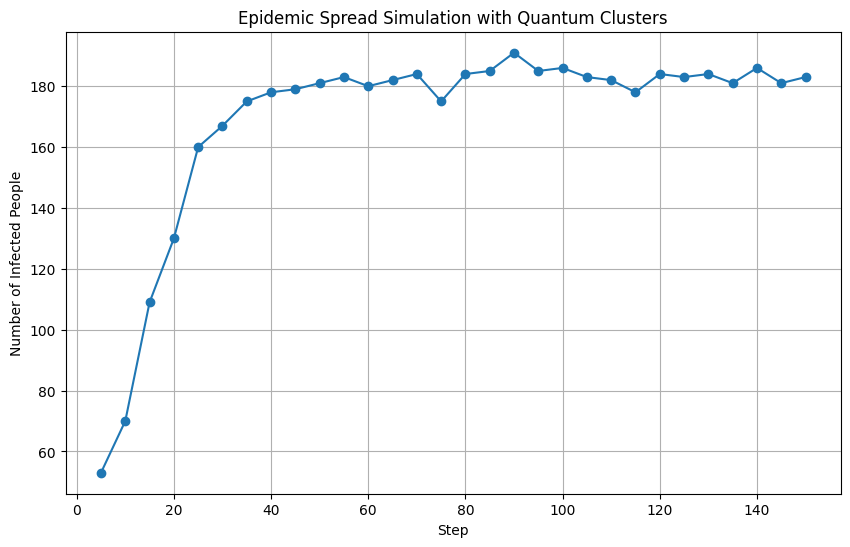

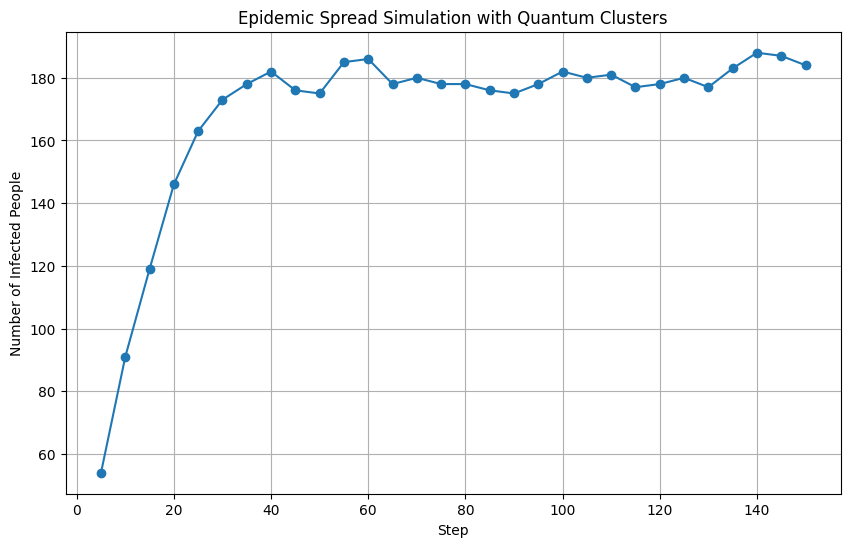

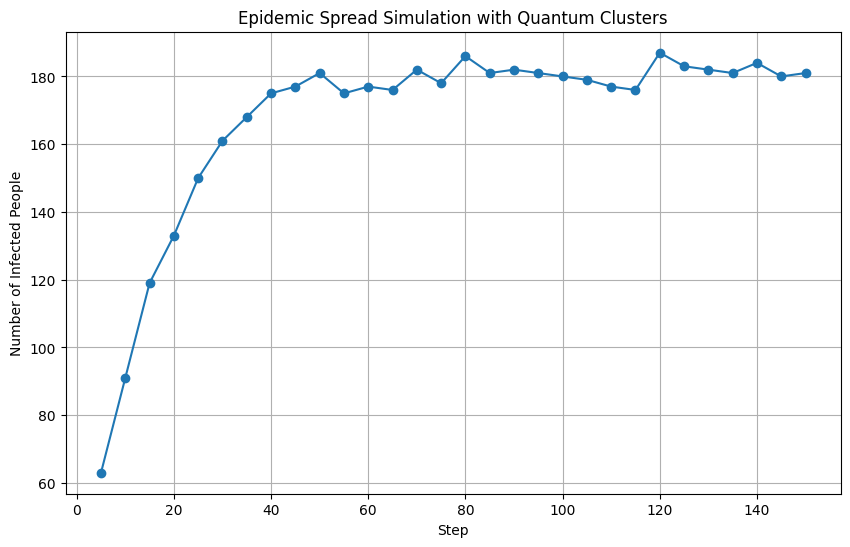

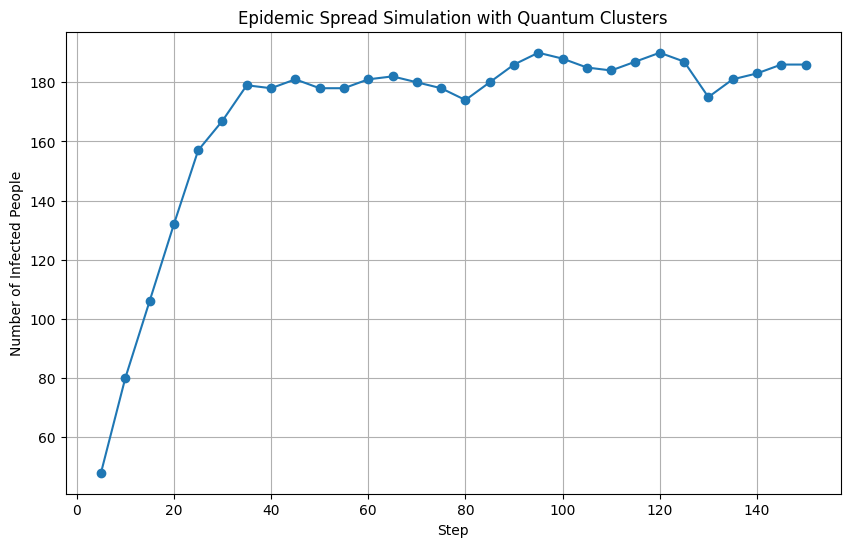

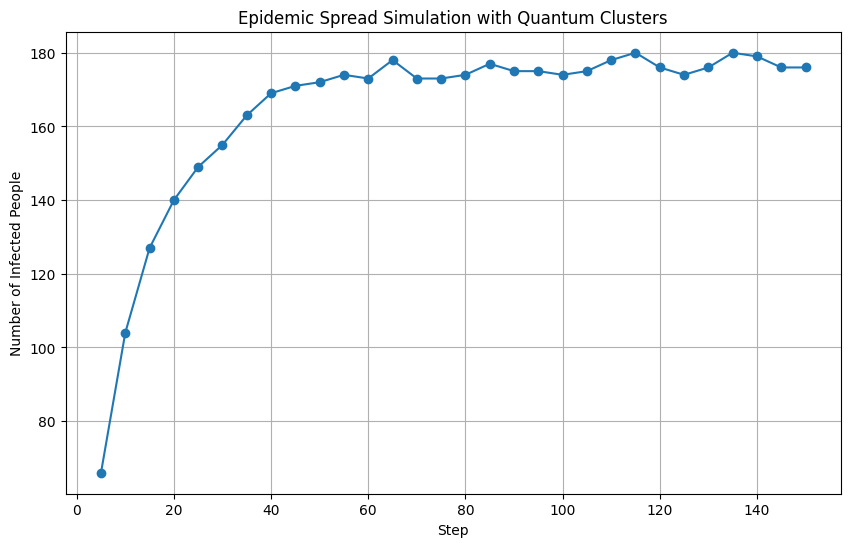

...

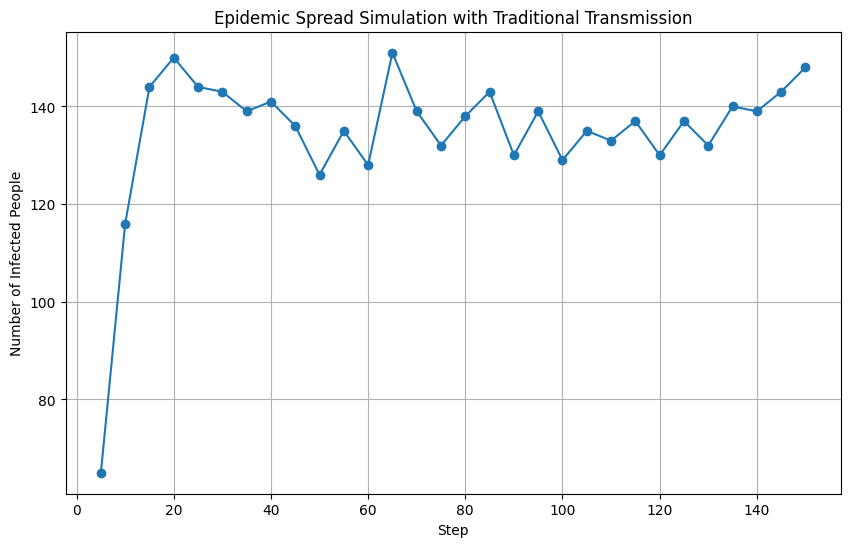

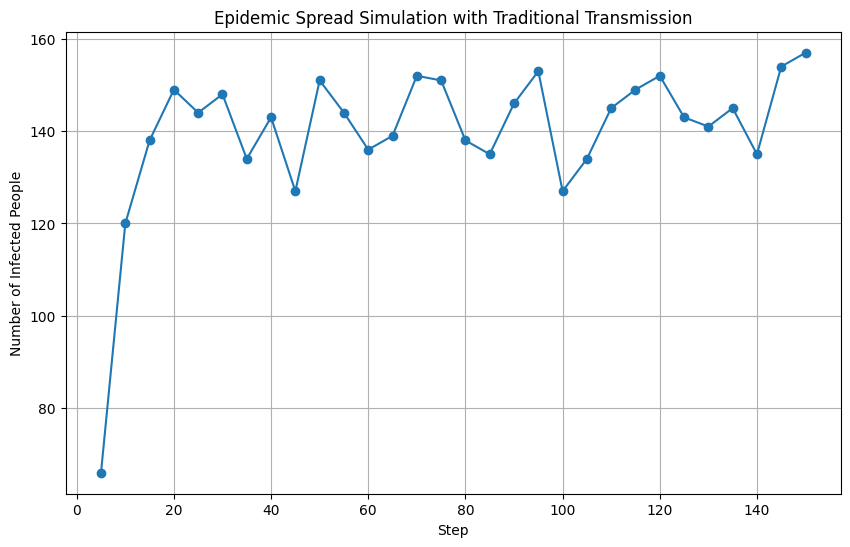

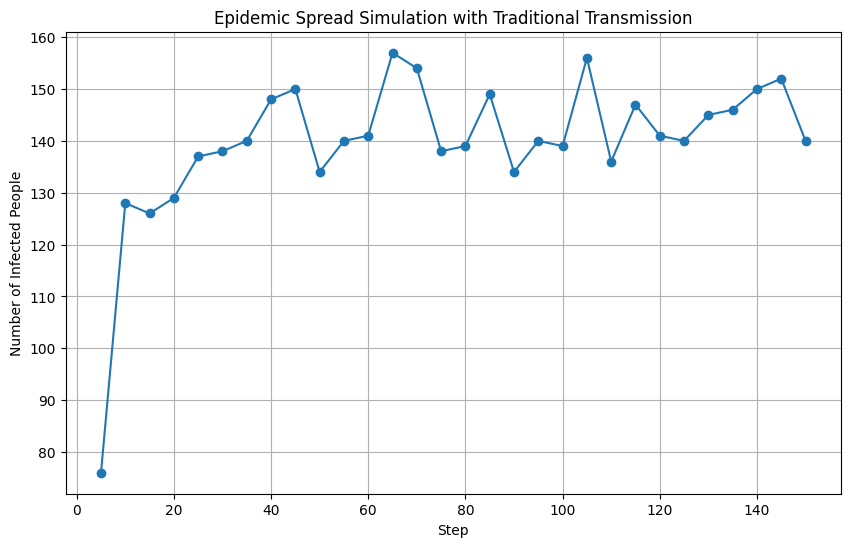

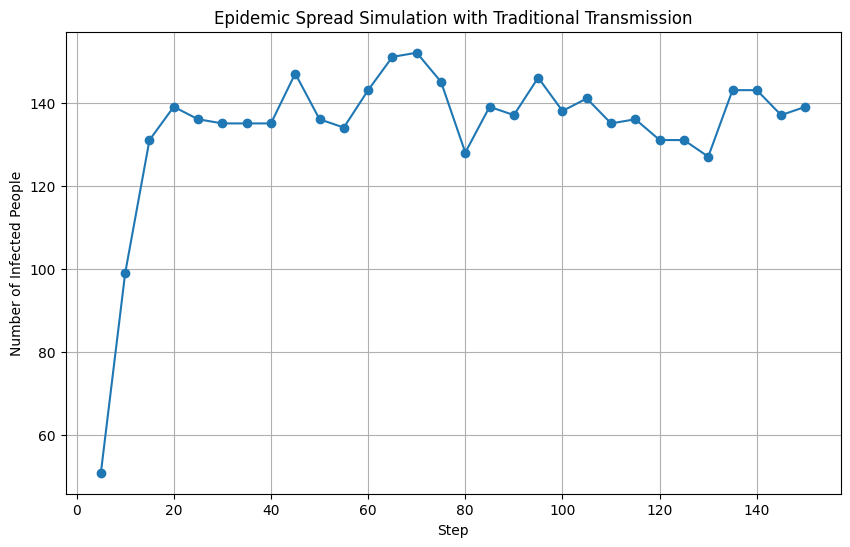

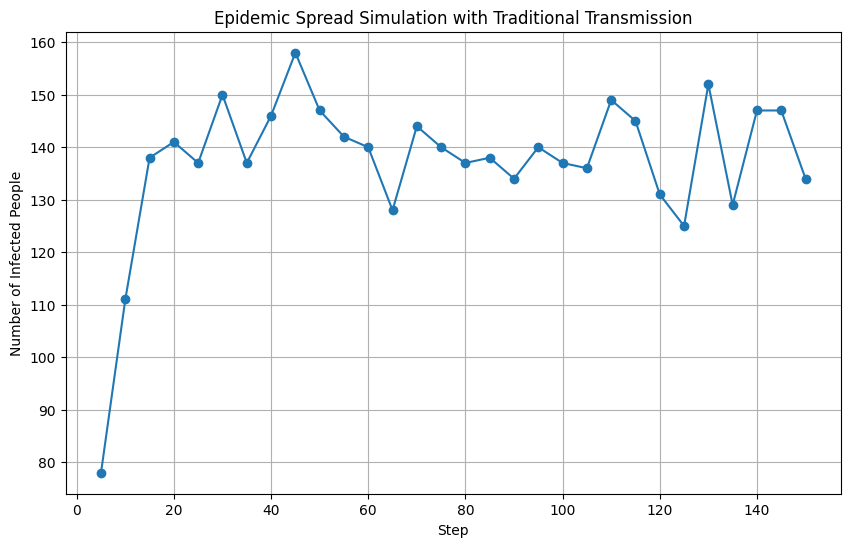

Simulating for Infection Rate=0.06, Recover Rate=0.08...


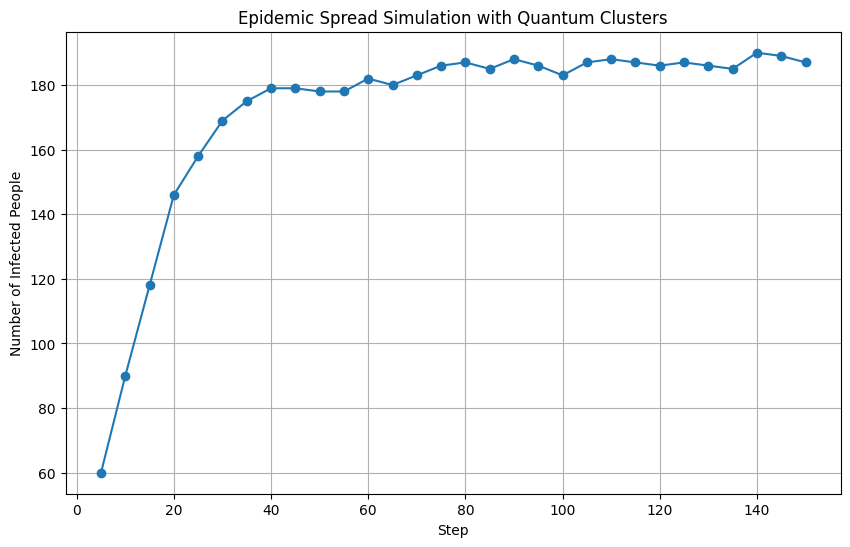

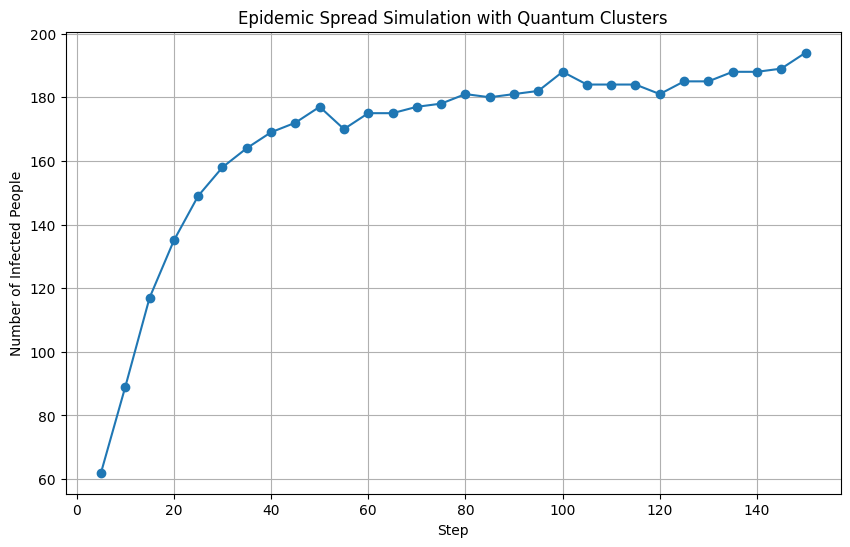

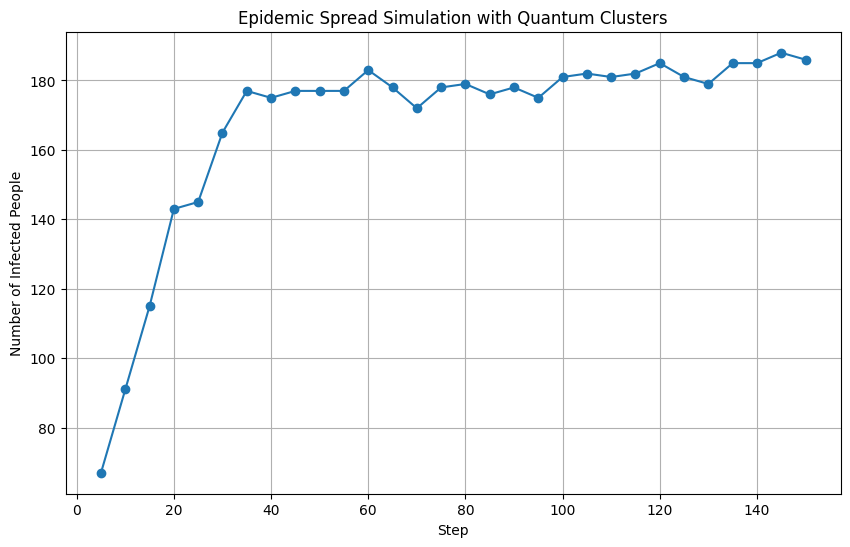

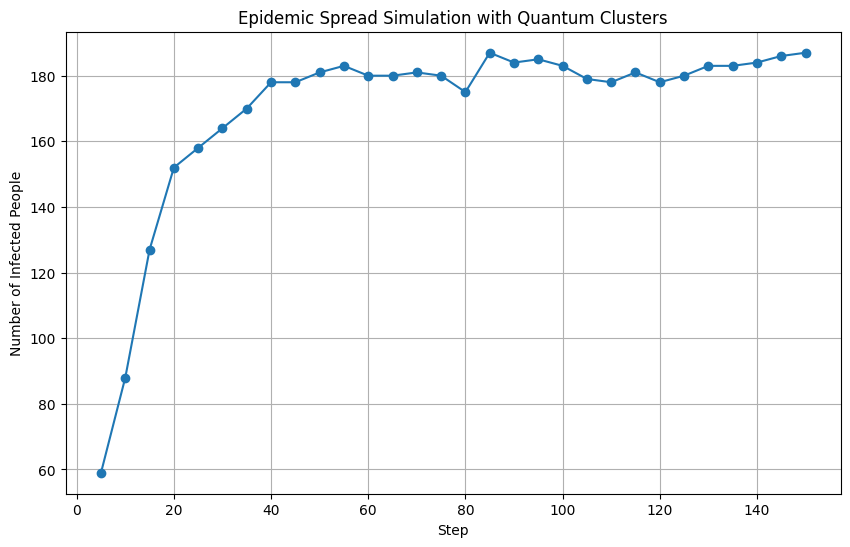

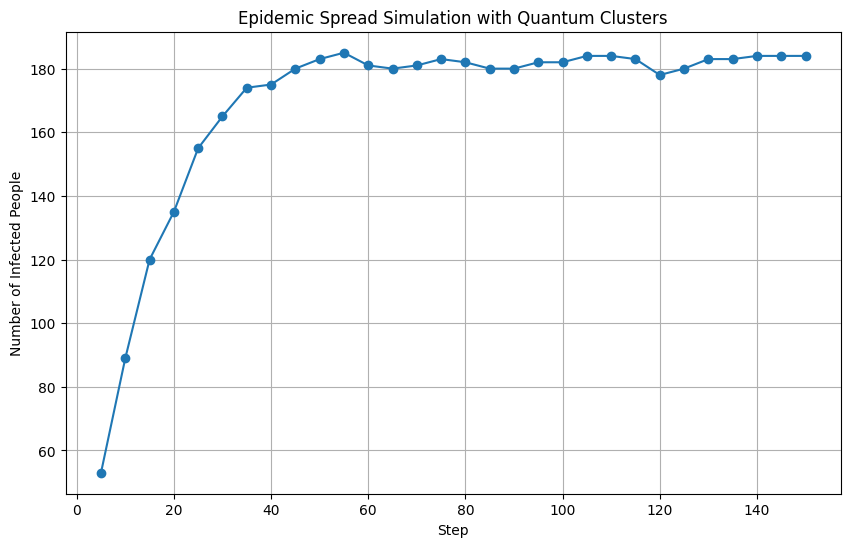

...

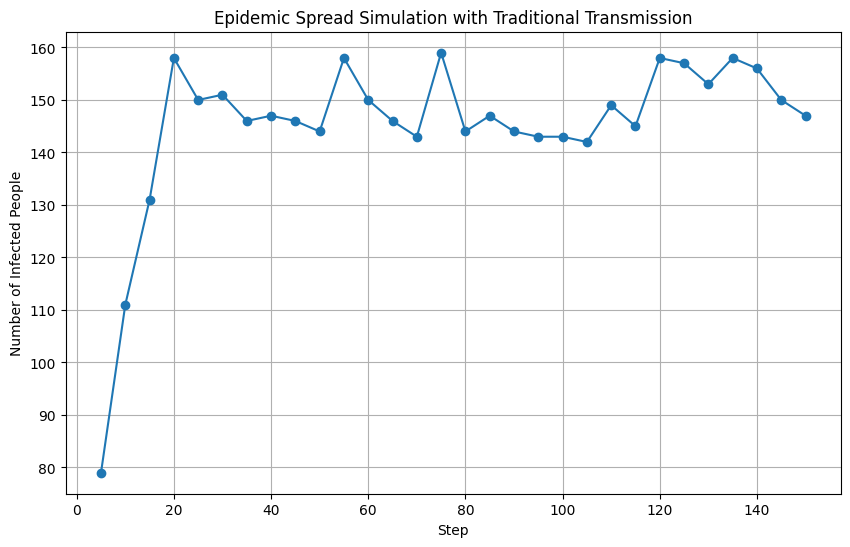

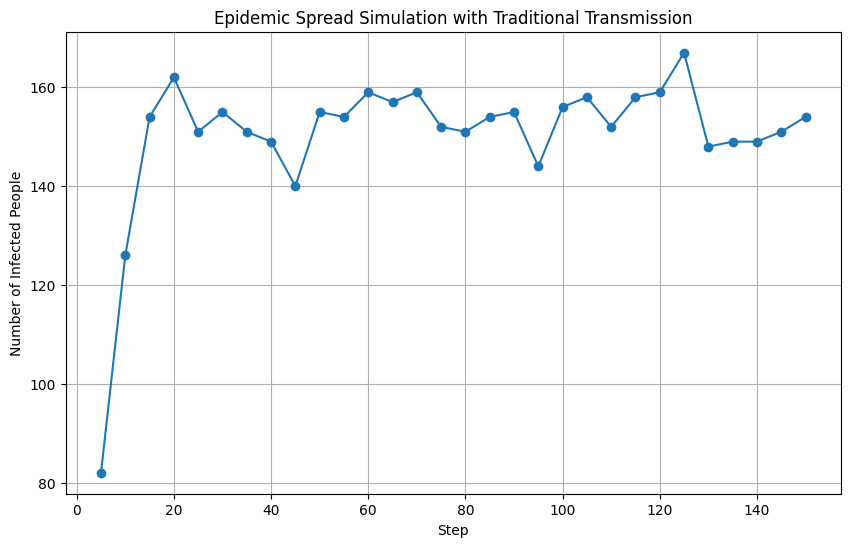

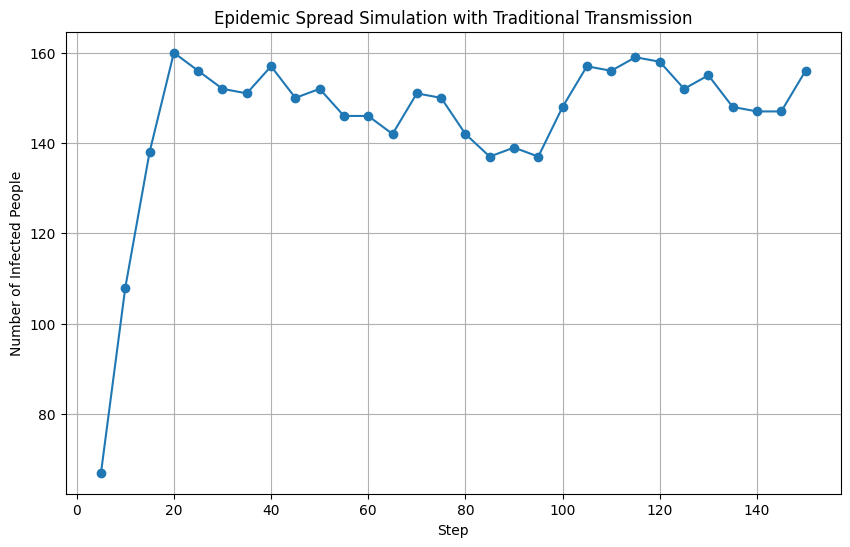

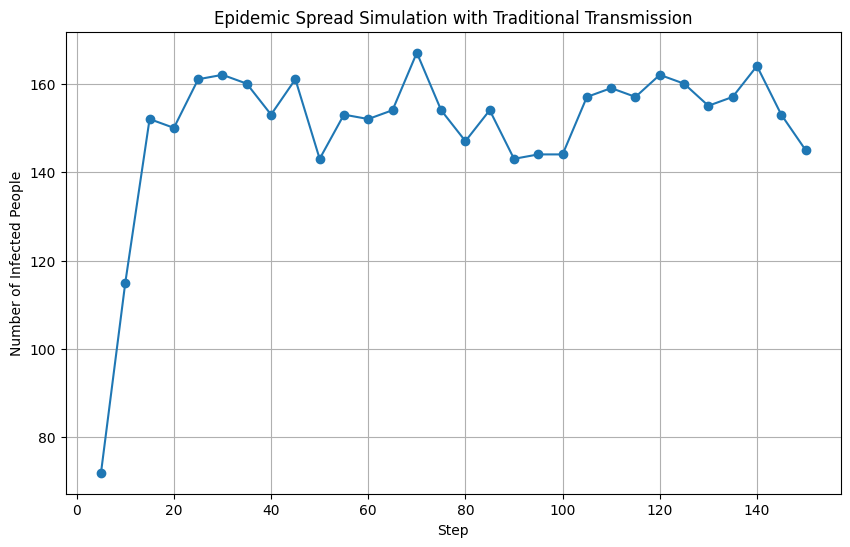

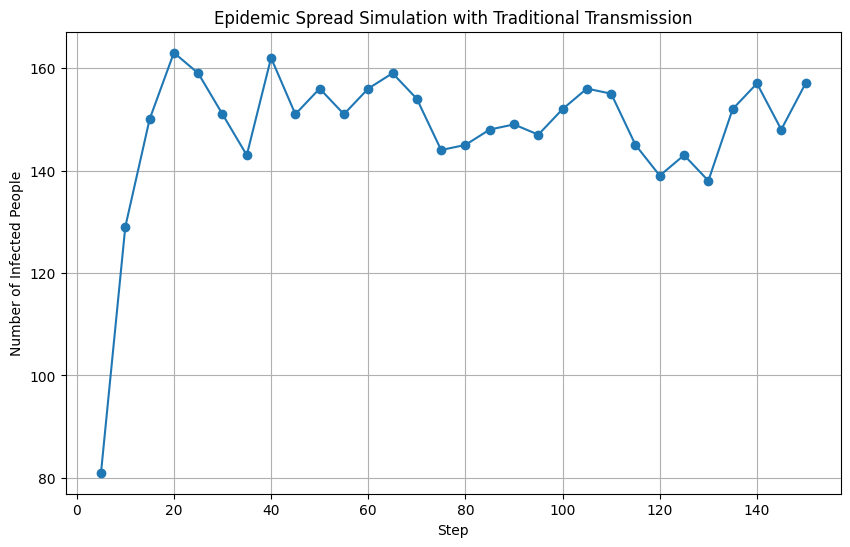

Simulating for Infection Rate=0.06, Recover Rate=0.06...


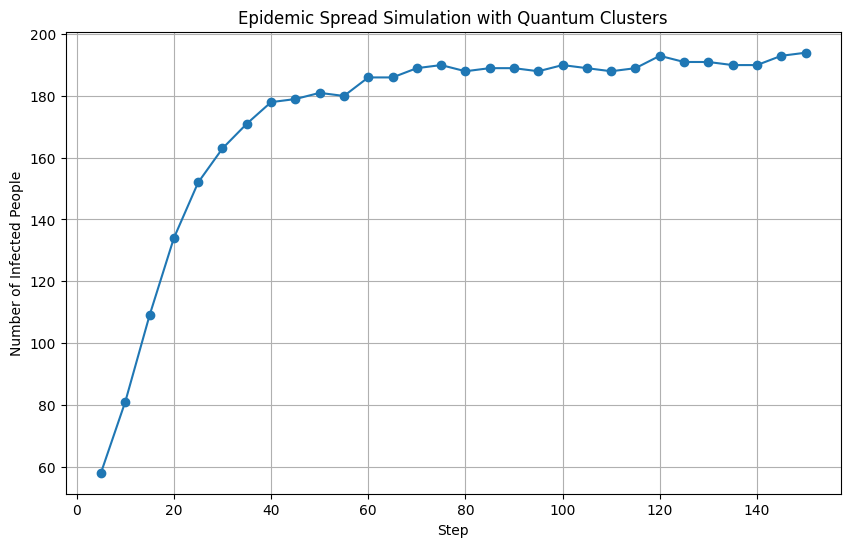

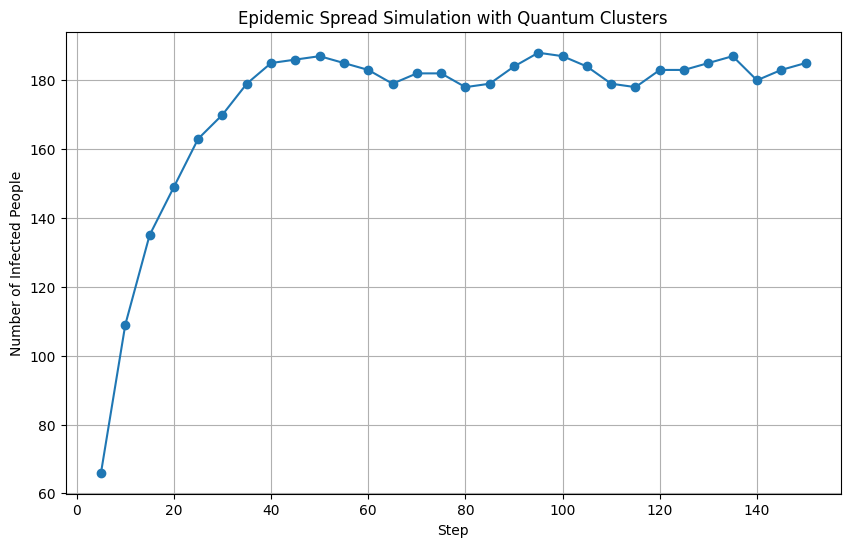

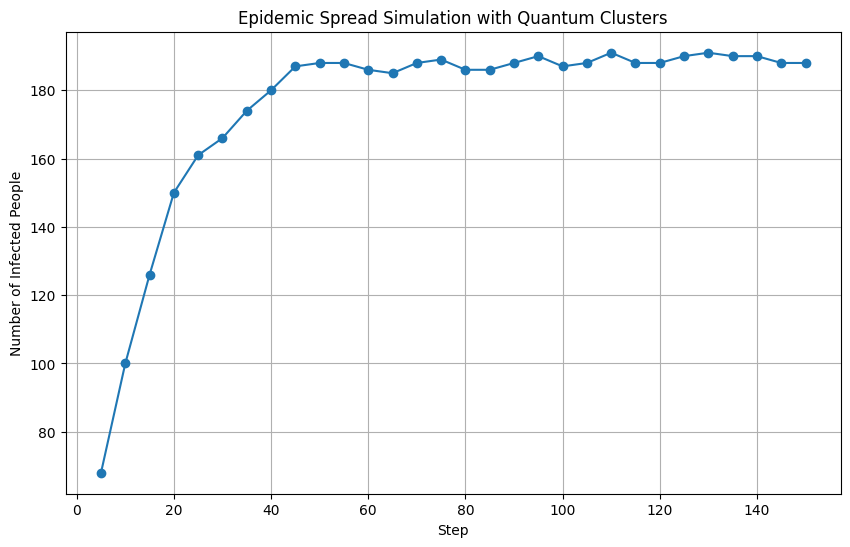

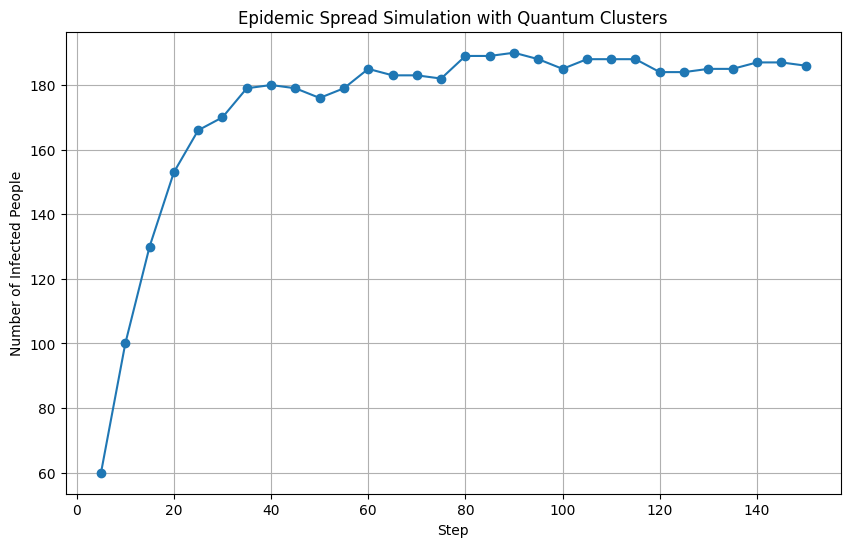

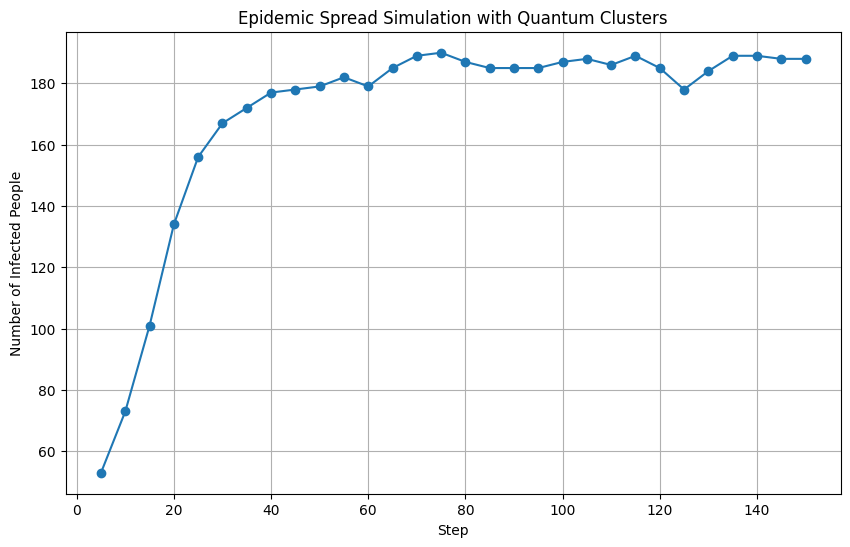

...

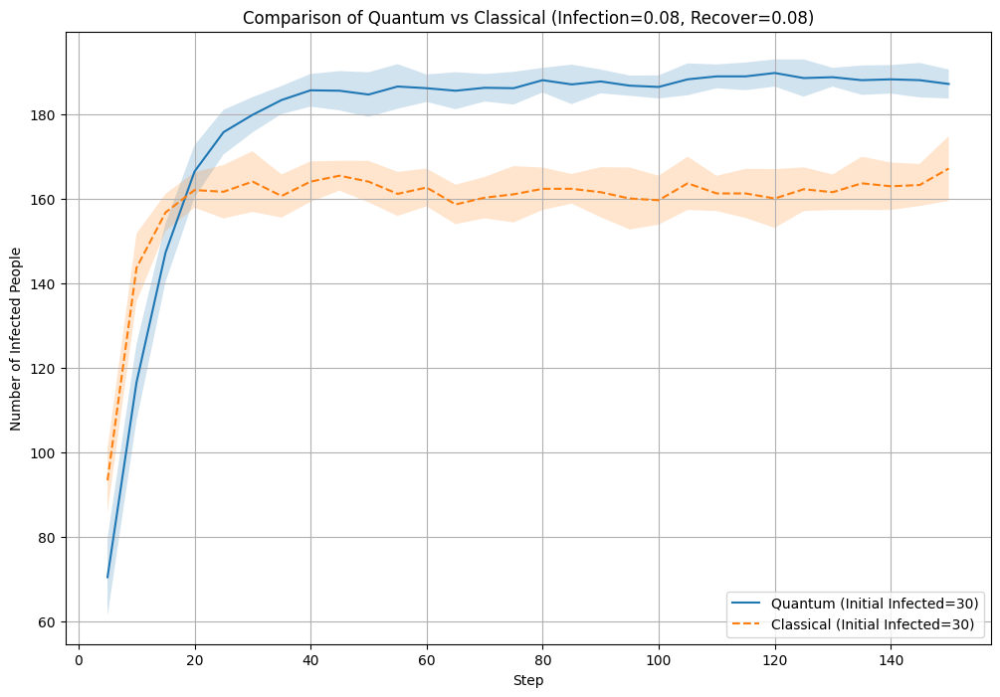

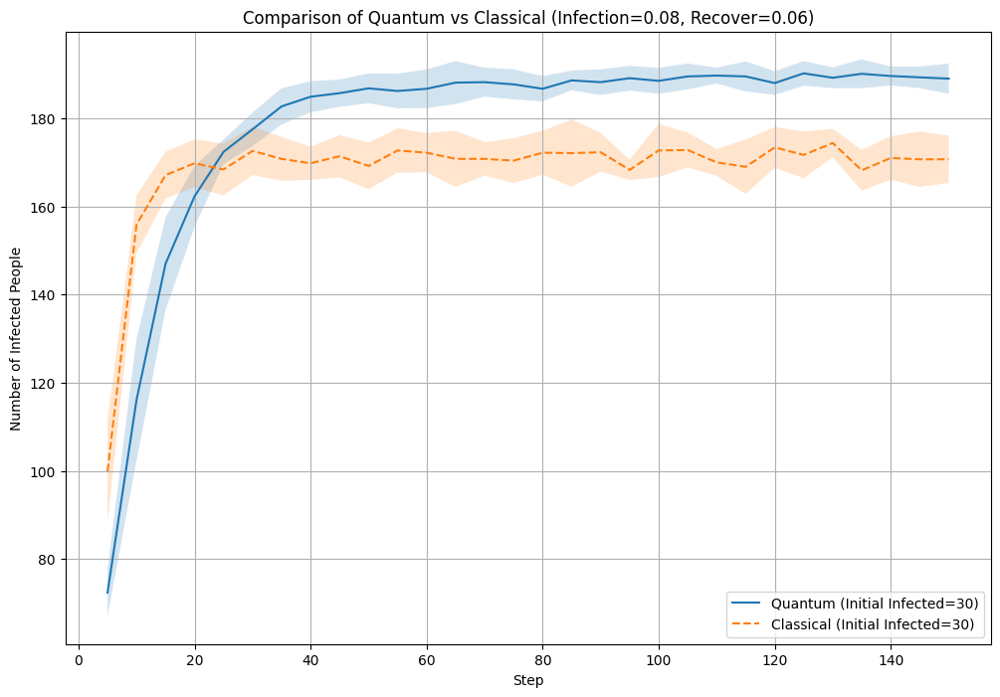

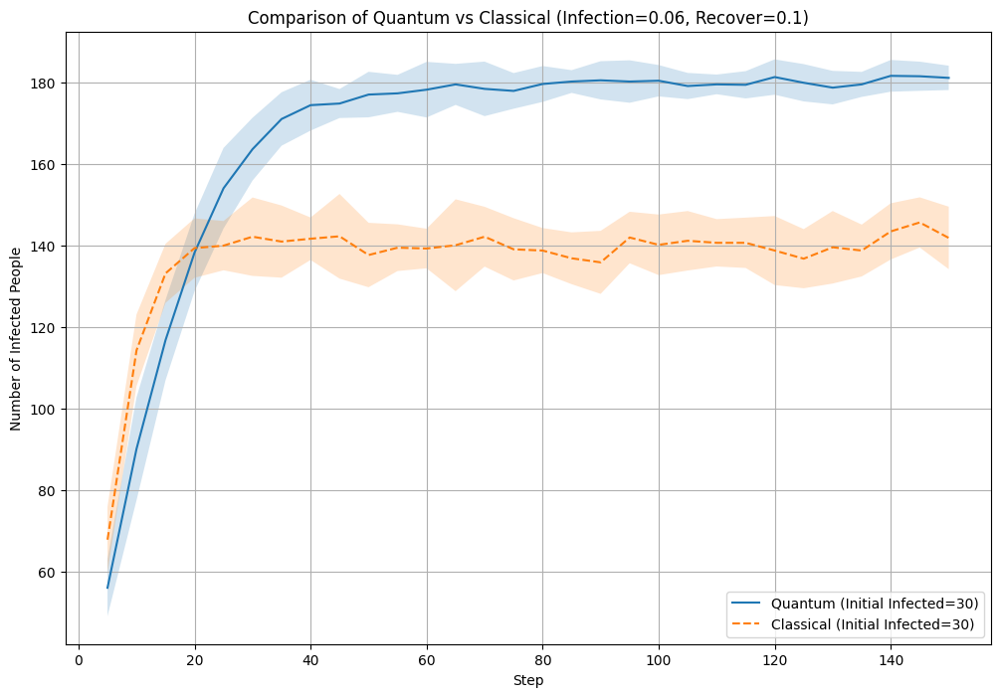

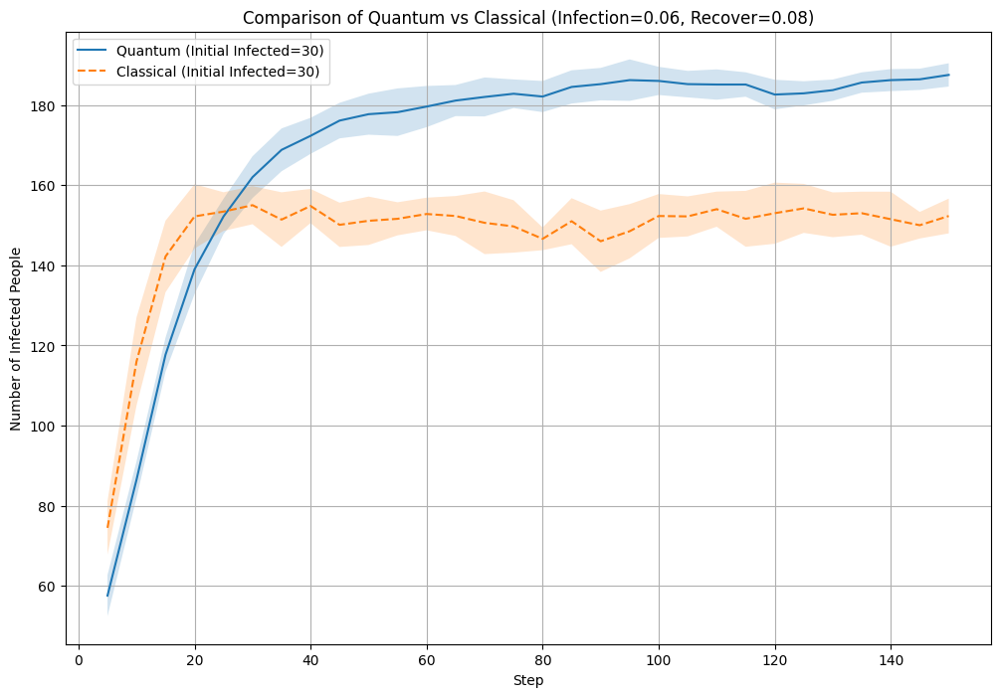

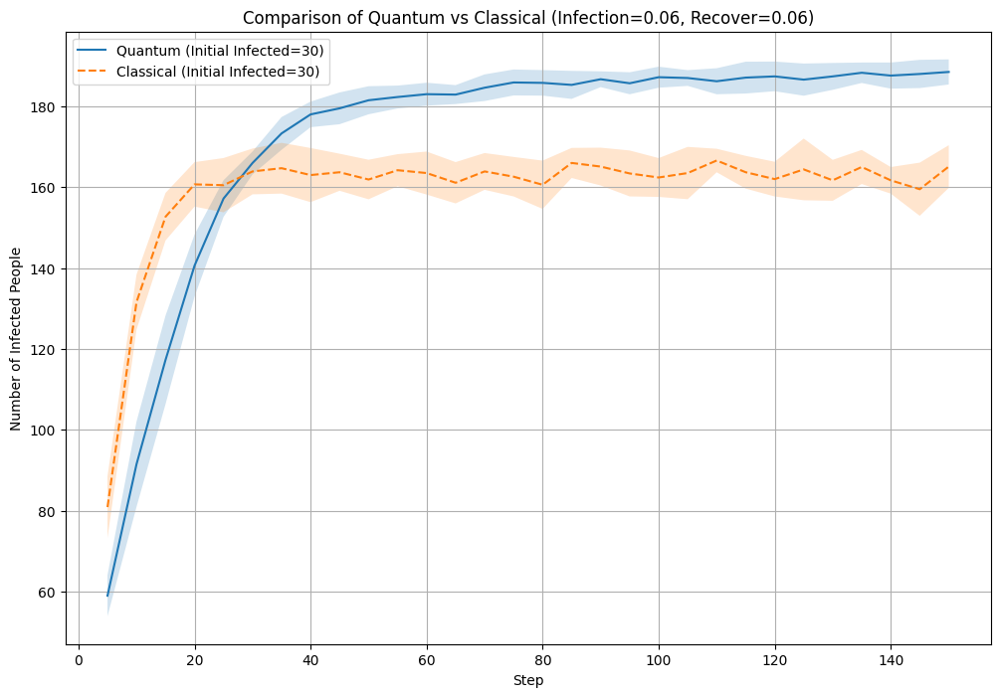

In [6]:
def compare_quantum_vs_classical_with_stats(
    infection_rates,
    recover_rates,
    num_people,
    num_clusters,
    intra_connections_per_cluster,
    total_inter_connections,
    initial_infected_values,
    num_steps=100,
    measure_interval=5,
    num_simulations=5,  # 每組參數重複模擬次數
):
    """
    比較有無量子電路的情況下，並計算平均與標準差
    """
    results = {
        "quantum": {},
        "classical": {},
    }

    # 遍歷參數組合
    for infection_rate in infection_rates:
        for recover_rate in recover_rates:
            print(f"Simulating for Infection Rate={infection_rate}, Recover Rate={recover_rate}...")

            for method in ["quantum", "classical"]:
                # 初始化儲存結果的結構
                results[method][(infection_rate, recover_rate)] = {}

                for initial_infected in initial_infected_values:
                    all_counts = []

                    for _ in range(num_simulations):
                        if method == "quantum":
                            counts = epidemic_simulation(
                                infection_rate=infection_rate,
                                recover_rate=recover_rate,
                                num_people=num_people,
                                initial_infected=initial_infected,
                                num_clusters=num_clusters,
                                intra_connections_per_cluster=intra_connections_per_cluster,
                                total_inter_connections=total_inter_connections,
                                num_steps=num_steps,
                                measure_interval=measure_interval,
                            )
                        else:
                            counts = traditional_epidemic_simulation(
                                infection_rate=infection_rate,
                                recover_rate=recover_rate,
                                num_people=num_people,
                                initial_infected=initial_infected,
                                num_clusters=num_clusters,
                                intra_connections_per_cluster=intra_connections_per_cluster,
                                total_inter_connections=total_inter_connections,
                                num_steps=num_steps,
                                measure_interval=measure_interval,
                            )
                        all_counts.append(counts)

                    # 計算平均值與標準差
                    avg_counts = np.mean(all_counts, axis=0)
                    std_counts = np.std(all_counts, axis=0)
                    results[method][(infection_rate, recover_rate)][initial_infected] = (avg_counts, std_counts)

    # 繪製結果
    steps = list(range(measure_interval, num_steps + 1, measure_interval))
    for infection_rate in infection_rates:
        for recover_rate in recover_rates:
            plt.figure(figsize=(12, 8))
            for method in ["quantum", "classical"]:
                for initial_infected, (avg_counts, std_counts) in results[method][(infection_rate, recover_rate)].items():
                    # 繪製平均值曲線
                    plt.plot(
                        steps,
                        avg_counts,
                        label=f"{method.capitalize()} (Initial Infected={initial_infected})",
                        linestyle="-" if method == "quantum" else "--",
                    )
                    # 繪製標準差陰影區域
                    plt.fill_between(
                        steps,
                        avg_counts - std_counts,
                        avg_counts + std_counts,
                        alpha=0.2,
                    )

            plt.xlabel("Step")
            plt.ylabel("Number of Infected People")
            plt.title(f"Comparison of Quantum vs Classical (Infection={infection_rate}, Recover={recover_rate})")
            plt.legend()
            plt.grid(True)
            plt.show()


# 呼叫函數進行模擬與比較
compare_quantum_vs_classical_with_stats(
    infection_rates=[0.1, 0.08, 0.06],
    recover_rates=[0.1, 0.08, 0.06],
    num_people=200,
    num_clusters=20,
    intra_connections_per_cluster=20,
    total_inter_connections=300,
    initial_infected_values=[30],
    num_steps=150,
    measure_interval=5,
    num_simulations=10,  # 每組參數進行 5 次模擬
)
